## CBC [ Study , Analysis , Detection ]
<img src="../images/binary.png" alt="Drawing" width="4000"/>


# 1 . 1  Load and Explore the Data

In [6]:
#  Environment preparation
import os
import numpy as np
import pandas as pd
import seaborn as sns 
import matplotlib.pyplot as plt
!pwd

/home/tallawi/CBC _model/Notebook


In [7]:
df = pd.read_csv("../D A T A/cbc_dataframe.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115487 entries, 0 to 115486
Data columns (total 20 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   WBC     103223 non-null  float64
 1   LY%     103028 non-null  float64
 2   MO%     103028 non-null  float64
 3   NE%     103028 non-null  float64
 4   EO%     103028 non-null  float64
 5   BA%     103028 non-null  float64
 6   LY#     103025 non-null  float64
 7   MO#     103025 non-null  float64
 8   NE#     103025 non-null  float64
 9   EO#     103025 non-null  float64
 10  BA#     103025 non-null  float64
 11  RBC     103226 non-null  float64
 12  HGB     103226 non-null  float64
 13  HCT     103226 non-null  float64
 14  MCV     103226 non-null  float64
 15  MCHC    103256 non-null  float64
 16  MCH     103226 non-null  float64
 17  RDW     103226 non-null  float64
 18  PLT     103224 non-null  float64
 19  MPV     103224 non-null  float64
dtypes: float64(20)
memory usage: 17.6 MB


# 2 . E D A
## 2.1 Describe DataFrame of CBC

- **WBC, NE#, LY#, MO#, EO#, BA#** — *White Blood Cells*
- **RBC, HGB, HCT, MCV, MCH, MCHC** — *Red Blood Cells*
- **RDW, PLT, MPV, PCT, PDW** — *Platelets*



In [9]:
df_describe = df.describe()
df_describe

,WBC,LY%,MO%,NE%,EO%,BA%,LY#,MO#,NE#,EO#,BA#,RBC,HGB,HCT,MCV,MCHC,MCH,RDW,PLT,MPV
count,103223.000000,103028.000000,103028.000000,103028.000000,1.030280e+05,1.030280e+05,103025.000000,1.030250e+05,103025.000000,1.030250e+05,1.030250e+05,103226.000000,103226.000000,103226.000000,103226.000000,103256.000000,103226.000000,103226.000000,103224.000000,103224.000000
mean,7.277570,33.523859,8.057079,54.760026,3.010505e+00,7.157763e-01,2.394228,5.696705e-01,4.051944,2.151090e-01,4.404562e-02,4.680069,13.789307,40.727993,87.236032,33.841624,29.536727,13.188014,269.453991,8.063437
std,2.916373,10.641101,2.326193,11.608960,2.414491e+00,5.030783e-01,1.998010,2.067735e-01,1.767045,1.932990e-01,6.235636e-02,0.479791,1.507143,4.291624,6.306672,0.973142,2.456663,1.309463,74.168485,0.928674
min,1.400000,2.600000,0.600000,0.800000,5.397605e-79,5.397605e-79,0.200000,5.397605e-79,0.100000,5.397605e-79,5.397605e-79,1.670000,5.400000,16.300000,35.400000,25.100000,10.200000,6.300000,4.000000,4.700000
25%,5.700000,26.200000,6.500000,47.800000,1.500000e+00,4.000000e-01,1.700000,4.000000e-01,2.800000,1.000000e-01,5.397605e-79,4.360000,12.800000,37.700000,83.600000,33.300000,28.200000,12.400000,219.000000,7.400000
50%,6.900000,32.400000,7.800000,55.800000,2.400000e+00,6.000000e-01,2.200000,5.000000e-01,3.800000,2.000000e-01,5.397605e-79,4.660000,13.700000,40.500000,87.800000,33.800000,29.800000,13.000000,261.000000,8.000000
75%,8.400000,39.700000,9.300000,62.800000,3.700000e+00,9.000000e-01,2.800000,7.000000e-01,4.900000,3.000000e-01,1.000000e-01,4.990000,14.800000,43.700000,91.400000,34.500000,31.100000,13.700000,311.000000,8.600000
max,400.000000,94.500000,66.900000,96.600000,5.720000e+01,3.540000e+01,358.800000,1.020000e+01,83.100000,8.400000e+00,4.700000e+00,9.160000,19.900000,59.900000,125.300000,69.600000,74.500000,37.800000,1021.000000,15.100000


## 2.2 Splitting
 Split dataframe vertically based on features 

 ### Data Division Overview

- **Dataset**
  - **RBC Features**
    - RBC: Red Blood Cell Count
    - HGB: Hemoglobin Level
    - HCT: Hematocrit Percentage
    - MCV: Mean Corpuscular Volume
    - MCH: Mean Corpuscular Hemoglobin
    - MCHC: Mean Corpuscular Hemoglobin Concentration
    - RDW: Red Cell Distribution Width
    - PLT: Platelet Count

  - **WBC Features**
    - WBC: White Blood Cell Count
    - NE#: Neutrophil Count
    - LY#: Lymphocyte Count
    - MO#: Monocyte Count
    - EO#: Eosinophil Count
    - BA#: Basophil Count
    - NE%: Neutrophil Relative count
    - LY%: Lymphocyte Relative count
    - MO%: Monocyte Relative count
    - EO%: Eosinophil Relative count
    - BA%: Basophil Relative count
    - PLT: Platelet Count

  - **Platelet Features**
    - PLT: Platelet Count
    - MPV: Mean Platelet Volume


In [11]:
rbc_features = ['RBC','HGB','HCT','MCV','MCH','MCHC','RDW','PLT']
wbc_features = ['WBC','NE#','LY#','MO#','EO#','BA#','NE%','LY%','MO%','EO%','BA%','PLT']
plt_features = ['PLT','MPV']
df_rbc = df[rbc_features]
df_wbc = df[wbc_features]
df_plt = df[plt_features]

# 3. RBC -EDA- <img src="../images/rbc.png" alt="Smiley face" width="30" height="30" style="vertical-align:middle;margin:0px 50px">
## 3.1 Splitting data fram based on HGB ,RBC
 
### Data Splitting Overview

In this analysis, the data has been divided into multiple sections based on specific criteria related to blood measurements:

#### 1. **Primary Data Splitting**
The data has been initially divided into three main groups based on Hemoglobin (HGB) and Red Blood Cells (RBC) levels:

- **Anemia DataFrame (`df_anemia`)**: Contains records where:
  - HGB < 12.0 or RBC < 3.8 (indicating anemia).

- **Greater RBC DataFrame (`df_RBC_GREATER`)**: Contains records where:
  - HGB > 17.5 or RBC > 5.9 (indicating elevated levels).

- **Normal RBC DataFrame (`df_RBC_NORMAL`)**: Contains records with normal ranges:
  - HGB is within the interval [12.0, 17.5]
  - RBC is within the interval [3.8, 5.9]

#### 2. **Anemia Classification**
The `df_anemia` DataFrame is further classified into three types of anemia based on MCV (Mean Corpuscular Volume):

- **Microcytic Anemia**: MCV < 80
- **Normocytic Anemia**: 80 ≤ MCV ≤ 100
- **Macrocytic Anemia**: MCV > 100

This structured approach allows for a clearer analysis of the relationships between blood parameters and different types of anemia.
<img src="../images/mermaid-diagram-1.png" alt="chart1" />


In [7]:

# Function to classify anemia based on MCV value
def classify_anemia(row):
    if row['MCV'] < 80:  # Microcytic
        return 'Microcytic'
    elif 80 <= row['MCV'] <= 100:  # Normocytic
        return 'Normocytic'
    elif row['MCV'] > 100:  # Macrocytic
        return 'Macrocytic'
    else:
        return 'Unknown'

# Splitting the data based on HGB and RBC values
df_anemia = df_rbc[(df_rbc['HGB'] < 12.0) | (df_rbc['RBC'] < 3.8)]


# Define normal ranges
hgb_normal_range = pd.Interval(left=12.0, right=17.5, closed='both')  # Adjust right value based on gender if needed
rbc_normal_range = pd.Interval(left=3.8, right=5.9, closed='both')

# Filter DataFrame based on normal ranges
df_RBC_NORMAL = df_rbc[
    df_rbc['HGB'].apply(lambda x: x in hgb_normal_range) & 
    df_rbc['RBC'].apply(lambda x: x in rbc_normal_range)
]

df_RBC_GREATER = df_rbc[
    ( df_rbc['HGB'].apply(lambda x: x in hgb_normal_range) &  (df_rbc['RBC'] >5.9) ) |
    ( df_rbc['RBC'].apply(lambda x: x in rbc_normal_range) &  (df_rbc['HGB'] > 17.5) ) |
    ((df_rbc['HGB'] > 17.5) & (df_rbc['RBC'] >5.9))
    
]


# Applying anemia classification to the df_anemia DataFrame
df_anemia['AnemiaType'] = df_anemia.apply(classify_anemia, axis=1)

# # Print results
# print("========================================= Anemia Data =========================================")
# display(df_anemia['AnemiaType'].value_counts())

# print("========================================= df_RBC_NORMAL Data =========================================")
# display(df_RBC_NORMAL.head())

# print("========================================= df_RBC_GREATER Data =========================================")
# display(df_RBC_GREATER.head())

# # Optional: Save these tables to CSV files if needed
# df_anemia.to_csv('anemia_data.csv', index=False)
# df_RBC_NORMAL.to_csv('df_RBC_NORMAL.csv', index=False)
# df_RBC_GREATER.to_csv('df_RBC_GREATER.csv', index=False)

NameError: name 'df_rbc' is not defined

In [14]:
display(df_anemia['AnemiaType'].value_counts())

AnemiaType
Normocytic    6099
Microcytic    4173
Macrocytic     390
Name: count, dtype: int64

## 3.2 Anemia -EDA-
### 3.2.1 Splitting the dataframe **(`df_anemia`)** based on the type of anemia :
<p align="center">
<h3>- Microcytic Anemia</h3>
<h3>- Normocytic Anemia</h3>
<h3>- Macrocytic Anemia</h3>

  <img src="../images/anemiatype.gif" width="700" height="100" style="vertical-align:middle;margin:0px 50px">
</p>

In [16]:

df_microcytic = df_anemia[df_anemia['AnemiaType'] == 'Microcytic']
df_normocytic = df_anemia[df_anemia['AnemiaType'] == 'Normocytic']
df_macrocytic = df_anemia[df_anemia['AnemiaType'] == 'Macrocytic']


## 3.2.2 describe Anemia Types : 

In [18]:

print( '========================================= All Anemia =========================================')
df_anemia.describe()
print( '========================================= Microcytic =========================================')
df_microcytic.describe()
print( '========================================= Normocytic =========================================')
df_normocytic.describe()
print( '========================================= Macrocytic =========================================')
df_macrocytic.describe()

========================================= All Anemia =========================================


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT
count,10662.000000,10662.000000,10662.000000,10662.000000,10662.000000,10662.000000,10662.000000,10660.000000
mean,4.158388,11.261799,33.906368,82.554014,27.471028,33.194907,14.493707,294.031426
std,0.521788,0.902550,2.386157,9.876816,3.929635,1.358840,2.265094,93.237897
min,1.670000,5.400000,16.300000,35.400000,10.200000,25.100000,10.900000,13.000000
25%,3.780000,11.000000,33.000000,76.400000,25.100000,32.400000,12.900000,232.000000
50%,4.130000,11.500000,34.300000,82.300000,27.500000,33.300000,13.900000,285.000000
75%,4.457500,11.800000,35.400000,89.000000,29.900000,34.000000,15.500000,345.000000
max,7.170000,15.100000,43.600000,125.300000,74.500000,69.600000,37.500000,1000.000000


========================================= Microcytic =========================================


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT
count,4173.000000,4173.000000,4173.000000,4173.000000,4173.000000,4173.000000,4173.000000,4171.000000
mean,4.600074,10.906470,33.481260,73.083321,23.825833,32.540546,15.595399,327.059698
std,0.442420,1.031859,2.705259,5.731584,2.467794,1.341040,2.537076,92.476521
min,2.740000,5.400000,19.700000,35.400000,10.200000,25.200000,11.000000,53.000000
25%,4.330000,10.500000,32.400000,69.800000,22.300000,31.700000,13.800000,265.000000
50%,4.550000,11.300000,34.000000,74.800000,24.400000,32.600000,15.100000,317.000000
75%,4.820000,11.600000,35.300000,77.600000,25.700000,33.400000,16.800000,377.000000
max,7.170000,11.900000,39.000000,79.900000,29.200000,37.000000,36.500000,818.000000


========================================= Normocytic =========================================


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT
count,6099.000000,6099.000000,6099.000000,6099.000000,6099.000000,6099.000000,6099.000000,6099.000000
mean,3.903356,11.444975,34.082013,87.628578,29.436104,33.578537,13.762141,276.241679
std,0.319404,0.658179,1.974504,5.372072,2.235575,1.091480,1.694535,85.819595
min,1.710000,5.900000,16.300000,80.000000,21.300000,25.100000,10.900000,13.000000
25%,3.700000,11.200000,33.300000,83.000000,27.700000,32.800000,12.600000,219.000000
50%,3.920000,11.600000,34.400000,86.700000,29.000000,33.500000,13.400000,266.000000
75%,4.140000,11.800000,35.300000,91.600000,31.000000,34.200000,14.500000,322.000000
max,4.920000,15.000000,41.700000,100.000000,42.800000,44.200000,37.500000,1000.000000


========================================= Macrocytic =========================================


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT
count,390.000000,390.000000,390.000000,390.000000,390.000000,390.000000,390.000000,390.000000
mean,3.420641,12.199231,35.708205,104.532051,35.743846,34.197179,14.146154,219.002564
std,0.323976,1.163332,3.280398,4.309877,2.801028,2.175552,2.243259,93.669509
min,1.670000,8.200000,17.900000,100.100000,32.300000,31.700000,11.200000,38.000000
25%,3.300000,11.500000,34.325000,101.500000,34.325000,33.300000,12.700000,162.250000
50%,3.490000,12.400000,36.400000,103.200000,35.300000,34.000000,13.650000,208.000000
75%,3.660000,12.900000,37.800000,106.275000,36.400000,34.700000,14.900000,263.000000
max,3.790000,15.100000,43.600000,125.300000,74.500000,69.600000,30.500000,1000.000000


<Figure size 800x600 with 0 Axes>

<Axes: xlabel='AnemiaType', ylabel='RBC'>

Text(0.5, 1.0, 'Violin Plot for RBC')

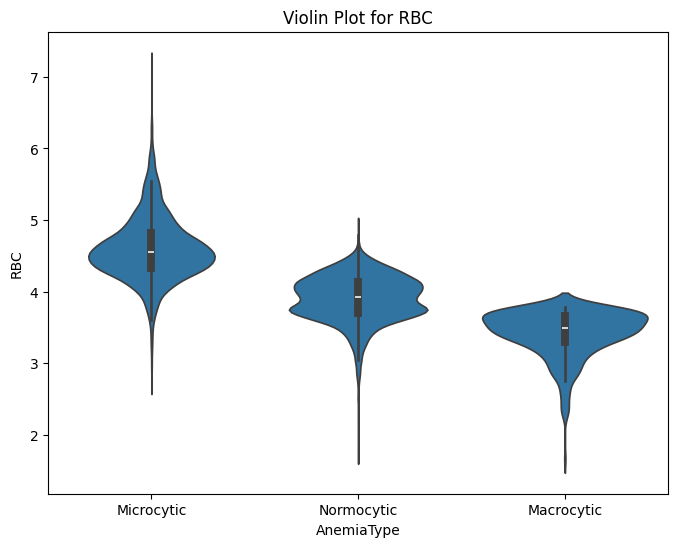

<Figure size 800x600 with 0 Axes>

<Axes: xlabel='AnemiaType', ylabel='HGB'>

Text(0.5, 1.0, 'Violin Plot for HGB')

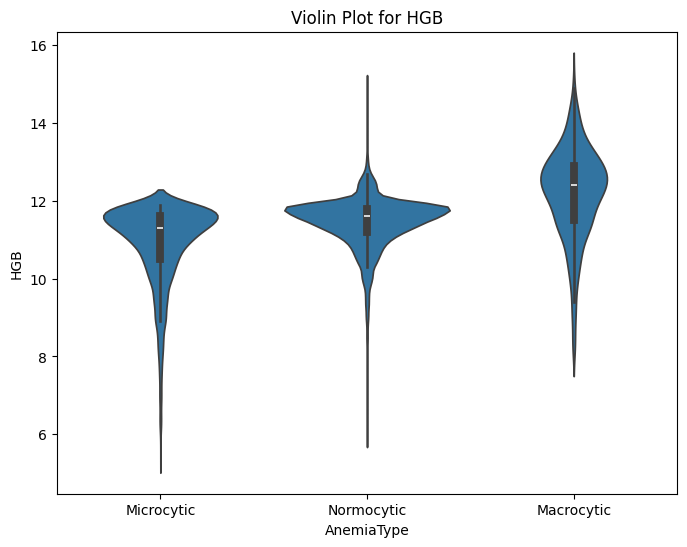

<Figure size 800x600 with 0 Axes>

<Axes: xlabel='AnemiaType', ylabel='HCT'>

Text(0.5, 1.0, 'Violin Plot for HCT')

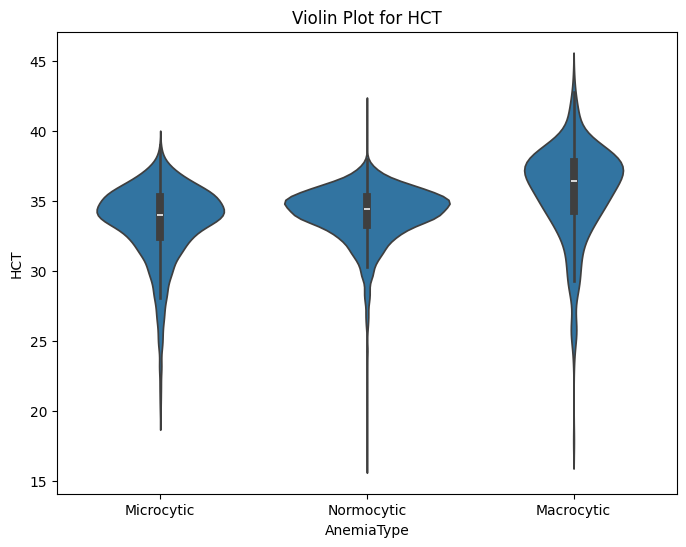

<Figure size 800x600 with 0 Axes>

<Axes: xlabel='AnemiaType', ylabel='MCV'>

Text(0.5, 1.0, 'Violin Plot for MCV')

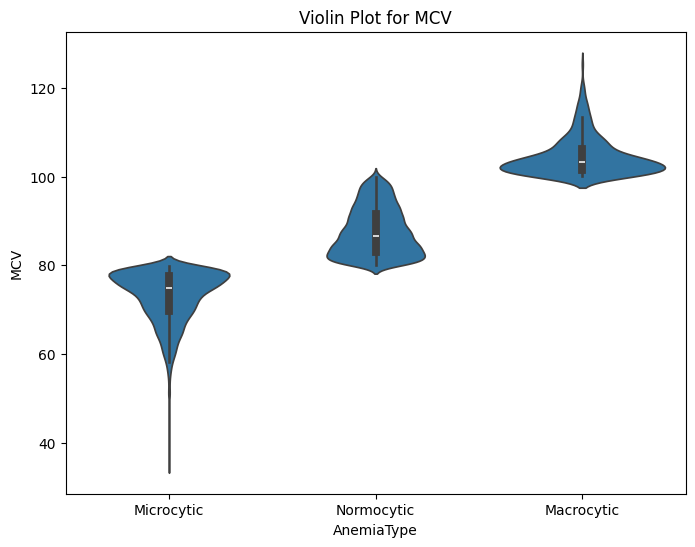

<Figure size 800x600 with 0 Axes>

<Axes: xlabel='AnemiaType', ylabel='MCH'>

Text(0.5, 1.0, 'Violin Plot for MCH')

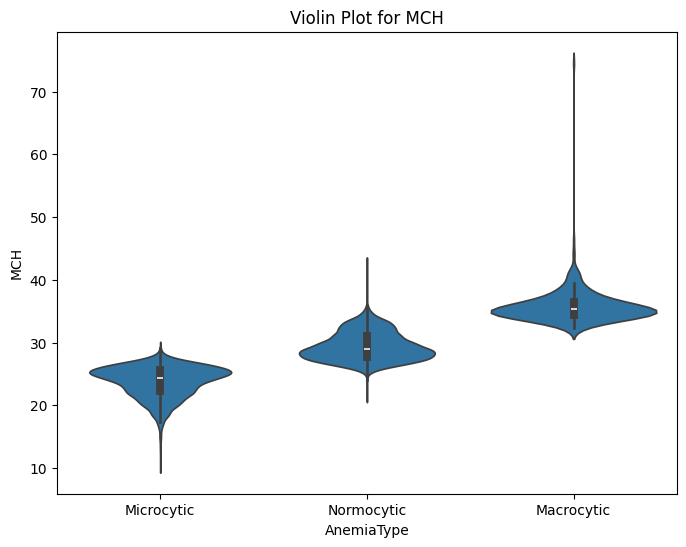

<Figure size 800x600 with 0 Axes>

<Axes: xlabel='AnemiaType', ylabel='MCHC'>

Text(0.5, 1.0, 'Violin Plot for MCHC')

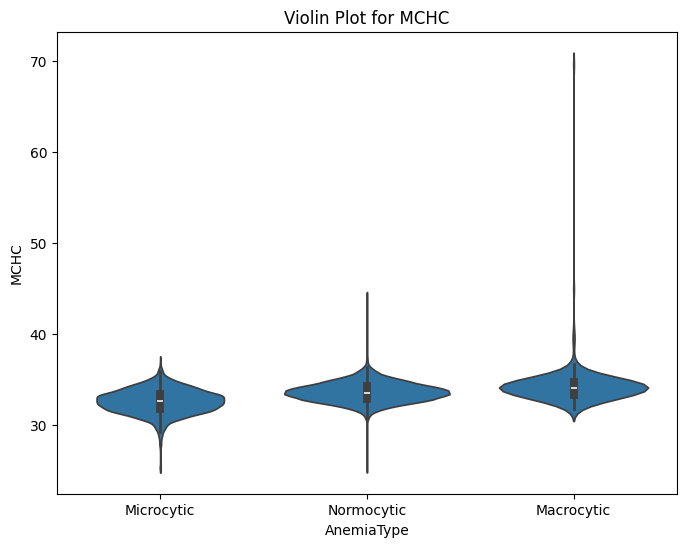

<Figure size 800x600 with 0 Axes>

<Axes: xlabel='AnemiaType', ylabel='RDW'>

Text(0.5, 1.0, 'Violin Plot for RDW')

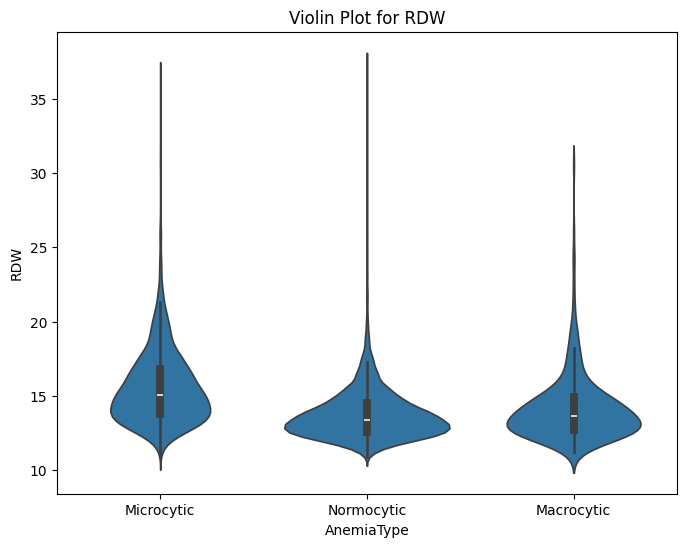

<Figure size 800x600 with 0 Axes>

<Axes: xlabel='AnemiaType', ylabel='PLT'>

Text(0.5, 1.0, 'Violin Plot for PLT')

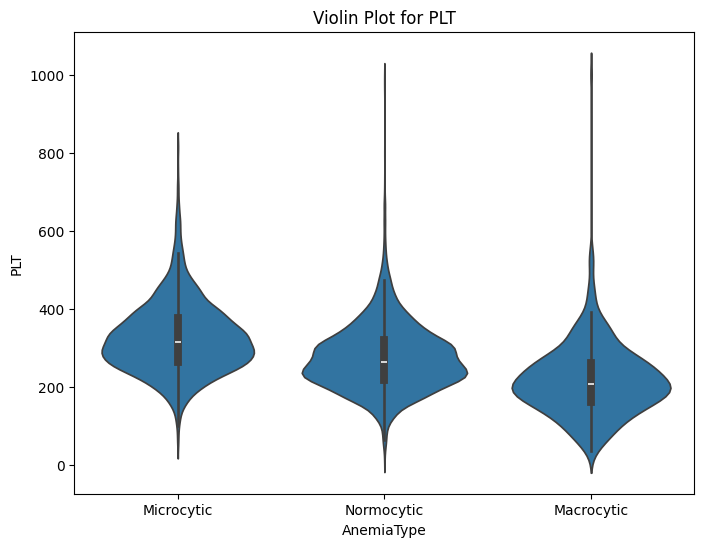

In [19]:
numeric_columns = df_anemia.select_dtypes(include=[np.number]).columns.tolist()

for feature in numeric_columns:
    plt.figure(figsize=(8, 6))
    sns.violinplot(x='AnemiaType', y=feature, data=df_anemia)
    plt.title(f'Violin Plot for {feature}')
    plt.show()


## 3.2.3 Comment:

### Post-analysis observations

1. **HGB and RBC distribution:**
- There is a significant difference in the distribution of *HGB* and *RBC* across anemia types.
- This indicates that the type of anemia affects different levels in the blood cells
- Especially RBC where it is clearly shown > microcytic > normocytic > macrocytic

#### <span style="color: #03a31e;"> An increase in the number of red_blood_cells(RBC) does not necessarily mean an increase in hemoglobin(HGB). We see this clearly in the hgb and rbc in the violinplot where the microcytic has a higher number but shows a lower distribution of hemoglobin and vice versa for the macrocytic. 
</span>

2. **HCT and PLT variation:**
- Slight variation in *HCT* and *PLT* was observed across different anemia types.

3. **MCH and MCHC variations:**
- There is a significant difference in *MCH* values ​​although *MCHC* is unchanged

4. **Macrocytic vs. Microcytic and Normocytic Anemia:**
- *Macrocytic anemia* shows significant differences in several features compared to *Microcytic* and *Normocytic* anemia types.
- Although the overall values ​​may appear similar, the *violin plot* revealed distinct details and patterns, highlighting the uniqueness of macrocytic anemia.
## <span style="color: #00678c;">  In general, deeper insights will be revealed through correlation analysis. [Correlation]
</span>


## 3.2.4 Correlation Anemia Types : 

In [22]:
def correlation_plots(correlation_matrices, titles, layout='single', fig_size=(7, 7)):
    """
    Plot correlation heatmaps for one or multiple matrices.
    
    Parameters:
    - correlation_matrices (list of DataFrames): List of correlation matrices to plot.
    - titles (list of str): List of titles for each correlation matrix.
    - layout (str): Layout of plots ('single' or 'multi') - 'single' to plot each separately, 'multi' to plot them together.
    - fig_size (tuple): Size of each plot (for 'single') or of entire figure (for 'multi').
    """
    num_plots = len(correlation_matrices)
    
    if layout == 'single':
        # Plot each matrix in a separate figure
        for i in range(num_plots):
            plt.figure(figsize=fig_size)
            sns.heatmap(correlation_matrices[i], annot=True, fmt=".2f", cmap='coolwarm', square=True)
            plt.title(titles[i])
            plt.show()
    elif layout == 'multi':
        # Plot all matrices in a single figure with subplots
        cols = min(num_plots, 3)  # Up to 3 per row for better layout
        rows = (num_plots + cols - 1) // cols
        fig, axes = plt.subplots(rows, cols, figsize=fig_size)
        axes = axes.flatten() if num_plots > 1 else [axes]  # Flatten axes for easy indexing
        
        for i in range(num_plots):
            sns.heatmap(correlation_matrices[i], annot=True, fmt=".2f", cmap='coolwarm', square=True, ax=axes[i])
            axes[i].set_title(titles[i])
        
        # Hide any extra subplots
        for j in range(i + 1, len(axes)):
            axes[j].axis('off')
            
        plt.tight_layout()
        plt.show()



def scatter_plot(fet_1,fet_2 , DataFrame):
    plt.figure(figsize=(10,6))
    sns.regplot(data=DataFrame, x=fet_1, y=fet_2, scatter=True, order=1, label='Linear')
    
    # (polynomial)
    sns.regplot(data=DataFrame, x=fet_1, y=fet_2, scatter=True, order=2, label='Polynomial')
    
    plt.title(f'{fet_1} vs {fet_2}: Linear vs Non-linear Relationship')
    plt.legend()
    plt.show()
    
    
def compare_scatter_plots(fet_1, fet_2):
    """
    Plots scatter plots with linear and polynomial regression for three anemia types.
    
    Parameters:
    -----------
    fet_1 : str
        Name of the first feature (x-axis)
    fet_2 : str
        Name of the second feature (y-axis)
    """
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6))
    
    # Microcytic plot
    sns.regplot(data=df_microcytic.sample(frac=1), x=fet_1, y=fet_2, 
                scatter=True, order=1, label='Linear', ax=ax1, color='blue')
    sns.regplot(data=df_microcytic.sample(frac=1), x=fet_1, y=fet_2, 
                scatter=True, order=2, label='Polynomial', ax=ax1, color='red')
    ax1.set_title(f'Microcytic\n{fet_1} vs {fet_2}')
    ax1.legend()

    # Normocytic plot
    sns.regplot(data=df_normocytic.sample(frac=1), x=fet_1, y=fet_2, 
                scatter=True, order=1, label='Linear', ax=ax2, color='blue')
    sns.regplot(data=df_normocytic.sample(frac=1), x=fet_1, y=fet_2, 
                scatter=True, order=2, label='Polynomial', ax=ax2, color='red')
    ax2.set_title(f'Normocytic\n{fet_1} vs {fet_2}')
    ax2.legend()

    # Macrocytic plot
    sns.regplot(data=df_macrocytic.sample(frac=1), x=fet_1, y=fet_2, 
                scatter=True, order=1, label='Linear', ax=ax3, color='blue')
    sns.regplot(data=df_macrocytic.sample(frac=1), x=fet_1, y=fet_2, 
                scatter=True, order=2, label='Polynomial', ax=ax3, color='red')
    ax3.set_title(f'Macrocytic\n{fet_1} vs {fet_2}')
    ax3.legend()

    # Overall plot title and layout
    plt.suptitle(f'Comparison of {fet_1} vs {fet_2} Relationship Across Anemia Types', 
                 y=1.05, fontsize=14)
    plt.tight_layout()
    plt.show()


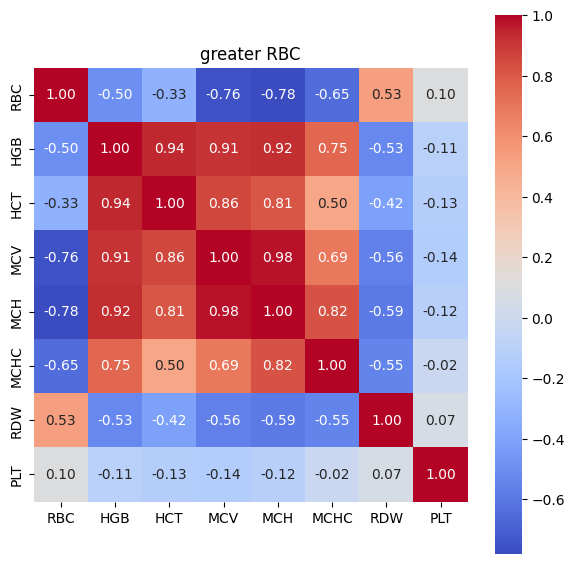

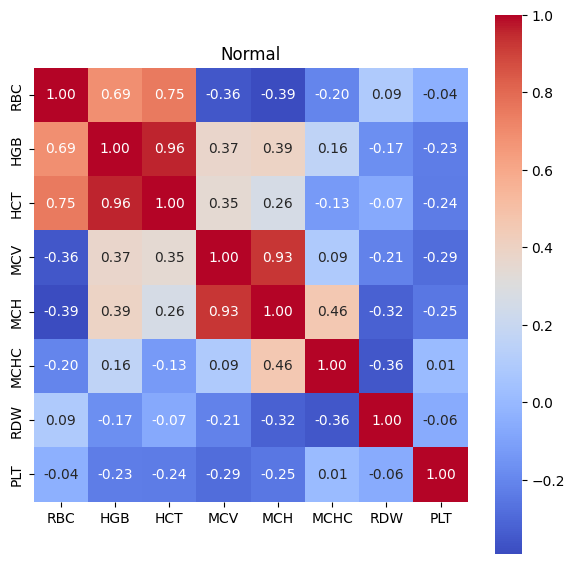

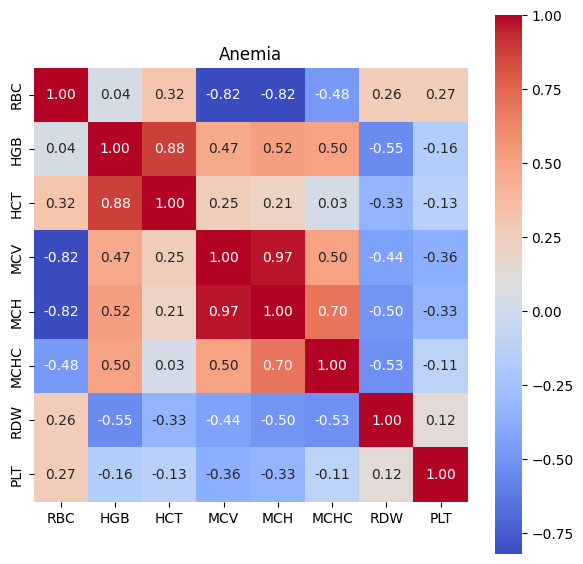

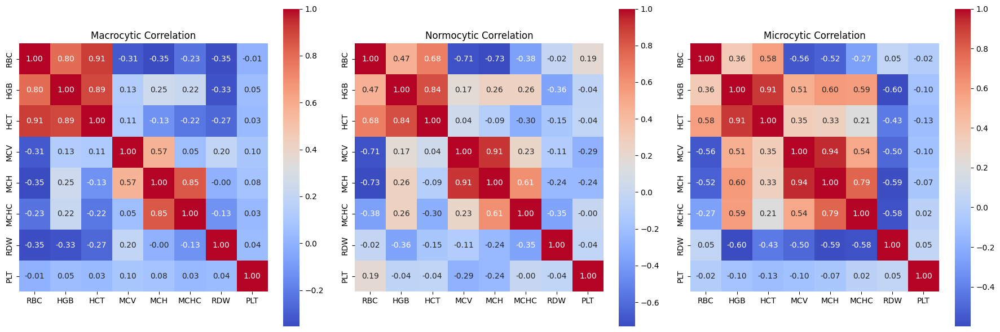

In [23]:
# General correlation matrix
correlation_matrix = df_anemia.drop(['AnemiaType'], axis=1).corr()  # Adding axis=1 to drop column
# Microcytic correlation matrix
correlation_matrix_micro = df_microcytic.drop(['AnemiaType'], axis=1).corr()
# Normocytic correlation matrix
correlation_matrix_normo = df_normocytic.drop(['AnemiaType'], axis=1).corr()
# Macrocytic correlation matrix
correlation_matrix_macro = df_macrocytic.drop(['AnemiaType'], axis=1).corr()
correlation_matrix_greater = df_RBC_GREATER.corr()
correlation_matrix_normal = df_RBC_NORMAL.corr() # Adding axis=1 to drop column
# Display the plots
correlation_plots([correlation_matrix_greater], ['greater RBC'], layout='single', fig_size=(7, 7))
correlation_plots([correlation_matrix_normal], ['Normal'], layout='single', fig_size=(7, 7))
correlation_plots([correlation_matrix], ['Anemia'], layout='single', fig_size=(7, 7))
correlation_plots(
    correlation_matrices=[correlation_matrix_macro, correlation_matrix_normo, correlation_matrix_micro],
    titles=['Macrocytic Correlation', 'Normocytic Correlation', 'Microcytic Correlation'],
    layout='multi', 
    fig_size=(18, 6)
)


In [24]:
def create_correlation_comparison(correlation_matrices):
    """
    Analysis of correlations between variables for different types of anemia

    Parameters:
    correlation_matrices(dict): Dictionaries containing correlation matrices for each type of anemia

    Returns:
    pd.DataFrame: Table containing comparison of strong correlations between variables
    """
    # Definition of corr boundaries    
    UPPER_THRESHOLD = 0.5
    LOWER_THRESHOLD = -0.4
    
    all_relations = []
    
    # processing of all types of anemia
    for anemia_type, corr_matrix in correlation_matrices.items():
        # Get the upper triangle of the correlation matrix to avoid duplication.
        upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
        
        # Identifying strong associations
        strong_correlations = upper_triangle[
            (upper_triangle >= UPPER_THRESHOLD) | 
            (upper_triangle <= LOWER_THRESHOLD)
        ]
        
        # Gather strong relationships
        for feature1, row in strong_correlations.items():
            for feature2, corr_value in row.dropna().items():
                relation = f"{feature1}/{feature2}"
                all_relations.append({
                    'Relation': relation,
                    'Anemia_Type': anemia_type,
                    'Correlation': corr_value
                })
    
    
    relations_df = pd.DataFrame(all_relations)
    
    comparison_df = relations_df.pivot(
        index='Relation',
        columns='Anemia_Type',
        values='Correlation'
    ).reset_index()
    
    comparison_df.fillna('No Strong Correlation', inplace=True)
    
    return comparison_df

anemia_types = ['Microcytic', 'Normocytic', 'Macrocytic']
correlation_matrices = {
    'Microcytic': correlation_matrix_micro,
    'Normocytic': correlation_matrix_normo,
    'Macrocytic': correlation_matrix_macro
}

comparison_df = create_correlation_comparison(correlation_matrices)

/tmp/ipykernel_229411/3457685355.py:47: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'No Strong Correlation' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  comparison_df.fillna('No Strong Correlation', inplace=True)


In [25]:
# Sort by Microcytic correlations in descending order
comparison_df_micro = comparison_df.sort_values(by='Microcytic', ascending=False, key=lambda col: pd.to_numeric(col, errors='coerce')).reset_index(drop=True)

# Sort by Normocytic correlations in descending order
comparison_df_normo = comparison_df.sort_values(by='Normocytic', ascending=False, key=lambda col: pd.to_numeric(col, errors='coerce')).reset_index(drop=True)

# Sort by Macrocytic correlations in descending order
comparison_df_macro = comparison_df.sort_values(by='Macrocytic', ascending=False, key=lambda col: pd.to_numeric(col, errors='coerce')).reset_index(drop=True)

# Display the sorted dataframes
print("Sorted by Microcytic Correlations:")
display(comparison_df_micro)

print("\nSorted by Normocytic Correlations:")
display(comparison_df_normo)

print("\nSorted by Macrocytic Correlations:")
display(comparison_df_macro)


Sorted by Microcytic Correlations:


Anemia_Type,Relation,Macrocytic,Microcytic,Normocytic
0,MCH/MCV,0.568328,0.942376,0.907741
1,HCT/HGB,0.890908,0.911632,0.8421
2,MCHC/MCH,0.849202,0.785546,0.61267
3,MCH/HGB,No Strong Correlation,0.595587,No Strong Correlation
4,MCHC/HGB,No Strong Correlation,0.586565,No Strong Correlation
5,HCT/RBC,0.910305,0.576826,0.675305
6,MCHC/MCV,No Strong Correlation,0.5418,No Strong Correlation
7,MCV/HGB,No Strong Correlation,0.511875,No Strong Correlation
8,RDW/HCT,No Strong Correlation,-0.428533,No Strong Correlation
9,RDW/MCV,No Strong Correlation,-0.497541,No Strong Correlation



Sorted by Normocytic Correlations:


Anemia_Type,Relation,Macrocytic,Microcytic,Normocytic
0,MCH/MCV,0.568328,0.942376,0.907741
1,HCT/HGB,0.890908,0.911632,0.8421
2,HCT/RBC,0.910305,0.576826,0.675305
3,MCHC/MCH,0.849202,0.785546,0.61267
4,MCV/RBC,No Strong Correlation,-0.557991,-0.705971
5,MCH/RBC,No Strong Correlation,-0.523413,-0.731646
6,HGB/RBC,0.79774,No Strong Correlation,No Strong Correlation
7,MCH/HGB,No Strong Correlation,0.595587,No Strong Correlation
8,MCHC/HGB,No Strong Correlation,0.586565,No Strong Correlation
9,MCHC/MCV,No Strong Correlation,0.5418,No Strong Correlation



Sorted by Macrocytic Correlations:


Anemia_Type,Relation,Macrocytic,Microcytic,Normocytic
0,HCT/RBC,0.910305,0.576826,0.675305
1,HCT/HGB,0.890908,0.911632,0.8421
2,MCHC/MCH,0.849202,0.785546,0.61267
3,HGB/RBC,0.79774,No Strong Correlation,No Strong Correlation
4,MCH/MCV,0.568328,0.942376,0.907741
5,MCH/HGB,No Strong Correlation,0.595587,No Strong Correlation
6,MCH/RBC,No Strong Correlation,-0.523413,-0.731646
7,MCHC/HGB,No Strong Correlation,0.586565,No Strong Correlation
8,MCHC/MCV,No Strong Correlation,0.5418,No Strong Correlation
9,MCV/HGB,No Strong Correlation,0.511875,No Strong Correlation


# 3.2.5 Analysis of CBC Correlations Across Anemia Types

## Strong Correlations Analysis (|r| > 0.5)

### Table 1: Positive Correlations (r > 0.5)
| Parameter Pair | Macrocytic | Microcytic | Normocytic |
|----------------|------------|------------|------------|
| MCH/MCV        | 0.568      | 0.942      | 0.908      |
| HCT/HGB        | 0.891      | 0.912      | 0.842      |
| MCHC/MCH       | 0.849      | 0.786      | 0.613      |
| HCT/RBC        | 0.910      | 0.577      | 0.675      |
| HGB/RBC        | 0.798      | ---        | ---        |
| MCH/HGB        | ---        | 0.596      | ---        |
| MCHC/HGB       | ---        | 0.587      | ---        |
| MCHC/MCV       | ---        | 0.542      | ---        |
| MCV/HGB        | ---        | 0.512      | ---        |

### Table 2: Negative Correlations (r < -0.4)
| Parameter Pair | Macrocytic | Microcytic | Normocytic |
|----------------|------------|------------|------------|
| RDW/HCT        | ---        | -0.429     | ---        |
| RDW/MCV        | ---        | -0.498     | ---        |
| MCH/RBC        | ---        | -0.523     | -0.732     |
| MCV/RBC        | ---        | -0.558     | -0.706     |
| RDW/MCHC       | ---        | -0.581     | ---        |
| RDW/MCH        | ---        | -0.590     | ---        |
| RDW/HGB        | ---        | -0.599     | ---        |

### Key Findings:

1. **Strongest Positive Correlations:**
   - Microcytic: MCH/MCV (0.942)
   - Macrocytic: HCT/RBC (0.910)
   - Normocytic: MCH/MCV (0.908)

2. **Notable Negative Correlations:**
   - Normocytic: MCH/RBC (-0.732)
   - Normocytic: MCV/RBC (-0.706)
   - Microcytic: Multiple RDW correlations

3. **Consistent Across All Types:**
   - HCT/HGB correlation remains strong
   - MCHC/MCH shows consistent positive correlation

4. **Unique Patterns:**
   - Microcytic: Most negative RDW correlations
   - Macrocytic: Fewest negative correlations
   - Normocytic: Strongest negative RBC relationships

---

*Note: Dashes (---) indicate no strong correlation (|r| < 0.5)*

## Based on the previous correlation analysis, here are my suggested groups of features that show distinctive patterns for each type of anemia:

1. **First Group (Strongest and Most Distinctive):**

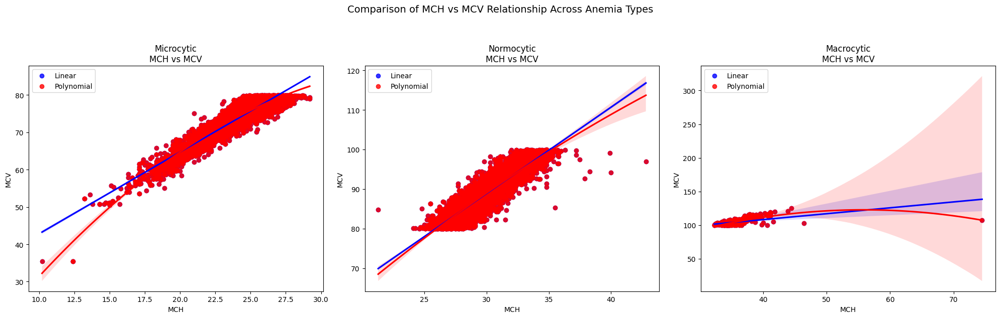

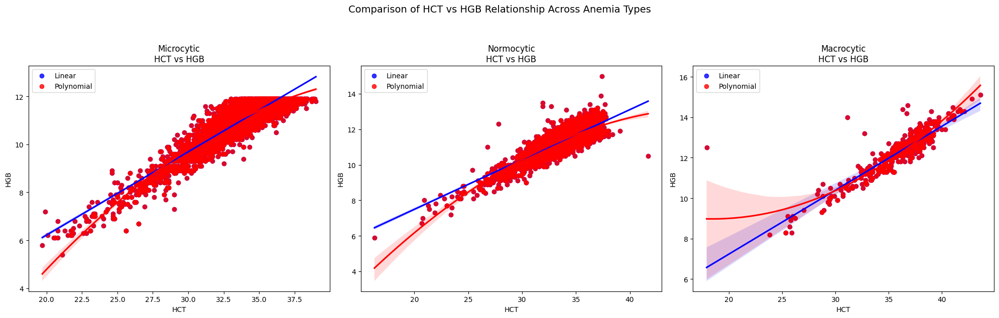

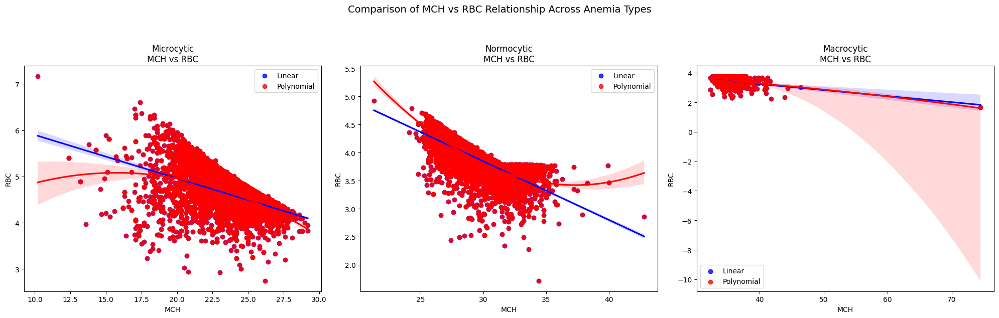

In [28]:
compare_scatter_plots('MCH', 'MCV')  # Strongest and distinctive relationship for each type
compare_scatter_plots('HCT', 'HGB')  # Strong and stable relationship across all types
compare_scatter_plots('MCH', 'RBC')  # Shows clear negative differences

2. **Second Group (Distinguishing Type Characteristics):**

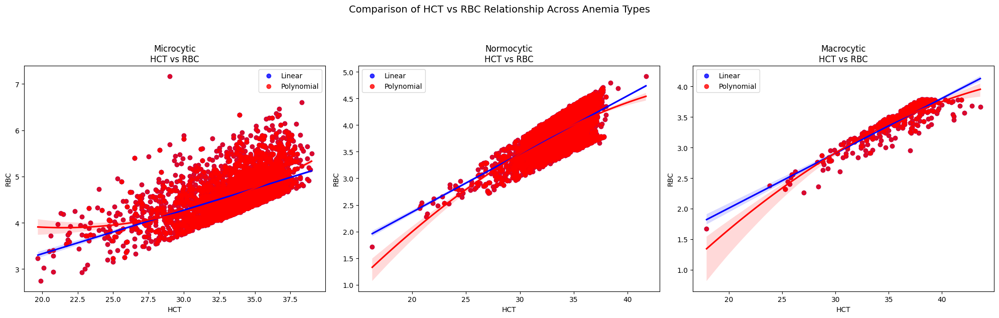

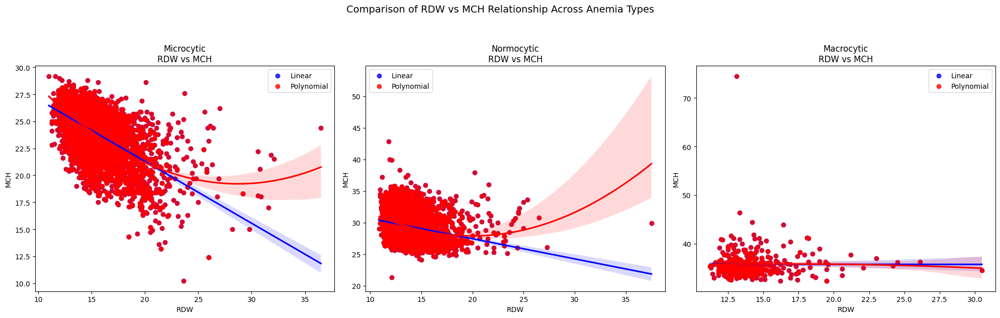

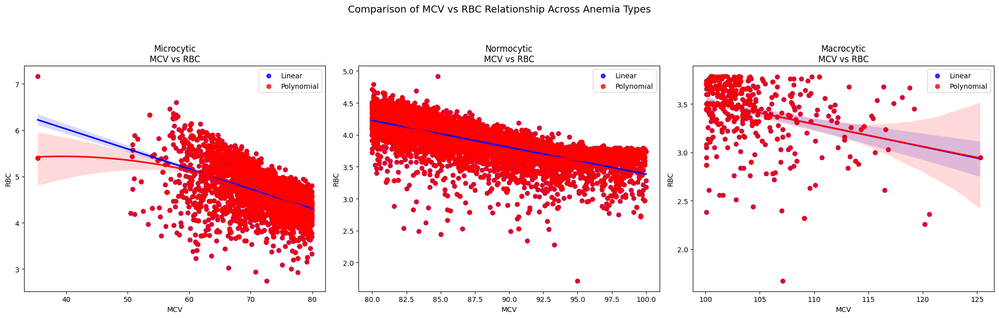

In [30]:
compare_scatter_plots('HCT', 'RBC')  # Strong in macrocytic
compare_scatter_plots('RDW', 'MCH')  # Distinctive for microcytic with negative correlation
compare_scatter_plots('MCV', 'RBC')  # Distinctive for normocytic with negative correlation

3. **Third Group (Unique Relationships):**

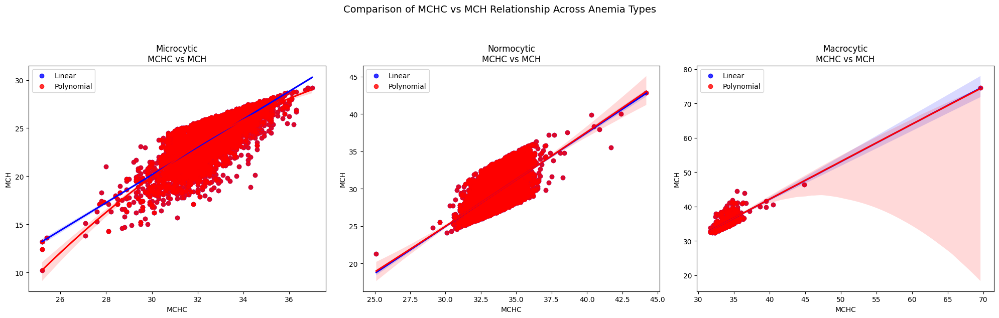

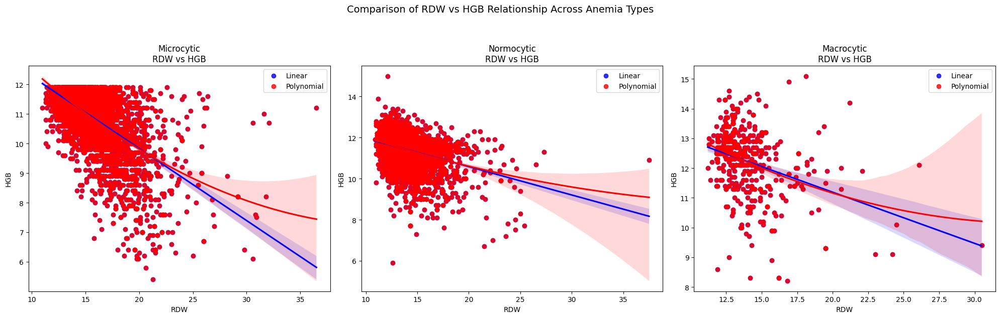

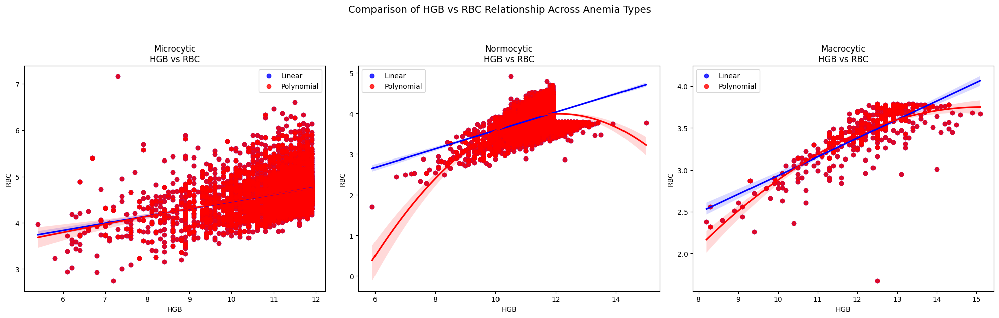

In [32]:
compare_scatter_plots('MCHC', 'MCH')  # Relationship strength varies between types
compare_scatter_plots('RDW', 'HGB')   # Distinctive for microcytic
compare_scatter_plots('HGB', 'RBC')   # Unique in macrocytic

## 3.2.6 Searching for a starting point

### MCH vs MCV:
- Shows a strong linear pattern in microcytic and normocytic.
- Exhibits a different pattern in macrocytic. [where the upper limits for MCH or MCV]

### HCT vs HGB:
- Stable relationship that helps validate data quality.
- Reveals subtle differences between types.

### MCH vs RBC:
- Shows distinctive negative relationships.
- Particularly helpful in identifying normocytic anemia.

---

This combination will allow us to:
- View the main patterns for each type.
- Compare positive and negative relationships.
- Understand how relationship strengths vary between types.

### Key Benefits:
- Comprehensive coverage of different relationship types.
- Clear visualization of distinguishing patterns.
- Includes both strong positive and negative correlations.
- Helps in understanding the unique characteristics of each anemia type.



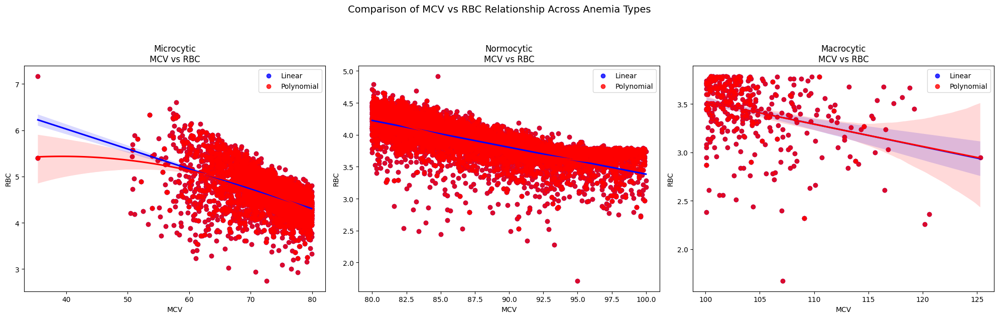

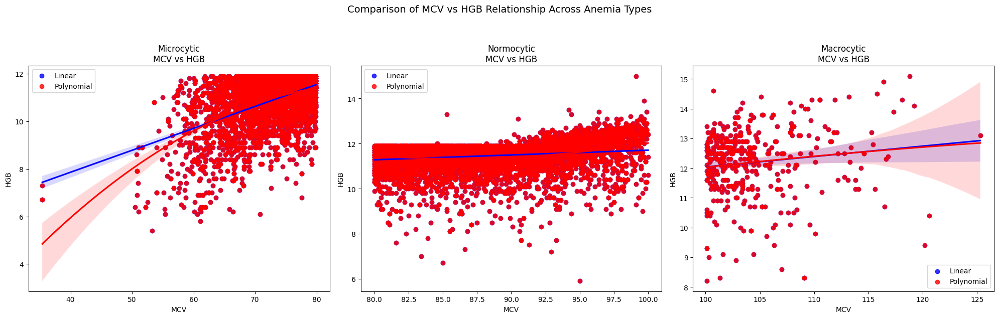

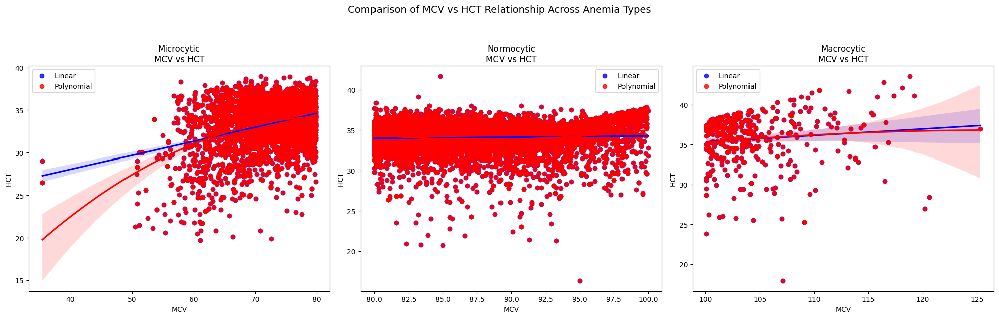

In [34]:
compare_scatter_plots('MCV', 'RBC')
compare_scatter_plots('MCV', 'HGB')
compare_scatter_plots('MCV', 'HCT')

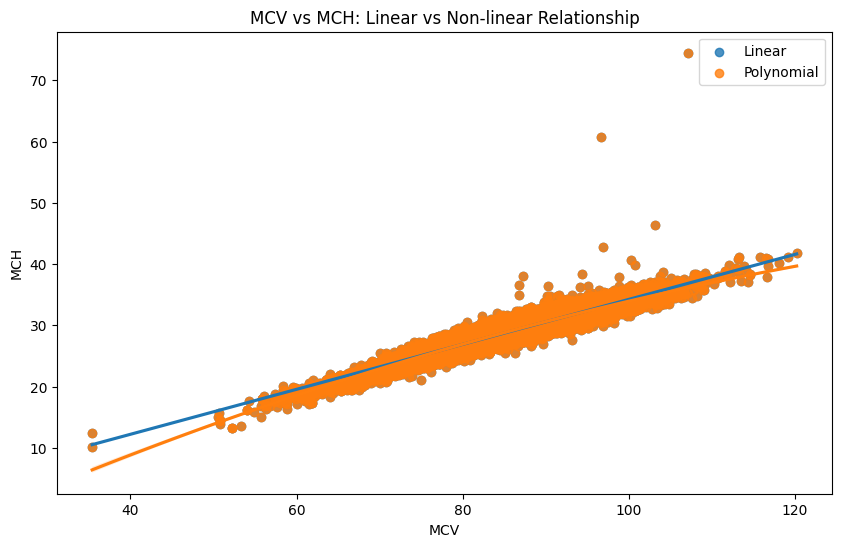

In [35]:
scatter_plot('MCV','MCH' , df_rbc.sample(frac=0.5))

### 3.2.7 Summary of Findings and Decision on Feature Selection:

- **HGB, RBC, HCT, MCV, MCH** all exhibit strong and reliable relationships that can be trusted for analysis.
  
- Despite the strong correlation between **MCV** and **MCH**, I have decided to exclude **MCH** for the following reasons:
  1. **MCH** does not provide distinct information and essentially follows the same pattern as **MCV**, making it redundant.
  2. **MCH** is not accurate in laboratory measurements, and its narrow normal range (27–34) is too small to be relied upon for meaningful analysis.

- **MCV** is the optimal choice, supported by **RDW**, as it provides a broader and more reliable diagnostic value.

### <span style="color:#ff9900;">Findings from Analysis</span>
<span style="color:#ff9900;">
From my analysis, I found that **RBC**, **HGB**, and **HCT** follow a similar pattern to **MCV** in the previous plots. This suggests that they exhibit a clear and consistent pattern with other types, even if the relationship is not strictly linear. This is not an issue for our current analysis.

- To enhance the accuracy of anemia diagnosis, instead of relying solely on **HGB**, we will incorporate **HCT** and **RBC** values. This approach ensures a more comprehensive and accurate diagnosis.
</span>


## <span style="color:#326bfa;">Therefore, I will proceed with these findings and continue building the analysis from here.</span>


## 3.3  RBC Pattern Recognition


I used the normal values for females for two main reasons:

1. **Lack of Gender Information**: We do not have any information about gender in the dataset.
2. **Natural Blood Count Range for Females**: The normal range for females is considered the lower bound for human values in general.

Additionally, after further research, I discovered that the boundaries of the normal values for males and females do not significantly affect the results. The patterns in the data showed a flexible efficiency, regardless of these boundaries, ensuring robust performance across different categories.






## 3.3.1 Categorized Patterns

### 1. **Wrong Patterns** (Abnormal or Inaccurate)




| Pattern Name          | Description                    |
|-----------------------|--------------------------------|
| Low_Low_High          | Low HGB, Low RBC, High HCT     |
| Low_Normal_High       | Low HGB, Normal RBC, High HCT  |
| Low_High_High         | Low HGB, High RBC, High HCT    |
| Normal_Low_High       | Normal HGB, Low RBC, High HCT  |
| Normal_High_Low       | Normal HGB, High RBC, Low HCT  |
| High_Low_Low          | High HGB, Low RBC, Low HCT     |
| High_Low_High         | High HGB, Low RBC, High HCT    |
| High_Low_Normal       | High HGB, Low RBC, Normal HCT  |
| High_Normal_Low       | High HGB, Normal RBC, Low HCT  |
| High_High_Low         | High HGB, High RBC, Low HCT    |


### 2. **High Pattern**


| Pattern Name         | Description                   |
|----------------------|-------------------------------|
| High_High_High       | High HGB, High RBC, High HCT  |
| High_High_Normal     | High HGB, High RBC, Normal HCT|


### 3. **Normal Patterns** (Normal or Near-Normal Conditions)


| Pattern Name         | Description                   |
|----------------------|-------------------------------|
| Normal_Normal_Normal | Normal HGB, Normal RBC, Normal HCT |
| Normal_Normal_Low    | Normal HGB, Normal RBC, Low HCT    |
| Normal_Normal_High   | Normal HGB, Normal RBC, High HCT   |
| Normal_High_Normal   | Normal HGB, High RBC, Normal HCT  |
| Normal_High_High     | Normal HGB, High RBC, High HCT    |
| High_Normal_High     | High HGB, Normal RBC, High HCT    |
| High_Normal_Normal   | High HGB, Normal RBC, Normal HCT  |

### 4. **Early Microcytic Patterns** (Early Signs of Microcytic Anemia)


| Pattern Name         | Description                   |
|----------------------|-------------------------------|
| Low_High_Low         | Low HGB, High RBC, Low HCT     |
| Low_High_Normal      | Low HGB, High RBC, Normal HCT  |

### 5. **Early Macrocytic Patterns** (Early Signs of Macrocytic Anemia)


| Pattern Name         | Description                   |
|----------------------|-------------------------------|
| Normal_Low_Normal    | Normal HGB, Low RBC, Normal HCT |
| Normal_Low_Low       | Normal HGB, Low RBC, Low HCT    |

### 6. **Moderate Anemia Patterns** (Moderate Anemia)


| Pattern Name         | Description                   |
|----------------------|-------------------------------|
| Low_Normal_Normal    | Low HGB, Normal RBC, Normal HCT |
| Low_Normal_Low       | Low HGB, Normal RBC, Low HCT    |

### 7. **Anemia Patterns** (Severe Anemia)


| Pattern Name         | Description                   |
|----------------------|-------------------------------|
| Low_Low_Low          | Low HGB, Low RBC, Low HCT     |
| Low_Low_Normal       | Low HGB, Low RBC, Normal HCT  |



Explanation:
1. Wrong Patterns: These patterns indicate abnormal or inaccurate measurements.
2. High Pattern: Represents the health condition with high values.
3. Normal Patterns: Indicate normal or near-normal conditions for all three parameters.
4. Early Microcytic Patterns: These patterns show early signs of microcytic anemia.
5. Early Macrocytic Patterns: These patterns show early signs of macrocytic anemia.
6. Moderate Anemia Patterns: Represent moderate anemia.
7. Anemia Patterns: Represent clearly anemia.

## <span style="color:#ff9900;">These patterns were divided based on studying each pattern separately and collecting similarities with each other.</span>



In [39]:
# Define the normal ranges for HGB, RBC, and HCT
#female:
normal_hgb_range = (12, 17.5)   
normal_rbc_range = (3.8, 5)     
normal_hct_range = (34, 44)     
# #male :
# normal_hgb_range = (13.5, 17.5)    # Hemoglobin (g/dL)
# normal_rbc_range = (4.5, 6.1)      # Red Blood Cell count (million cells/µL)
# normal_hct_range = (40, 52)        # Hematocrit (%)

# #child :
# normal_hgb_range = (11, 16.5)       # Hemoglobin (g/dL)
# normal_rbc_range = (4.1, 6)     # Red Blood Cell count (million cells/µL)
# normal_hct_range = (34, 50)       # Hematocrit (%)
# #pregenant
# normal_hgb_range_pregnant = (11, 15)      # Hemoglobin (g/dL)
# normal_rbc_range_pregnant = (3.8, 5.1)    # Red Blood Cell count (million cells/µL)
# normal_hct_range_pregnant = (33, 39)      # Hematocrit (%)

# Function to determine the status (Low, Normal, High) based on value and normal range
def get_status(value, normal_range):
    if value < normal_range[0]:
        return 'Low'
    elif value > normal_range[1]:
        return 'High'
    else:
        return 'Normal'

# Apply the status function to each row in the dataframe based on the values
df_rbc['HGB_Status'] = df_rbc['HGB'].apply(get_status, normal_range=normal_hgb_range)
df_rbc['RBC_Status'] = df_rbc['RBC'].apply(get_status, normal_range=normal_rbc_range)
df_rbc['HCT_Status'] = df_rbc['HCT'].apply(get_status, normal_range=normal_hct_range)
df_rbc['MentzerIndex']=df_rbc['MCV']/df_rbc['RBC']



/tmp/ipykernel_229411/2270901633.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rbc['HGB_Status'] = df_rbc['HGB'].apply(get_status, normal_range=normal_hgb_range)
/tmp/ipykernel_229411/2270901633.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rbc['RBC_Status'] = df_rbc['RBC'].apply(get_status, normal_range=normal_rbc_range)
/tmp/ipykernel_229411/2270901633.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_index

In [40]:
# Function to classify data based on a pattern
def classify_mcv_status(pattern):
    # Split the pattern into HGB, RBC, and HCT statuses
    hgb_status, rbc_status, hct_status = pattern.split('_')
    
    # Filter the data based on the specified HGB, RBC, and HCT statuses
    filtered_df = df_rbc[
        (df_rbc['HGB_Status'] == hgb_status) &
        (df_rbc['RBC_Status'] == rbc_status) &
        (df_rbc['HCT_Status'] == hct_status)
    ].copy()  # Using copy to avoid warnings
    
    # Check if there is data for the specified pattern
    if filtered_df.empty:
        print(f"No data available for pattern: {pattern}")

    # Classify the data based on MCV (Microcytic, Normocytic, Macrocytic)
    filtered_df['MCV_Category'] = pd.cut(filtered_df['MCV'], bins=[0, 80, 100, 120], 
                                         labels=['Microcytic (<80)', 'Normocytic (80-100)', 'Macrocytic (>100)'])
    
    # Extract DataFrame for each category
    macrocytic_df = filtered_df[filtered_df['MCV_Category'] == 'Macrocytic (>100)']
    normocytic_df = filtered_df[filtered_df['MCV_Category'] == 'Normocytic (80-100)']
    microcytic_df = filtered_df[filtered_df['MCV_Category'] == 'Microcytic (<80)']
    
    return macrocytic_df, normocytic_df, microcytic_df


def plot_group_distributions(pattern_list, group_name):
    """
    Plot distributions for a group of patterns
    """
    all_data = []
    
    # Collect data for all patterns
    for pattern in pattern_list:
        macro_df, normo_df, micro_df = classify_mcv_status(pattern)
        pattern_data = pd.concat([df for df in [macro_df, normo_df, micro_df] if df is not None])
        if not pattern_data.empty:
            pattern_data['Pattern'] = pattern
            all_data.append(pattern_data)
    
    if not all_data:
        print(f"No data for group: {group_name}")
        return
        
    combined_df = pd.concat(all_data)
    
    # Plot distributions
    features = ['RBC', 'HGB', 'MCV', 'RDW']
    plt.figure(figsize=(16, 4))
    plt.suptitle(f'Distributions for {group_name}', y=1.1, fontsize=14)
    
    for i, feature in enumerate(features, 1):
        plt.subplot(1, 4, i)
        sns.boxplot(data=combined_df, x='Pattern', y=feature)
        plt.xticks(rotation=90)
        plt.title(feature)
    
    plt.tight_layout()
    plt.show()

def plot_group_relationships(pattern_list, group_name):
    """
    Plot feature relationships for a group of patterns
    """
    all_data = []
    
    # Collect data for all patterns
    for pattern in pattern_list:
        macro_df, normo_df, micro_df = classify_mcv_status(pattern)
        pattern_data = pd.concat([df for df in [macro_df, normo_df, micro_df] if df is not None])
        if not pattern_data.empty:
            pattern_data['Pattern'] = pattern
            all_data.append(pattern_data)
    
    if not all_data:
        print(f"No data for group: {group_name}")
        return
        
    combined_df = pd.concat(all_data)
    features = ['RBC', 'HGB', 'MCV', 'RDW']
    
    # Create relationship plots
    plt.figure(figsize=(15, 5))
    plt.suptitle(f'Feature Relationships for {group_name}', y=1.1)
    
    # RBC vs HGB
    plt.subplot(1, 3, 1)
    sns.scatterplot(data=combined_df, x='RBC', y='HGB', hue='Pattern')
    plt.title('RBC vs HGB')
    
    # RBC vs MCV
    plt.subplot(1, 3, 2)
    sns.scatterplot(data=combined_df, x='RBC', y='MCV', hue='Pattern')
    plt.title('RBC vs MCV')
    
    # HGB vs MCV
    plt.subplot(1, 3, 3)
    sns.scatterplot(data=combined_df, x='HGB', y='MCV', hue='Pattern')
    plt.title('HGB vs MCV')
    
    plt.tight_layout()
    plt.show()



def plot_distribution_by_patterns(patterns_list, original_df):

    pattern_colors = {}
    for i, pattern in enumerate(patterns_list):
        pattern_colors[pattern] = plt.cm.rainbow(i/len(patterns_list))
    
    anemia_colors = {
        "Macrocytic": "#e74c3c",   
        "Normocytic": "#2ecc71",    
        "Microcytic": "#3498db"     
    }

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('Distribution by Patterns', fontsize=16, y=1.02)
    
    metrics = ['HGB', 'RBC', 'RDW', 'MCV']
    positions = [(0,0), (0,1), (1,0), (1,1)]
    
    pattern_data = {}
    for pattern in patterns_list:
        macro, normo, micro = classify_mcv_status(pattern)
        pattern_data[pattern] = {
            'Macrocytic': macro,
            'Normocytic': normo,
            'Microcytic': micro
        }
    
    for metric, pos in zip(metrics, positions):
        ax = axes[pos]
        
        for pattern in patterns_list:
            all_data = []
            for anemia_type in ['Macrocytic', 'Normocytic', 'Microcytic']:
                if not pattern_data[pattern][anemia_type].empty:
                    all_data.append(pattern_data[pattern][anemia_type][metric])
            
            if all_data:
                combined_data = pd.concat(all_data)
                sns.kdeplot(data=combined_data,
                           label=pattern,
                           color=pattern_colors[pattern],
                           ax=ax)
        
        ax.set_title(f'{metric} Distribution')
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    
    plt.tight_layout(rect=[0, 0, 1.2, 0.96])
    
# Create the second graph of the distributions of anemia types.
    fig2, axes2 = plt.subplots(2, 2, figsize=(16, 12))
    fig2.suptitle('Distribution by Anemia Types', fontsize=16, y=1.02)
    
    for metric, pos in zip(metrics, positions):
        ax = axes2[pos]
        
        # Data collection for each type of anemia
        anemia_type_data = {
            'Macrocytic': [],
            'Normocytic': [],
            'Microcytic': []
        }
        
        # Collect data from all types
        for pattern in patterns_list:
            for anemia_type in ['Macrocytic', 'Normocytic', 'Microcytic']:
                if not pattern_data[pattern][anemia_type].empty:
                    anemia_type_data[anemia_type].append(
                        pattern_data[pattern][anemia_type][metric]
                    )
        
        # Graphing the distributions for each type of anemia
        for anemia_type in ['Macrocytic', 'Normocytic', 'Microcytic']:
            if anemia_type_data[anemia_type]:
                combined_data = pd.concat(anemia_type_data[anemia_type])
                sns.kdeplot(data=combined_data,
                           label=anemia_type,
                           color=anemia_colors[anemia_type],
                           ax=ax)
        
        ax.set_title(f'{metric} Distribution by Anemia Type')
        ax.legend()
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


# Function to plot distribution for HGB, RBC, RDW, MCV with different colors for each category
def plot_distribution_by_category(pattern):
    # Classify data by pattern
    macrocytic_df, normocytic_df, microcytic_df = classify_mcv_status(pattern)

    # Create a figure with 4 subplots for HGB, RBC, RDW, MCV
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    fig.suptitle(f'Distribution of HGB, RBC, RDW, MCV for Pattern: {pattern}', fontsize=16)

    # Plot HGB distribution
    sns.histplot(macrocytic_df['HGB'], color='purple', label='Macrocytic', kde=True, ax=axes[0, 0])
    sns.histplot(normocytic_df['HGB'], color='green', label='Normocytic', kde=True, ax=axes[0, 0])
    sns.histplot(microcytic_df['HGB'], color='orange', label='Microcytic', kde=True, ax=axes[0, 0])
    axes[0, 0].set_title('HGB Distribution')
    axes[0, 0].legend()
    # Plot RBC distribution
    sns.histplot(macrocytic_df['RBC'], color='purple', label='Macrocytic', kde=True, ax=axes[0, 1])
    sns.histplot(normocytic_df['RBC'], color='green', label='Normocytic', kde=True, ax=axes[0, 1])
    sns.histplot(microcytic_df['RBC'], color='orange', label='Microcytic', kde=True, ax=axes[0, 1])
    axes[0, 1].set_title('RBC Distribution')
    axes[0, 1].legend()
    # Plot RDW distribution
    sns.histplot(macrocytic_df['RDW'], color='purple', label='Macrocytic', kde=True, ax=axes[1, 0])
    sns.histplot(normocytic_df['RDW'], color='green', label='Normocytic', kde=True, ax=axes[1, 0])
    sns.histplot(microcytic_df['RDW'], color='orange', label='Microcytic', kde=True, ax=axes[1, 0])
    axes[1, 0].set_title('RDW Distribution')
    axes[1, 0].legend()
    # Plot MCV distribution
    sns.histplot(macrocytic_df['MCV'], color='purple', label='Macrocytic', kde=True, ax=axes[1, 1])
    sns.histplot(normocytic_df['MCV'], color='green', label='Normocytic', kde=True, ax=axes[1, 1])
    sns.histplot(microcytic_df['MCV'], color='orange', label='Microcytic', kde=True, ax=axes[1, 1])
    axes[1, 1].set_title('MCV Distribution')
    axes[1, 1].legend()
    # Adjust layout
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()
    
# Histogram and KDE plot for Mentzer Index distribution
def plot_mentzer_distribution(df):
    plt.figure(figsize=(10, 6))
    sns.histplot(df['MentzerIndex'], kde=True, color='skyblue', bins=30)

    # Adding labels and title
    plt.title('Distribution of Mentzer Index')
    plt.xlabel('Mentzer Index')
    plt.ylabel('Frequency')
    plt.show()

In [41]:
wrong_patterns = [
            "Low_Low_High", "Low_Normal_High", "Low_High_High",
            "Normal_Low_High", "Normal_High_Low", "High_Low_Low",
            "High_Low_High", "High_Low_Normal", "High_Normal_Low",
            "High_High_Low"
        ]
for pattern in wrong_patterns :
    print(f"\nPattern: {pattern}")
    macrocytic_df, normocytic_df, microcytic_df =classify_mcv_status(pattern)
    
    
    if not macrocytic_df.empty:
        print("DataFrame for Macrocytic (>100):")
        macrocytic_df
        macrocytic_df.describe()
    
    if not normocytic_df.empty:
        
        print("\nDataFrame for Normocytic (80-100):")
        normocytic_df
        normocytic_df.describe()
    
    if not microcytic_df.empty:
        print("\nDataFrame for Microcytic (<80):")
        microcytic_df
        microcytic_df.describe()



Pattern: Low_Low_High
No data available for pattern: Low_Low_High

Pattern: Low_Normal_High
No data available for pattern: Low_Normal_High

Pattern: Low_High_High
No data available for pattern: Low_High_High

Pattern: Normal_Low_High
No data available for pattern: Normal_Low_High

Pattern: Normal_High_Low
No data available for pattern: Normal_High_Low

Pattern: High_Low_Low
No data available for pattern: High_Low_Low

Pattern: High_Low_High
No data available for pattern: High_Low_High

Pattern: High_Low_Normal
No data available for pattern: High_Low_Normal

Pattern: High_Normal_Low
No data available for pattern: High_Normal_Low

Pattern: High_High_Low
No data available for pattern: High_High_Low


### Mentzer Index

The **Mentzer Index** is a calculation used to differentiate between two common causes of microcytic anemia: **iron deficiency anemia (IDA)** and **thalassemia trait**. It is calculated using the formula:

### Mentzer Index = MCV / RBC


Where:
- **MCV** is the Mean Corpuscular Volume (in femtoliters, fL).
- **RBC** is the Red Blood Cell count (in millions per microliter).

### Significance of the Mentzer Index
- **Mentzer Index < 13**: Suggests **thalassemia trait**, as the red blood cell count is typically higher relative to the low MCV.
- **Mentzer Index > 13**: Suggests **iron deficiency anemia**, as the red blood cell count is lower relative to the low MCV.

This index is particularly valuable because it provides a simple, quick, and non-invasive method to guide further diagnostic evaluation, reducing the need for more invasive and costly tests in initial screenings.



Pattern: Normal_Normal_Normal
DataFrame for Macrocytic (>100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
330,3.82,13.4,38.8,101.6,35.2,34.5,16.5,249.0,Normal,Normal,Normal,26.596859,Macrocytic (>100)
537,4.03,13.9,41.0,101.9,34.5,33.9,12.6,243.0,Normal,Normal,Normal,25.285360,Macrocytic (>100)
595,4.10,14.3,42.5,103.6,34.7,33.5,13.5,263.0,Normal,Normal,Normal,25.268293,Macrocytic (>100)
628,4.07,14.1,41.6,102.1,34.9,34.2,13.7,155.0,Normal,Normal,Normal,25.085995,Macrocytic (>100)
884,4.15,14.4,41.6,100.2,34.5,34.5,12.3,243.0,Normal,Normal,Normal,24.144578,Macrocytic (>100)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
114014,4.16,14.8,42.3,101.6,35.5,34.9,13.1,211.0,Normal,Normal,Normal,24.423077,Macrocytic (>100)
114248,3.98,13.8,41.2,103.5,34.8,33.7,14.9,309.0,Normal,Normal,Normal,26.005025,Macrocytic (>100)
114252,4.07,13.7,40.7,100.1,33.7,33.6,13.7,177.0,Normal,Normal,Normal,24.594595,Macrocytic (>100)
114828,4.02,14.2,40.5,100.7,35.4,35.1,13.0,232.0,Normal,Normal,Normal,25.049751,Macrocytic (>100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,486.000000,486.000000,486.000000,486.000000,486.000000,486.000000,486.000000,486.000000,486.000000
mean,4.056811,14.100206,41.365638,101.997531,34.750823,34.079424,13.192387,221.281893,25.184425
std,0.153543,0.610948,1.491858,1.988336,1.094574,0.796091,1.163980,70.670112,1.213959
min,3.800000,12.400000,38.100000,100.100000,32.200000,31.700000,10.900000,22.000000,22.824601
25%,3.922500,13.700000,40.200000,100.600000,34.000000,33.600000,12.400000,173.000000,24.290897
50%,4.050000,14.100000,41.300000,101.400000,34.700000,34.100000,13.000000,218.000000,25.073710
75%,4.180000,14.600000,42.600000,102.700000,35.300000,34.600000,13.800000,258.750000,26.014159
max,4.390000,15.600000,44.000000,113.100000,39.200000,36.700000,19.100000,553.000000,29.421053



DataFrame for Normocytic (80-100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
1,4.73,14.1,41.8,88.5,29.7,33.6,13.7,214.0,Normal,Normal,Normal,18.710359,Normocytic (80-100)
2,4.52,13.7,39.3,86.9,30.3,34.8,11.7,270.0,Normal,Normal,Normal,19.225664,Normocytic (80-100)
5,4.22,13.1,38.7,91.7,30.9,33.7,12.8,453.0,Normal,Normal,Normal,21.729858,Normocytic (80-100)
6,4.60,13.4,40.2,87.4,29.1,33.3,14.3,244.0,Normal,Normal,Normal,19.000000,Normocytic (80-100)
8,4.44,13.5,39.2,88.5,30.3,34.3,12.5,311.0,Normal,Normal,Normal,19.932432,Normocytic (80-100)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
115477,4.78,14.5,42.8,89.6,30.4,33.9,14.7,253.0,Normal,Normal,Normal,18.744770,Normocytic (80-100)
115478,4.67,14.4,41.0,87.8,30.8,35.0,13.1,240.0,Normal,Normal,Normal,18.800857,Normocytic (80-100)
115481,4.34,13.6,39.4,90.7,31.2,34.4,13.8,353.0,Normal,Normal,Normal,20.898618,Normocytic (80-100)
115485,4.94,14.7,43.9,88.7,29.6,33.4,13.4,230.0,Normal,Normal,Normal,17.955466,Normocytic (80-100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,57160.000000,57160.000000,57160.000000,57160.000000,57160.000000,57160.000000,57160.000000,57160.000000,57160.000000
mean,4.496864,13.508940,39.718742,88.447292,30.073154,34.003062,12.965614,270.050593,19.767869
std,0.268755,0.798728,2.272971,4.297658,1.642960,0.847266,0.990341,70.442020,1.875717
min,3.800000,12.000000,34.000000,80.100000,24.900000,29.600000,9.700000,4.000000,16.020000
25%,4.310000,12.900000,38.000000,85.200000,28.900000,33.400000,12.300000,221.000000,18.322148
50%,4.510000,13.500000,39.700000,88.400000,30.000000,34.000000,12.900000,263.000000,19.530917
75%,4.700000,14.100000,41.500000,91.500000,31.200000,34.600000,13.500000,311.000000,20.984683
max,5.000000,17.000000,44.000000,100.000000,46.100000,43.800000,28.400000,999.900000,26.131579



DataFrame for Microcytic (<80):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
16,4.84,12.4,36.1,74.7,25.6,34.2,14.2,434.0,Normal,Normal,Normal,15.433884,Microcytic (<80)
35,4.55,12.2,35.9,79.0,26.7,33.8,12.5,431.0,Normal,Normal,Normal,17.362637,Microcytic (<80)
46,4.81,12.2,36.3,75.5,25.3,33.6,14.4,316.0,Normal,Normal,Normal,15.696466,Microcytic (<80)
118,4.64,12.1,37.0,79.7,26.1,32.7,13.9,423.0,Normal,Normal,Normal,17.176724,Microcytic (<80)
121,4.69,12.6,37.3,79.4,26.9,34.0,13.1,428.0,Normal,Normal,Normal,16.929638,Microcytic (<80)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
115376,4.62,12.3,35.8,77.5,26.5,34.2,13.7,211.0,Normal,Normal,Normal,16.774892,Microcytic (<80)
115389,4.67,13.6,37.3,79.9,29.1,36.4,13.0,352.0,Normal,Normal,Normal,17.109208,Microcytic (<80)
115455,4.99,13.4,39.8,79.9,26.8,33.6,13.8,158.0,Normal,Normal,Normal,16.012024,Microcytic (<80)
115459,4.80,12.6,37.5,78.3,26.2,33.5,13.4,197.0,Normal,Normal,Normal,16.312500,Microcytic (<80)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,3852.000000,3852.000000,3852.000000,3852.000000,3852.000000,3852.000000,3852.000000,3852.000000,3852.000000
mean,4.751924,12.587175,37.081438,78.050753,26.490498,33.940421,13.560929,322.604102,16.449469
std,0.164710,0.428232,1.275556,1.678403,0.932109,0.935960,1.203441,82.503702,0.776335
min,4.280000,12.000000,34.000000,70.000000,23.900000,30.800000,6.300000,46.000000,14.170040
25%,4.640000,12.200000,36.200000,77.200000,25.800000,33.300000,12.700000,265.750000,15.914634
50%,4.770000,12.500000,37.100000,78.500000,26.500000,33.950000,13.400000,314.000000,16.391753
75%,4.890000,12.900000,38.000000,79.400000,27.125000,34.600000,14.100000,367.000000,16.989247
max,5.000000,14.400000,40.400000,80.000000,29.500000,37.000000,23.800000,1021.000000,18.691589


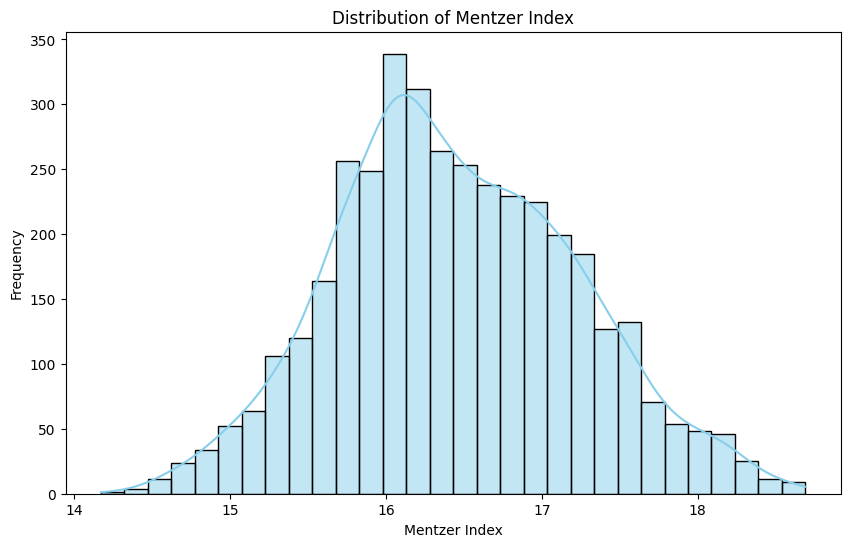

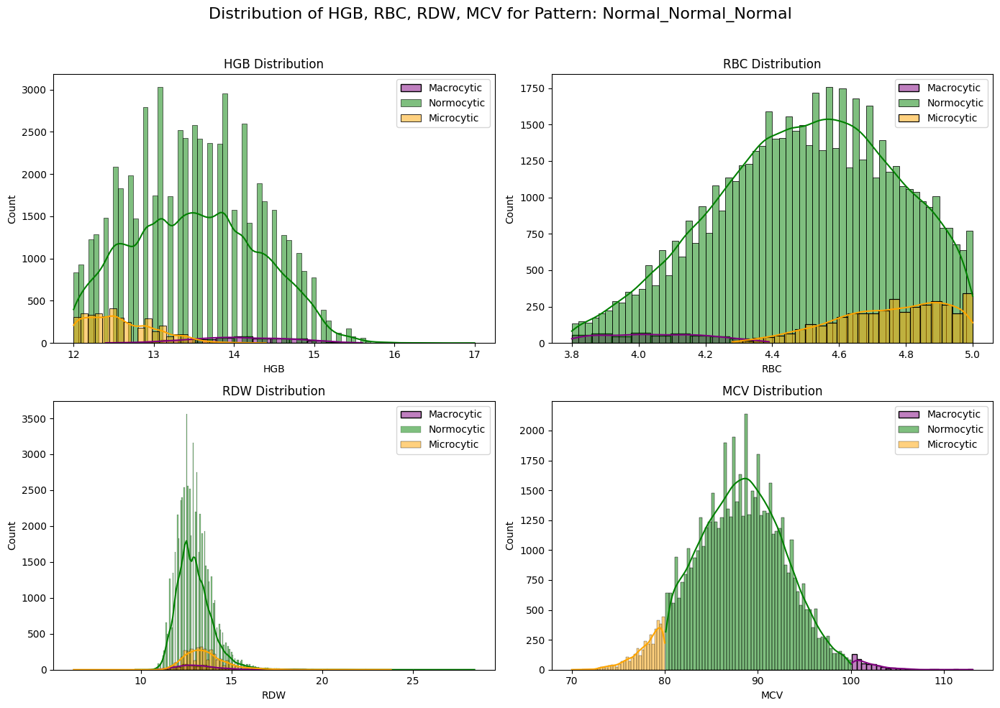


Pattern: Normal_Normal_Low
DataFrame for Macrocytic (>100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
50737,4.0,13.9,33.3,100.4,56.2,43.3,20.1,247.0,Normal,Normal,Low,25.1,Macrocytic (>100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
mean,4.0,13.9,33.3,100.4,56.2,43.3,20.1,247.0,25.1
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,4.0,13.9,33.3,100.4,56.2,43.3,20.1,247.0,25.1
25%,4.0,13.9,33.3,100.4,56.2,43.3,20.1,247.0,25.1
50%,4.0,13.9,33.3,100.4,56.2,43.3,20.1,247.0,25.1
75%,4.0,13.9,33.3,100.4,56.2,43.3,20.1,247.0,25.1
max,4.0,13.9,33.3,100.4,56.2,43.3,20.1,247.0,25.1



DataFrame for Normocytic (80-100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
3259,3.98,12.2,33.7,84.7,30.5,36.0,12.0,268.0,Normal,Normal,Low,21.281407,Normocytic (80-100)
3552,4.07,12.1,33.6,82.4,29.6,36.0,12.0,292.0,Normal,Normal,Low,20.245700,Normocytic (80-100)
6349,4.03,12.1,33.5,83.1,30.0,36.2,12.6,385.0,Normal,Normal,Low,20.620347,Normocytic (80-100)
7259,4.15,12.0,33.9,81.7,28.8,35.3,12.4,285.0,Normal,Normal,Low,19.686747,Normocytic (80-100)
16370,3.91,12.0,33.9,86.9,30.6,35.2,12.2,295.0,Normal,Normal,Low,22.225064,Normocytic (80-100)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
91601,4.14,12.0,33.6,81.3,29.0,35.7,12.3,282.0,Normal,Normal,Low,19.637681,Normocytic (80-100)
94414,4.14,12.0,33.6,81.3,29.0,35.7,12.3,282.0,Normal,Normal,Low,19.637681,Normocytic (80-100)
94911,3.94,12.0,33.8,85.8,30.5,35.6,13.1,271.0,Normal,Normal,Low,21.776650,Normocytic (80-100)
97585,3.92,12.1,33.8,86.0,30.9,35.8,12.9,307.0,Normal,Normal,Low,21.938776,Normocytic (80-100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000
mean,3.994769,12.136923,33.578462,84.143077,30.332308,36.063077,12.596923,293.661538,21.089822
std,0.102624,0.152653,0.316471,2.281787,0.845412,0.581101,0.770343,63.958062,1.080181
min,3.820000,12.000000,32.500000,80.100000,28.600000,35.000000,11.600000,150.000000,19.071429
25%,3.920000,12.000000,33.500000,82.400000,29.800000,35.700000,12.200000,264.000000,20.245700
50%,3.980000,12.100000,33.700000,84.400000,30.400000,36.000000,12.500000,295.000000,21.200000
75%,4.080000,12.200000,33.800000,85.700000,31.000000,36.300000,12.900000,326.000000,21.918159
max,4.200000,12.500000,33.900000,91.800000,32.200000,38.000000,16.500000,588.000000,23.968668



DataFrame for Microcytic (<80):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
2084,4.21,12.0,33.3,79.3,28.4,35.8,13.4,245.0,Normal,Normal,Low,18.836105,Microcytic (<80)
6106,4.24,12.1,33.8,79.9,28.6,35.7,12.2,449.0,Normal,Normal,Low,18.844340,Microcytic (<80)
40314,4.76,12.6,32.3,74.3,30.6,39.2,12.6,211.0,Normal,Normal,Low,15.609244,Microcytic (<80)
42661,4.49,12.0,33.6,74.8,26.8,35.8,13.7,371.0,Normal,Normal,Low,16.659243,Microcytic (<80)
42946,4.18,12.2,33.1,79.3,29.1,36.7,12.4,289.0,Normal,Normal,Low,18.971292,Microcytic (<80)
43731,4.26,12.0,33.1,77.7,28.0,36.1,14.3,289.0,Normal,Normal,Low,18.239437,Microcytic (<80)
45294,4.34,12.1,33.6,77.5,27.9,35.9,12.0,431.0,Normal,Normal,Low,17.857143,Microcytic (<80)
47166,4.48,12.1,33.9,75.7,26.8,35.5,13.1,340.0,Normal,Normal,Low,16.897321,Microcytic (<80)
47564,4.31,12.3,33.7,78.0,28.5,36.5,13.4,332.0,Normal,Normal,Low,18.097448,Microcytic (<80)
50684,4.53,12.4,33.8,74.2,27.3,36.8,14.3,382.0,Normal,Normal,Low,16.379691,Microcytic (<80)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,4.358333,12.162500,33.487500,77.254167,28.095833,36.275000,13.387500,316.958333,17.778343
std,0.182891,0.166322,0.411056,2.985760,1.186328,0.784219,0.910476,81.363638,1.328246
min,4.180000,12.000000,32.300000,67.000000,24.500000,35.500000,12.000000,205.000000,13.673469
25%,4.240000,12.000000,33.200000,76.600000,27.700000,35.800000,12.675000,244.750000,17.362144
50%,4.310000,12.100000,33.650000,77.850000,28.350000,36.150000,13.250000,305.500000,18.143852
75%,4.412500,12.300000,33.800000,79.300000,28.600000,36.525000,14.100000,373.750000,18.824592
max,4.900000,12.600000,33.900000,79.900000,30.600000,39.200000,15.100000,482.000000,18.995215


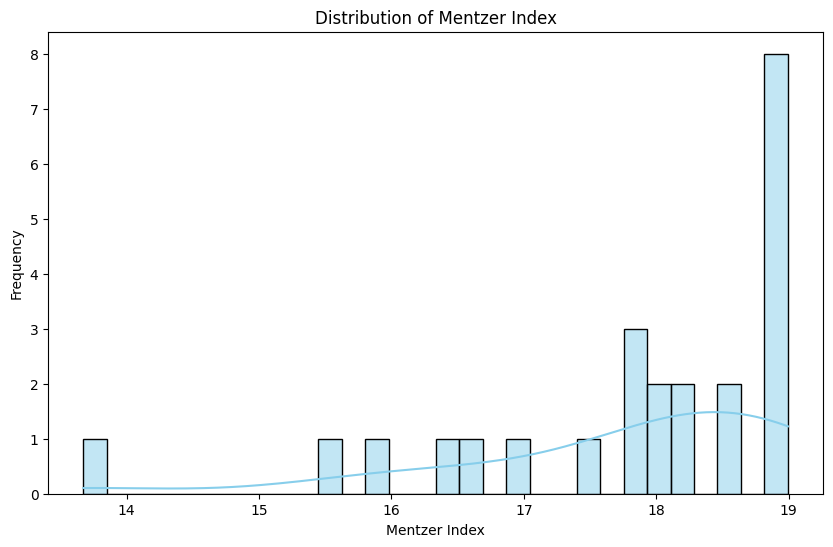

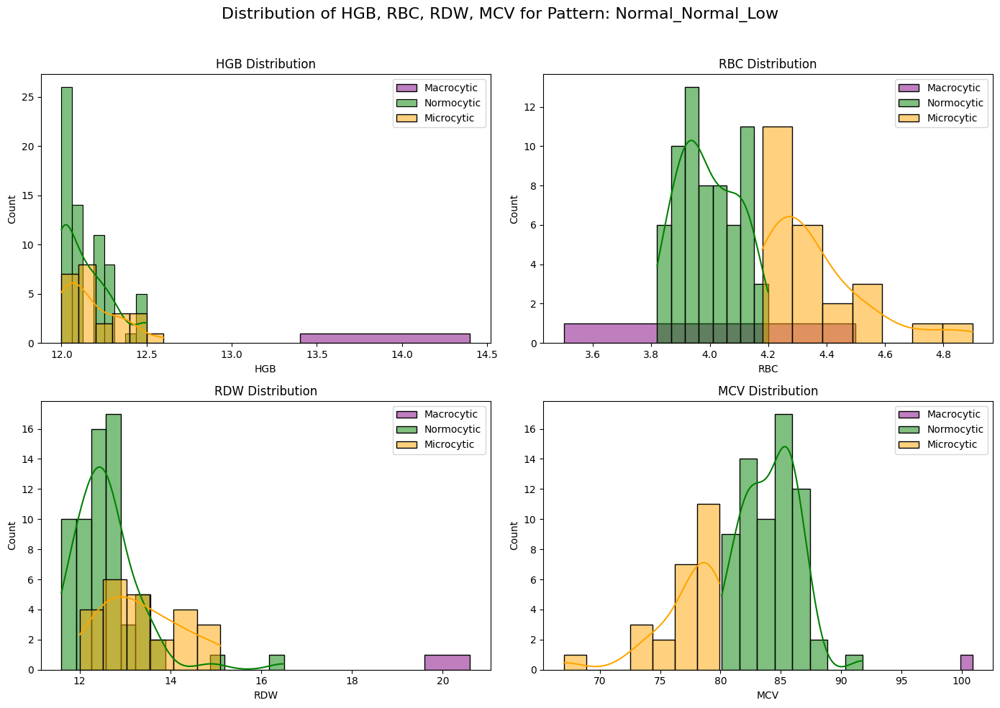


Pattern: Normal_Normal_High
DataFrame for Macrocytic (>100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
252,4.67,16.2,48.4,103.7,34.8,33.5,12.4,226.0,Normal,Normal,High,22.205567,Macrocytic (>100)
694,4.81,16.6,49.5,103.0,34.5,33.5,13.1,231.0,Normal,Normal,High,21.413721,Macrocytic (>100)
872,4.47,15.1,45.5,101.7,34.0,33.3,14.0,313.0,Normal,Normal,High,22.751678,Macrocytic (>100)
1142,4.89,17.0,51.4,105.3,34.8,33.1,12.9,255.0,Normal,Normal,High,21.533742,Macrocytic (>100)
1399,4.38,14.8,44.4,101.3,33.7,33.3,12.3,251.0,Normal,Normal,High,23.127854,Macrocytic (>100)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
114187,4.38,15.0,44.8,102.3,34.2,33.5,18.5,233.0,Normal,Normal,High,23.356164,Macrocytic (>100)
114440,4.70,16.7,48.2,102.6,35.7,34.8,13.9,177.0,Normal,Normal,High,21.829787,Macrocytic (>100)
114629,4.45,15.9,46.0,103.2,35.8,34.7,12.7,171.0,Normal,Normal,High,23.191011,Macrocytic (>100)
114678,4.63,15.5,46.6,100.8,33.5,33.3,14.3,233.0,Normal,Normal,High,21.771058,Macrocytic (>100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000
mean,4.539586,15.780473,46.547041,102.611243,34.783136,33.900296,13.128402,219.307692,22.668940
std,0.208494,0.674044,1.775820,2.856321,1.328699,0.830341,1.168970,67.496478,1.548458
min,3.900000,14.100000,44.100000,100.100000,31.500000,31.400000,11.000000,66.000000,20.222222
25%,4.390000,15.300000,45.100000,100.700000,34.000000,33.400000,12.400000,178.250000,21.616540
50%,4.530000,15.700000,46.100000,101.600000,34.700000,33.800000,13.000000,211.000000,22.414178
75%,4.700000,16.200000,47.800000,103.275000,35.300000,34.400000,13.600000,254.000000,23.233945
max,4.990000,17.500000,51.700000,116.700000,42.000000,39.400000,22.500000,573.000000,29.923077



DataFrame for Normocytic (80-100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
7,4.73,15.1,44.1,93.3,32.1,34.4,12.2,228.0,Normal,Normal,High,19.725159,Normocytic (80-100)
9,5.00,15.4,46.2,92.3,30.9,33.5,13.7,167.0,Normal,Normal,High,18.460000,Normocytic (80-100)
27,4.81,15.8,44.7,93.1,32.8,35.3,13.8,232.0,Normal,Normal,High,19.355509,Normocytic (80-100)
54,4.63,15.4,44.5,96.3,33.2,34.5,12.9,202.0,Normal,Normal,High,20.799136,Normocytic (80-100)
77,4.97,15.4,45.1,90.8,31.0,34.1,11.7,225.0,Normal,Normal,High,18.269618,Normocytic (80-100)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
115436,4.88,14.5,45.3,92.8,29.7,32.0,13.8,210.0,Normal,Normal,High,19.016393,Normocytic (80-100)
115438,4.99,15.7,45.6,91.3,31.4,34.4,12.7,283.0,Normal,Normal,High,18.296593,Normocytic (80-100)
115443,4.88,15.0,44.4,90.9,30.8,33.9,14.3,141.0,Normal,Normal,High,18.627049,Normocytic (80-100)
115450,4.68,14.4,44.2,94.5,30.7,32.5,17.4,236.0,Normal,Normal,High,20.192308,Normocytic (80-100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,6568.000000,6568.000000,6568.000000,6568.000000,6568.000000,6568.000000,6568.000000,6568.000000,6568.000000
mean,4.843182,15.364373,45.305603,93.579857,31.732217,33.913764,12.830710,241.220158,19.344524
std,0.122810,0.489578,1.004839,2.701344,1.157613,0.793064,0.848108,59.978027,0.978653
min,4.410000,13.900000,44.100000,88.100000,26.900000,30.000000,10.700000,54.000000,17.620000
25%,4.770000,15.000000,44.500000,91.500000,30.900000,33.400000,12.200000,200.000000,18.594378
50%,4.870000,15.300000,45.100000,93.400000,31.700000,33.900000,12.700000,236.000000,19.180000
75%,4.940000,15.600000,45.900000,95.600000,32.500000,34.400000,13.300000,276.000000,19.957717
max,5.000000,17.500000,49.400000,100.000000,37.300000,37.800000,18.000000,783.000000,22.624434


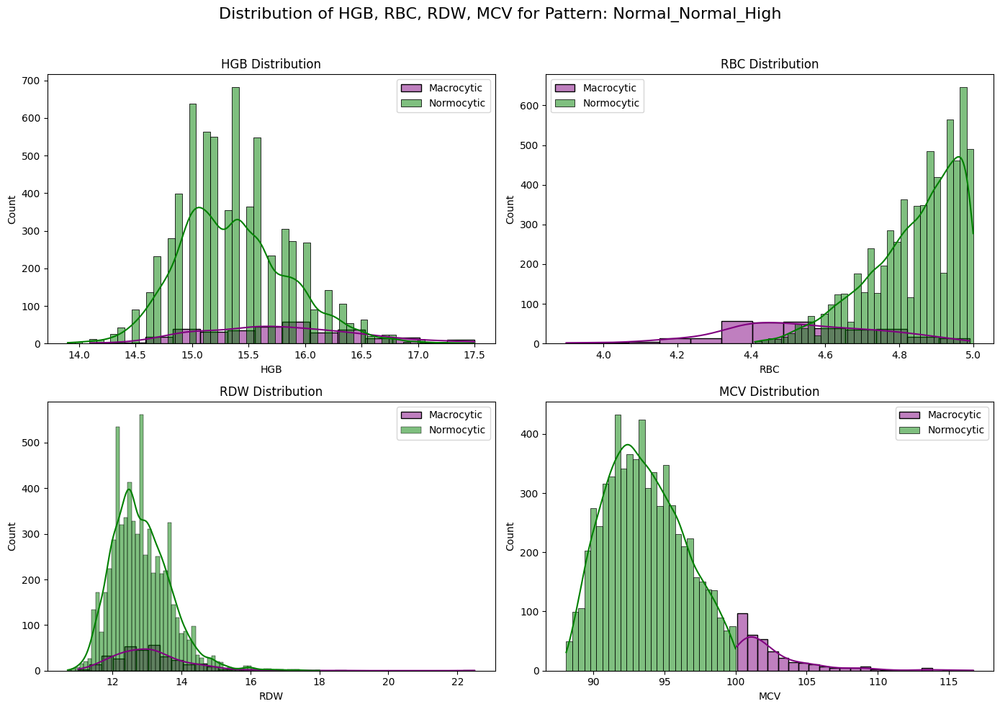


Pattern: Normal_High_Normal

DataFrame for Normocytic (80-100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
4,5.13,14.5,43.6,84.9,28.3,33.3,13.1,209.0,Normal,High,Normal,16.549708,Normocytic (80-100)
21,5.02,13.7,40.7,81.1,27.3,33.7,13.1,306.0,Normal,High,Normal,16.155378,Normocytic (80-100)
61,5.19,14.2,42.4,81.4,27.3,33.5,13.6,304.0,Normal,High,Normal,15.684008,Normocytic (80-100)
176,5.07,14.0,41.3,81.4,27.6,33.9,13.3,260.0,Normal,High,Normal,16.055227,Normocytic (80-100)
213,5.35,14.5,43.7,81.6,27.1,33.2,12.8,352.0,Normal,High,Normal,15.252336,Normocytic (80-100)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
115385,5.09,14.6,42.6,83.8,28.6,34.2,13.8,234.0,Normal,High,Normal,16.463654,Normocytic (80-100)
115397,5.04,14.6,43.0,85.2,29.0,34.1,13.2,298.0,Normal,High,Normal,16.904762,Normocytic (80-100)
115458,5.27,15.0,44.0,83.5,28.4,34.1,13.8,308.0,Normal,High,Normal,15.844402,Normocytic (80-100)
115461,5.02,14.9,43.8,87.2,29.6,34.0,12.8,249.0,Normal,High,Normal,17.370518,Normocytic (80-100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,4237.000000,4237.000000,4237.000000,4237.000000,4237.000000,4237.000000,4237.000000,4237.000000,4237.000000
mean,5.126778,14.426269,42.756644,83.442530,28.144843,33.719802,13.250130,271.109039,16.285421
std,0.099231,0.523193,0.940482,2.011026,1.193742,0.914647,1.041408,68.641649,0.605068
min,5.010000,12.500000,40.100000,80.100000,24.900000,30.500000,11.000000,50.000000,14.670330
25%,5.050000,14.100000,42.100000,81.800000,27.400000,33.100000,12.500000,224.000000,15.854617
50%,5.100000,14.400000,42.900000,83.300000,28.100000,33.700000,13.100000,264.000000,16.299213
75%,5.180000,14.800000,43.500000,85.100000,28.900000,34.300000,13.800000,311.000000,16.751468
max,5.470000,16.700000,44.000000,96.600000,60.800000,39.000000,26.800000,1000.000000,18.941176



DataFrame for Microcytic (<80):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
90,5.65,12.2,38.8,68.4,21.5,31.5,15.1,251.0,Normal,High,Normal,12.106195,Microcytic (<80)
99,5.11,13.4,41.3,79.7,25.8,32.4,13.1,478.0,Normal,High,Normal,15.596869,Microcytic (<80)
303,5.46,14.3,43.0,78.8,26.1,33.2,13.0,285.0,Normal,High,Normal,14.432234,Microcytic (<80)
345,5.01,12.7,39.6,79.1,25.6,32.3,13.1,284.0,Normal,High,Normal,15.788423,Microcytic (<80)
391,5.01,12.9,37.8,75.4,25.7,34.0,12.6,348.0,Normal,High,Normal,15.049900,Microcytic (<80)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
115125,5.15,14.0,41.2,79.9,27.2,34.0,14.5,222.0,Normal,High,Normal,15.514563,Microcytic (<80)
115210,5.64,15.0,43.3,76.7,26.5,34.6,12.9,211.0,Normal,High,Normal,13.599291,Microcytic (<80)
115240,5.29,13.5,40.6,76.7,25.4,33.1,14.4,227.0,Normal,High,Normal,14.499055,Microcytic (<80)
115341,5.24,13.6,40.5,77.3,25.9,33.5,14.5,297.0,Normal,High,Normal,14.751908,Microcytic (<80)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,3020.000000,3020.000000,3020.000000,3020.000000,3020.000000,3020.000000,3020.000000,3020.000000,3020.000000
mean,5.341030,13.269536,40.140397,75.318609,24.905762,33.048940,14.229735,295.633775,14.174457
std,0.319342,0.692719,1.812826,3.977327,1.744672,1.049419,1.628860,84.190294,1.328849
min,5.010000,12.000000,35.000000,56.300000,18.000000,29.200000,11.200000,12.000000,8.423295
25%,5.110000,12.700000,38.900000,73.300000,23.900000,32.300000,13.200000,238.000000,13.623304
50%,5.250000,13.300000,40.100000,76.300000,25.200000,33.000000,13.950000,286.500000,14.533954
75%,5.470000,13.800000,41.400000,78.400000,26.200000,33.800000,15.000000,343.000000,15.096340
max,7.150000,15.600000,44.000000,80.000000,28.800000,36.400000,37.800000,773.000000,15.968064


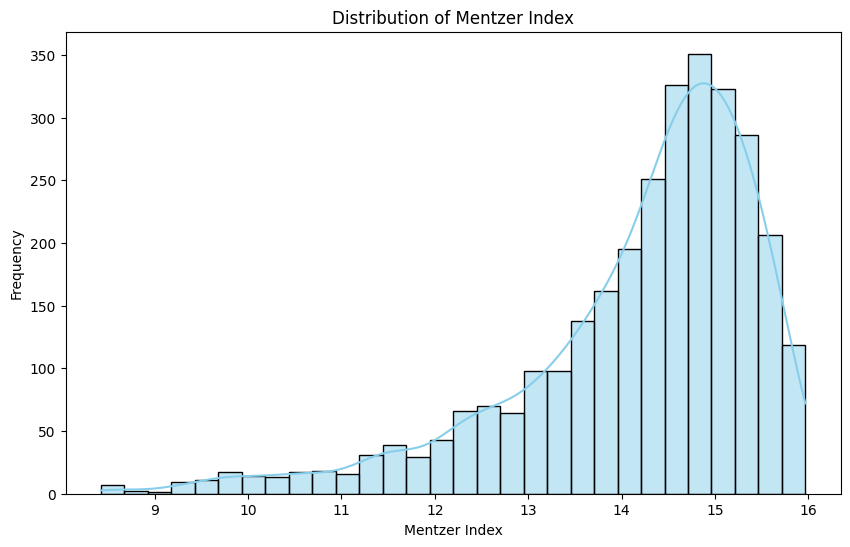

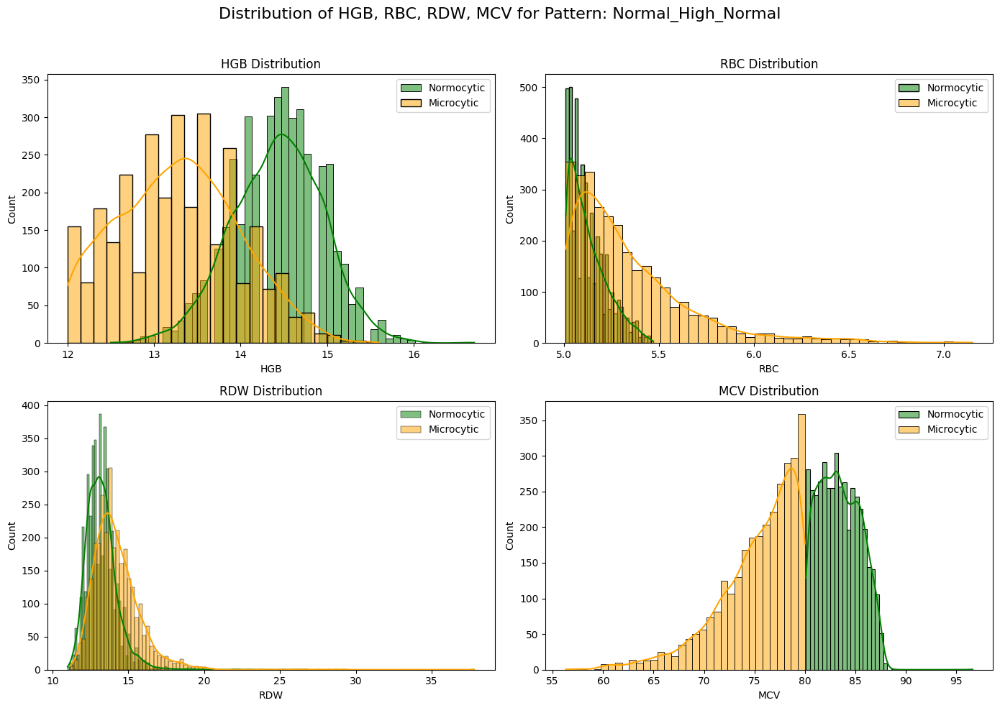


Pattern: Normal_High_High
DataFrame for Macrocytic (>100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
13430,5.07,17.5,50.9,100.3,34.7,34.6,12.4,191.0,Normal,High,High,19.783037,Macrocytic (>100)
13921,5.01,17.5,50.6,101.1,35.0,34.6,12.6,275.0,Normal,High,High,20.179641,Macrocytic (>100)
22918,5.10,17.5,52.0,102.1,34.3,33.6,12.0,184.0,Normal,High,High,20.019608,Macrocytic (>100)
25491,5.03,17.4,53.0,105.6,34.7,32.8,15.9,328.0,Normal,High,High,20.994036,Macrocytic (>100)
27665,5.18,17.5,51.9,100.2,33.8,33.8,11.8,285.0,Normal,High,High,19.343629,Macrocytic (>100)
30438,5.07,17.4,51.6,101.6,34.3,33.8,12.4,215.0,Normal,High,High,20.039448,Macrocytic (>100)
30768,5.10,17.2,52.7,103.2,33.8,32.7,14.1,237.0,Normal,High,High,20.235294,Macrocytic (>100)
34410,5.07,17.2,50.9,100.3,33.8,33.8,11.3,414.0,Normal,High,High,19.783037,Macrocytic (>100)
36741,5.01,17.5,50.9,101.8,34.8,34.2,12.6,178.0,Normal,High,High,20.319361,Macrocytic (>100)
42320,5.15,17.2,53.3,103.3,33.3,32.3,13.6,140.0,Normal,High,High,20.058252,Macrocytic (>100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000
mean,5.079167,17.350000,51.658333,101.725000,34.175000,33.616667,13.041667,234.416667,20.030367
std,0.053506,0.167874,0.933671,1.628231,0.532789,0.714567,1.302765,79.536679,0.408442
min,5.010000,17.000000,50.600000,100.200000,33.300000,32.300000,11.300000,140.000000,19.343629
25%,5.037500,17.200000,50.900000,100.450000,33.800000,33.400000,12.300000,182.500000,19.783037
50%,5.070000,17.400000,51.500000,101.350000,34.050000,33.700000,12.600000,215.500000,20.029528
75%,5.105000,17.500000,52.175000,102.375000,34.700000,33.900000,13.725000,277.500000,20.193554
max,5.180000,17.500000,53.300000,105.600000,35.000000,34.600000,15.900000,414.000000,20.994036



DataFrame for Normocytic (80-100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
10,5.55,16.3,48.3,87.1,29.4,33.7,11.8,259.0,Normal,High,High,15.693694,Normocytic (80-100)
11,5.76,16.0,48.1,83.5,27.8,33.3,13.6,357.0,Normal,High,High,14.496528,Normocytic (80-100)
12,5.53,16.8,50.4,91.1,30.3,33.3,14.4,228.0,Normal,High,High,16.473779,Normocytic (80-100)
13,5.32,16.6,48.1,90.4,31.3,34.5,12.4,160.0,Normal,High,High,16.992481,Normocytic (80-100)
19,5.36,16.4,46.8,87.4,30.6,35.0,12.5,277.0,Normal,High,High,16.305970,Normocytic (80-100)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
115434,5.53,16.2,47.5,85.8,29.2,34.1,14.0,309.0,Normal,High,High,15.515371,Normocytic (80-100)
115451,5.23,16.3,45.2,86.4,31.1,36.0,12.6,219.0,Normal,High,High,16.520076,Normocytic (80-100)
115452,5.69,15.5,46.4,81.6,27.2,33.4,13.6,303.0,Normal,High,High,14.340949,Normocytic (80-100)
115470,5.01,15.6,45.1,90.1,31.2,34.6,12.9,255.0,Normal,High,High,17.984032,Normocytic (80-100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,15799.000000,15799.000000,15799.000000,15799.000000,15799.000000,15799.000000,15799.000000,15799.000000,15799.000000
mean,5.311752,15.856940,46.889702,88.354586,29.881094,33.820368,12.925932,247.997335,16.675137
std,0.220888,0.695188,1.816901,3.384438,1.399996,0.848769,0.900244,60.044128,1.135683
min,5.010000,13.400000,44.100000,80.100000,24.300000,29.900000,10.900000,14.000000,12.465116
25%,5.140000,15.400000,45.400000,86.100000,29.000000,33.300000,12.300000,208.000000,15.911602
50%,5.270000,15.800000,46.700000,88.400000,29.900000,33.800000,12.800000,242.000000,16.764133
75%,5.440000,16.300000,48.100000,90.600000,30.800000,34.300000,13.400000,282.000000,17.523992
max,6.450000,17.500000,54.600000,99.900000,34.700000,37.400000,29.600000,999.900000,19.820359



DataFrame for Microcytic (<80):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
235,6.04,13.9,44.2,73.1,23.1,31.6,13.5,191.0,Normal,High,High,12.102649,Microcytic (<80)
508,6.05,15.4,47.9,79.3,25.5,32.1,12.7,307.0,Normal,High,High,13.107438,Microcytic (<80)
753,5.97,15.4,46.3,77.5,25.8,33.4,12.3,369.0,Normal,High,High,12.981575,Microcytic (<80)
1132,5.89,14.9,46.4,78.8,25.4,32.2,12.4,241.0,Normal,High,High,13.378608,Microcytic (<80)
1173,6.03,15.5,45.1,74.7,25.8,34.3,13.4,254.0,Normal,High,High,12.388060,Microcytic (<80)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
114165,5.58,15.1,44.1,79.1,27.0,34.2,13.5,242.0,Normal,High,High,14.175627,Microcytic (<80)
114803,6.29,14.0,45.0,71.5,22.3,31.2,14.4,198.0,Normal,High,High,11.367250,Microcytic (<80)
114967,5.97,15.0,44.4,74.4,25.1,33.8,15.5,286.0,Normal,High,High,12.462312,Microcytic (<80)
115228,5.60,14.6,44.8,80.0,26.1,32.6,13.6,258.0,Normal,High,High,14.285714,Microcytic (<80)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000
mean,6.067291,15.015737,46.036056,76.102789,24.843825,32.621116,14.345817,249.484064,12.633342
std,0.420618,0.665136,1.687371,3.966138,1.775086,1.039361,1.602397,67.471667,1.355818
min,5.520000,13.400000,44.100000,61.100000,18.500000,29.500000,11.400000,76.000000,7.409639
25%,5.762500,14.500000,44.800000,73.800000,23.700000,31.900000,13.400000,211.000000,11.801969
50%,5.940000,15.000000,45.700000,77.500000,25.300000,32.600000,14.100000,244.500000,13.006757
75%,6.267500,15.400000,46.700000,79.175000,26.100000,33.300000,15.000000,286.000000,13.630459
max,8.300000,17.500000,56.700000,80.000000,28.200000,35.300000,28.800000,949.000000,14.474638


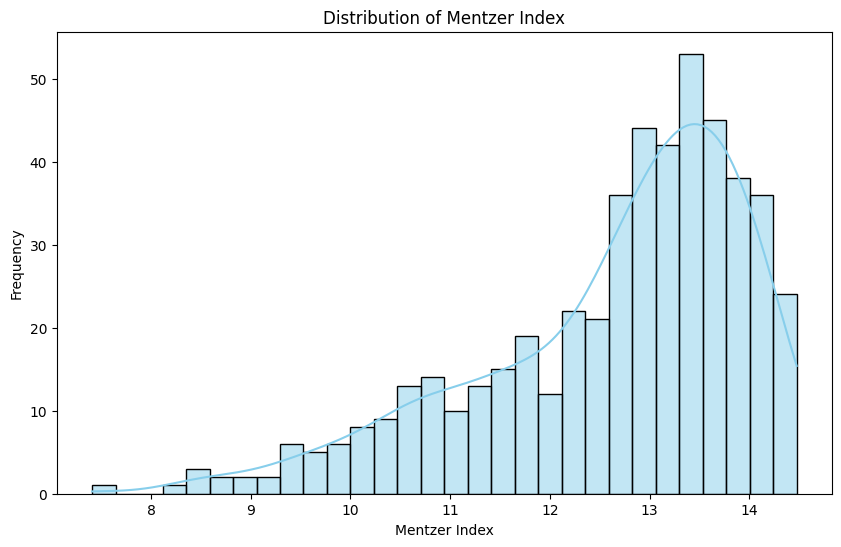

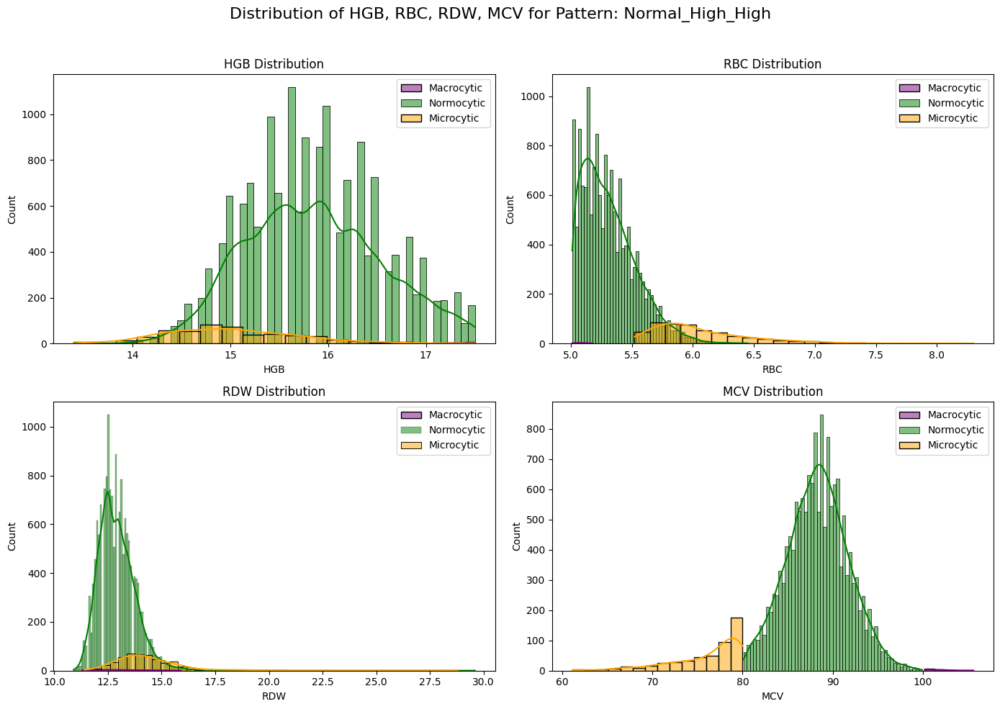


Pattern: High_Normal_High
DataFrame for Macrocytic (>100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
26540,4.88,18.0,51.6,105.6,36.9,34.9,12.6,185.0,High,Normal,High,21.639344,Macrocytic (>100)
39004,4.77,17.6,49.3,103.5,36.9,35.7,11.9,210.0,High,Normal,High,21.698113,Macrocytic (>100)
43261,4.98,18.5,52.8,106.0,37.1,35.1,13.0,223.0,High,Normal,High,21.285141,Macrocytic (>100)
79134,4.98,17.7,51.2,102.9,35.7,34.7,12.7,159.0,High,Normal,High,20.662651,Macrocytic (>100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
mean,4.902500,17.950000,51.225000,104.500000,36.650000,35.100000,12.550000,194.250000,21.321312
std,0.100125,0.404145,1.452297,1.529706,0.640312,0.432049,0.465475,28.300471,0.475488
min,4.770000,17.600000,49.300000,102.900000,35.700000,34.700000,11.900000,159.000000,20.662651
25%,4.852500,17.675000,50.725000,103.350000,36.600000,34.850000,12.425000,178.500000,21.129518
50%,4.930000,17.850000,51.400000,104.550000,36.900000,35.000000,12.650000,197.500000,21.462242
75%,4.980000,18.125000,51.900000,105.700000,36.950000,35.250000,12.775000,213.250000,21.654036
max,4.980000,18.500000,52.800000,106.000000,37.100000,35.700000,13.000000,223.000000,21.698113


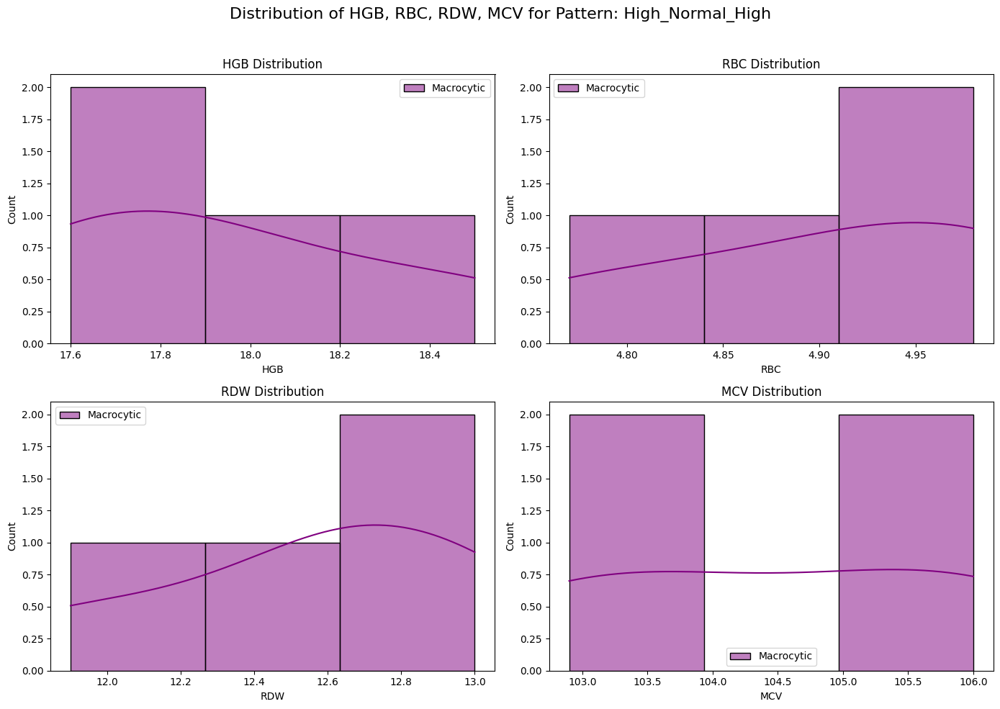


Pattern: High_Normal_Normal

DataFrame for Normocytic (80-100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
16276,4.77,18.5,41.3,86.6,38.9,44.9,11.9,397.0,High,Normal,Normal,18.155136,Normocytic (80-100)
22686,4.89,17.9,42.5,86.8,36.5,42.2,11.3,377.0,High,Normal,Normal,17.750511,Normocytic (80-100)
74499,4.78,18.2,43.5,91.3,37.9,41.6,13.3,601.0,High,Normal,Normal,19.100418,Normocytic (80-100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,3.000000,3.00,3.000000,3.000000,3.000000,3.00000,3.000000,3.000000,3.000000
mean,4.813333,18.20,42.433333,88.233333,37.766667,42.90000,12.166667,458.333333,18.335355
std,0.066583,0.30,1.101514,2.657693,1.205543,1.75784,1.026320,123.956982,0.692764
min,4.770000,17.90,41.300000,86.600000,36.500000,41.60000,11.300000,377.000000,17.750511
25%,4.775000,18.05,41.900000,86.700000,37.200000,41.90000,11.600000,387.000000,17.952824
50%,4.780000,18.20,42.500000,86.800000,37.900000,42.20000,11.900000,397.000000,18.155136
75%,4.835000,18.35,43.000000,89.050000,38.400000,43.55000,12.600000,499.000000,18.627777
max,4.890000,18.50,43.500000,91.300000,38.900000,44.90000,13.300000,601.000000,19.100418


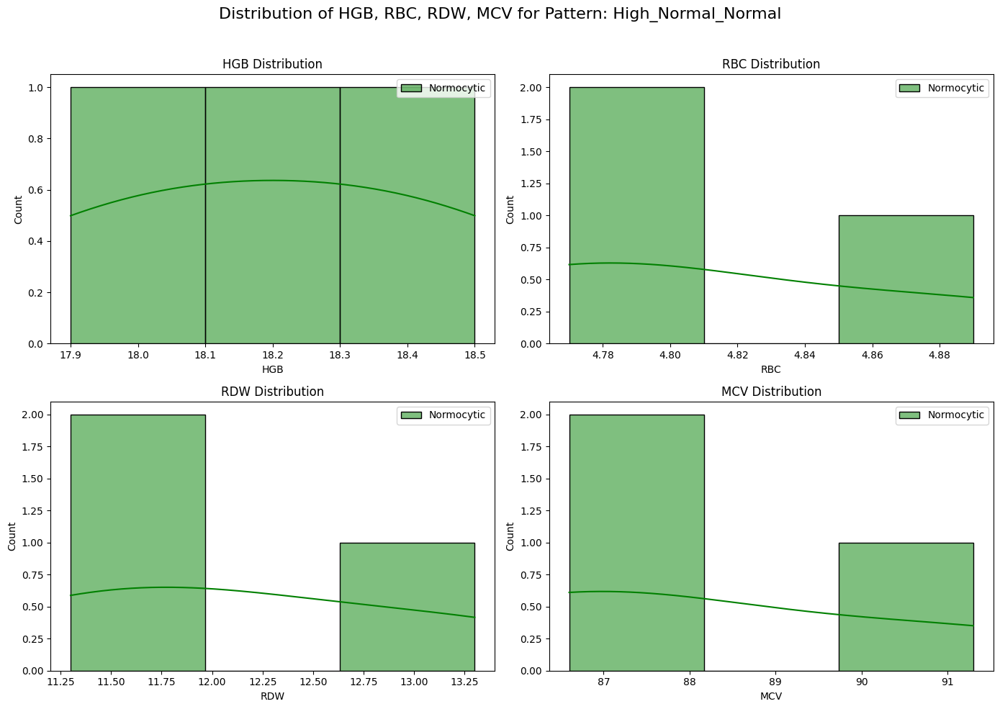


Pattern: High_High_Normal
No data available for pattern: High_High_Normal
No data available for pattern: High_High_Normal


/tmp/ipykernel_229411/1282487352.py:224: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[0, 0].legend()
/tmp/ipykernel_229411/1282487352.py:230: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[0, 1].legend()
/tmp/ipykernel_229411/1282487352.py:236: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[1, 0].legend()
/tmp/ipykernel_229411/1282487352.py:242: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[1, 1].legend()


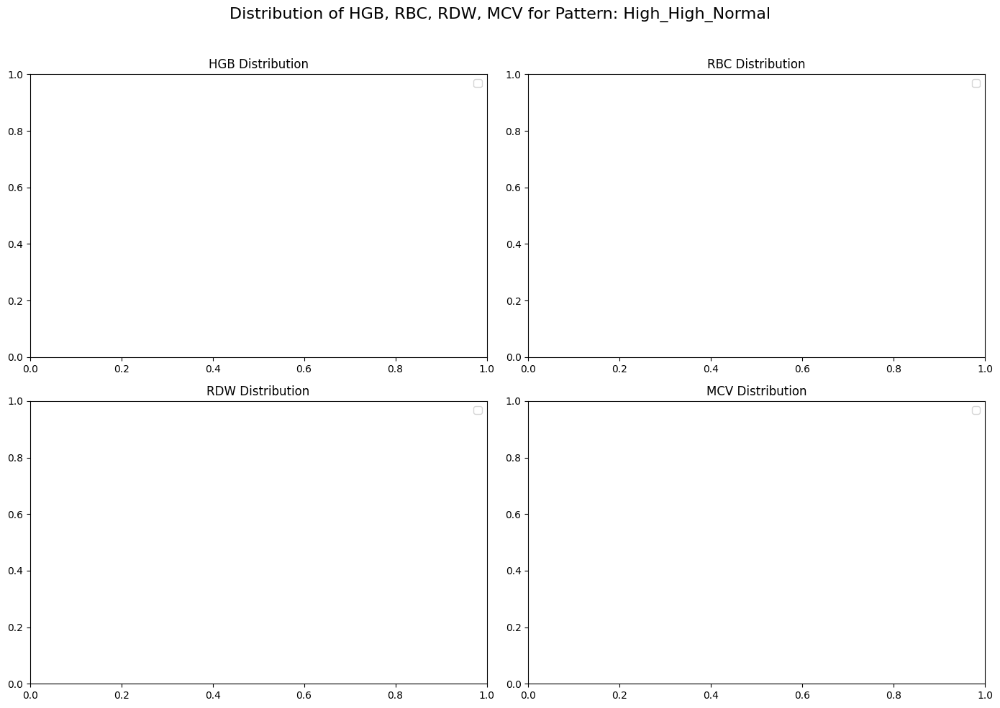


Pattern: High_High_High
DataFrame for Macrocytic (>100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
9538,5.07,17.7,51.2,100.9,35.0,34.8,12.0,177.0,High,High,High,19.901381,Macrocytic (>100)
12170,5.01,17.7,50.4,100.6,35.3,35.0,12.0,208.0,High,High,High,20.079840,Macrocytic (>100)
18059,5.34,18.2,53.5,100.4,34.2,34.0,12.4,255.0,High,High,High,18.801498,Macrocytic (>100)
30215,5.14,18.8,54.9,106.7,36.5,34.3,13.5,165.0,High,High,High,20.758755,Macrocytic (>100)
30295,5.26,17.8,54.1,102.8,33.9,33.0,11.2,253.0,High,High,High,19.543726,Macrocytic (>100)
37074,5.18,18.3,54.1,104.5,35.3,33.8,12.9,157.0,High,High,High,20.173745,Macrocytic (>100)
40443,5.61,19.7,56.3,100.3,35.1,35.0,12.0,194.0,High,High,High,17.878788,Macrocytic (>100)
56225,5.07,18.3,51.3,101.0,36.0,35.7,13.4,224.0,High,High,High,19.921105,Macrocytic (>100)
57408,5.03,18.8,53.3,106.0,37.3,35.2,13.4,138.0,High,High,High,21.073559,Macrocytic (>100)
68962,5.07,17.7,51.1,100.8,34.9,34.7,12.9,192.0,High,High,High,19.881657,Macrocytic (>100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000
mean,5.212222,18.166667,53.083333,101.922222,34.861111,34.233333,13.105556,202.500000,19.583681
std,0.200046,0.574968,1.961767,1.936509,1.126232,0.902936,1.142480,37.221515,0.884732
min,5.010000,17.600000,50.400000,100.300000,32.600000,32.700000,11.200000,138.000000,17.834507
25%,5.070000,17.700000,51.475000,100.650000,34.050000,33.350000,12.450000,168.000000,19.514563
50%,5.150000,18.000000,53.000000,100.950000,34.900000,34.500000,13.100000,201.000000,19.766674
75%,5.240000,18.300000,54.100000,102.300000,35.300000,34.950000,13.475000,230.000000,20.040156
max,5.680000,19.700000,57.500000,106.700000,37.300000,35.700000,16.300000,255.000000,21.073559



DataFrame for Normocytic (80-100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
154,5.56,17.7,51.6,92.9,31.8,34.3,13.3,234.0,High,High,High,16.708633,Normocytic (80-100)
165,5.61,18.3,52.8,94.1,32.6,34.7,14.7,247.0,High,High,High,16.773619,Normocytic (80-100)
227,5.65,17.6,51.8,91.7,31.1,33.9,11.9,288.0,High,High,High,16.230088,Normocytic (80-100)
428,5.86,18.0,52.4,89.4,30.7,34.3,13.5,209.0,High,High,High,15.255973,Normocytic (80-100)
444,5.65,17.7,52.6,93.2,31.3,33.7,12.6,269.0,High,High,High,16.495575,Normocytic (80-100)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
114178,5.47,17.8,51.2,93.5,32.6,34.9,13.4,172.0,High,High,High,17.093236,Normocytic (80-100)
114670,5.21,17.9,51.5,98.9,34.3,34.8,13.4,202.0,High,High,High,18.982726,Normocytic (80-100)
114726,5.36,17.6,50.4,94.1,32.9,34.9,13.7,210.0,High,High,High,17.555970,Normocytic (80-100)
114912,5.82,17.9,51.4,88.5,30.8,34.8,13.1,337.0,High,High,High,15.206186,Normocytic (80-100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,470.000000,470.000000,470.000000,470.000000,470.000000,470.000000,470.000000,470.000000,470.000000
mean,5.738766,18.043404,52.366809,91.378298,31.510213,34.491277,12.951702,239.759574,15.984140
std,0.285976,0.460172,1.834415,3.770364,1.435234,0.860820,0.906237,58.229233,1.320698
min,5.030000,17.600000,48.100000,81.500000,26.600000,32.100000,11.200000,97.000000,12.190760
25%,5.550000,17.700000,51.100000,89.100000,30.700000,33.900000,12.300000,198.000000,15.121528
50%,5.710000,17.900000,52.200000,91.400000,31.400000,34.500000,12.800000,234.500000,15.930805
75%,5.880000,18.200000,53.500000,93.900000,32.475000,35.000000,13.400000,270.750000,16.907414
max,6.710000,19.900000,59.100000,99.900000,35.500000,37.400000,17.400000,503.000000,19.761431



DataFrame for Microcytic (<80):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
10621,9.16,18.5,59.9,65.4,20.2,30.9,22.1,671.0,High,High,High,7.139738,Microcytic (<80)
34753,6.70,17.9,52.0,77.7,26.7,34.4,13.2,302.0,High,High,High,11.597015,Microcytic (<80)
78530,7.90,17.9,59.0,74.6,22.7,30.4,17.9,376.0,High,High,High,9.443038,Microcytic (<80)
111223,6.69,17.7,50.8,76.0,26.5,34.9,15.9,291.0,High,High,High,11.360239,Microcytic (<80)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,4.00000,4.00000,4.000000,4.000000,4.000000,4.000000,4.000000,4.00000,4.000000
mean,7.61250,18.00000,55.425000,73.425000,24.025000,32.650000,17.275000,410.00000,9.885008
std,1.17772,0.34641,4.687839,5.498106,3.144705,2.327373,3.749111,178.04681,2.068745
min,6.69000,17.70000,50.800000,65.400000,20.200000,30.400000,13.200000,291.00000,7.139738
25%,6.69750,17.85000,51.700000,72.300000,22.075000,30.775000,15.225000,299.25000,8.867213
50%,7.30000,17.90000,55.500000,75.300000,24.600000,32.650000,16.900000,339.00000,10.401639
75%,8.21500,18.05000,59.225000,76.425000,26.550000,34.525000,18.950000,449.75000,11.419433
max,9.16000,18.50000,59.900000,77.700000,26.700000,34.900000,22.100000,671.00000,11.597015


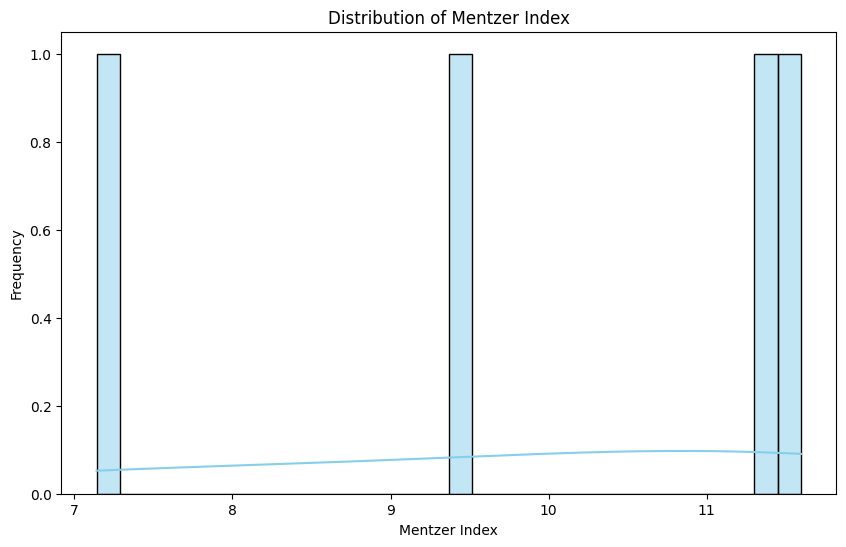

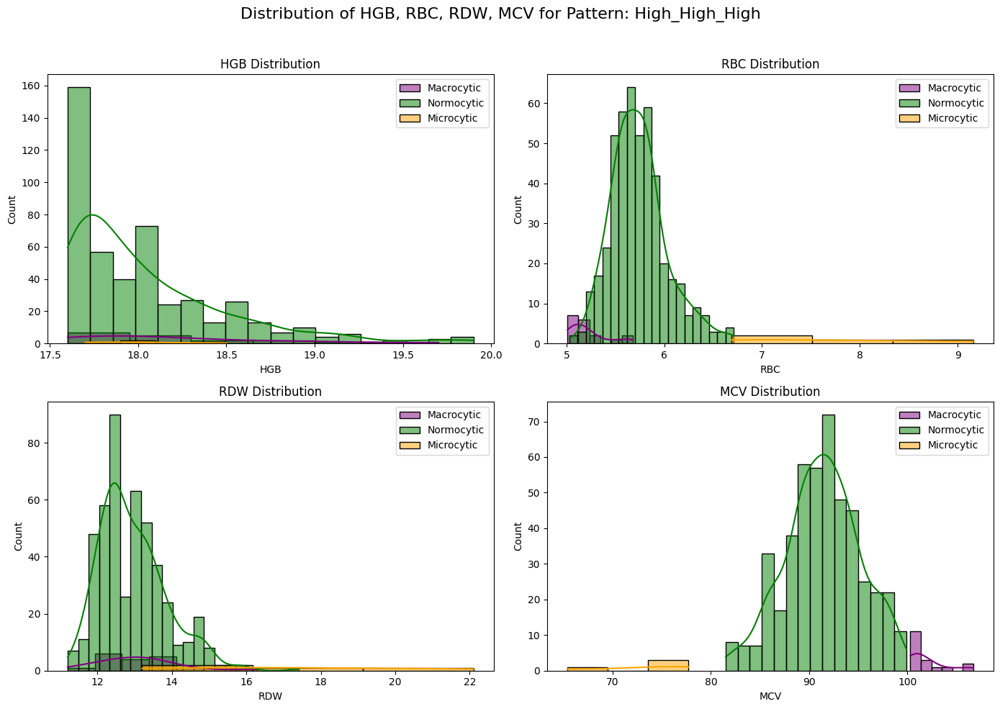

In [42]:
normal_patterns = [
            "Normal_Normal_Normal", "Normal_Normal_Low", "Normal_Normal_High",
            "Normal_High_Normal", "Normal_High_High", "High_Normal_High",
            "High_Normal_Normal" , "High_High_Normal","High_High_High",
        ]

for pattern in normal_patterns :
    print(f"\nPattern: {pattern}")
    macrocytic_df, normocytic_df, microcytic_df =classify_mcv_status(pattern)
    
    
    if not macrocytic_df.empty:
        print("DataFrame for Macrocytic (>100):")
        macrocytic_df
        macrocytic_df.describe()
    
    
    if not normocytic_df.empty:
        
        print("\nDataFrame for Normocytic (80-100):")
        normocytic_df
        normocytic_df.describe()
    
    if not microcytic_df.empty:
        print("\nDataFrame for Microcytic (<80):")
        microcytic_df
        microcytic_df.describe()
        plot_mentzer_distribution(microcytic_df) #Mentzer Index
    plot_distribution_by_category(pattern)
    



Pattern: Low_High_Low

DataFrame for Microcytic (<80):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
594,5.44,8.9,29.4,54.0,16.4,30.4,21.7,661.0,Low,High,Low,9.926471,Microcytic (<80)
3778,5.13,11.0,33.3,64.9,21.3,32.8,13.8,327.0,Low,High,Low,12.651072,Microcytic (<80)
3806,5.04,10.4,31.9,63.4,20.8,32.8,18.3,299.0,Low,High,Low,12.579365,Microcytic (<80)
5300,5.39,8.9,29.9,55.4,16.5,29.6,20.2,549.0,Low,High,Low,10.278293,Microcytic (<80)
5644,5.16,9.6,31.1,60.2,18.6,30.9,16.9,393.0,Low,High,Low,11.666667,Microcytic (<80)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
113123,5.19,9.9,30.9,59.6,19.1,32.0,14.7,288.0,Low,High,Low,11.483622,Microcytic (<80)
113457,5.11,10.7,33.9,66.2,21.0,31.7,16.7,319.0,Low,High,Low,12.954990,Microcytic (<80)
113530,5.11,9.8,32.2,63.0,19.2,30.5,18.7,352.0,Low,High,Low,12.328767,Microcytic (<80)
113547,5.15,10.8,33.2,64.4,20.9,32.4,17.1,273.0,Low,High,Low,12.504854,Microcytic (<80)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,157.000000,158.000000
mean,5.306076,10.134810,32.255696,60.774684,19.162658,31.359494,17.970253,346.649682,11.519465
std,0.298465,0.844836,1.613932,5.247334,1.962596,1.550140,2.797599,106.548645,1.390088
min,5.010000,6.700000,26.500000,35.400000,10.200000,25.200000,13.100000,88.000000,4.937238
25%,5.100000,9.900000,31.325000,59.100000,18.425000,30.725000,15.800000,273.000000,10.847197
50%,5.200000,10.300000,32.850000,62.000000,19.600000,31.600000,17.700000,337.000000,11.943240
75%,5.457500,10.600000,33.500000,64.050000,20.300000,32.300000,19.675000,396.000000,12.578740
max,7.170000,11.400000,33.900000,67.000000,22.400000,34.500000,28.200000,661.000000,13.320080


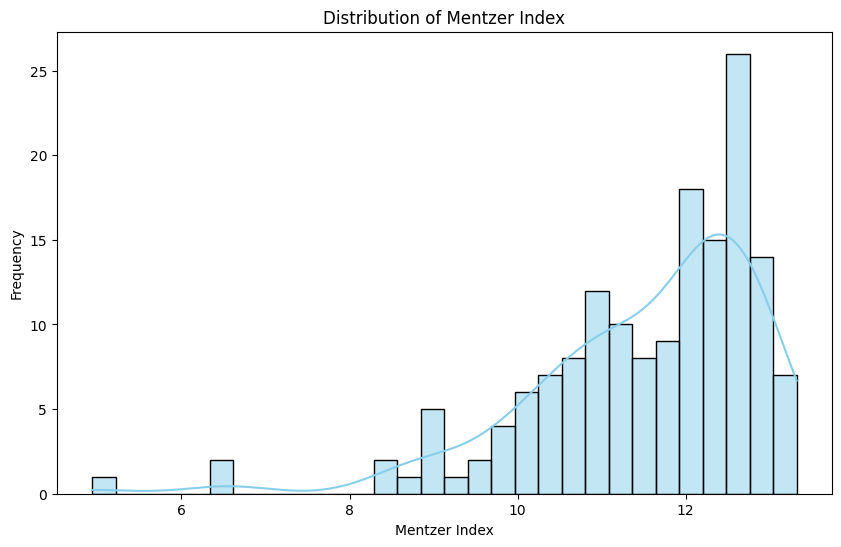

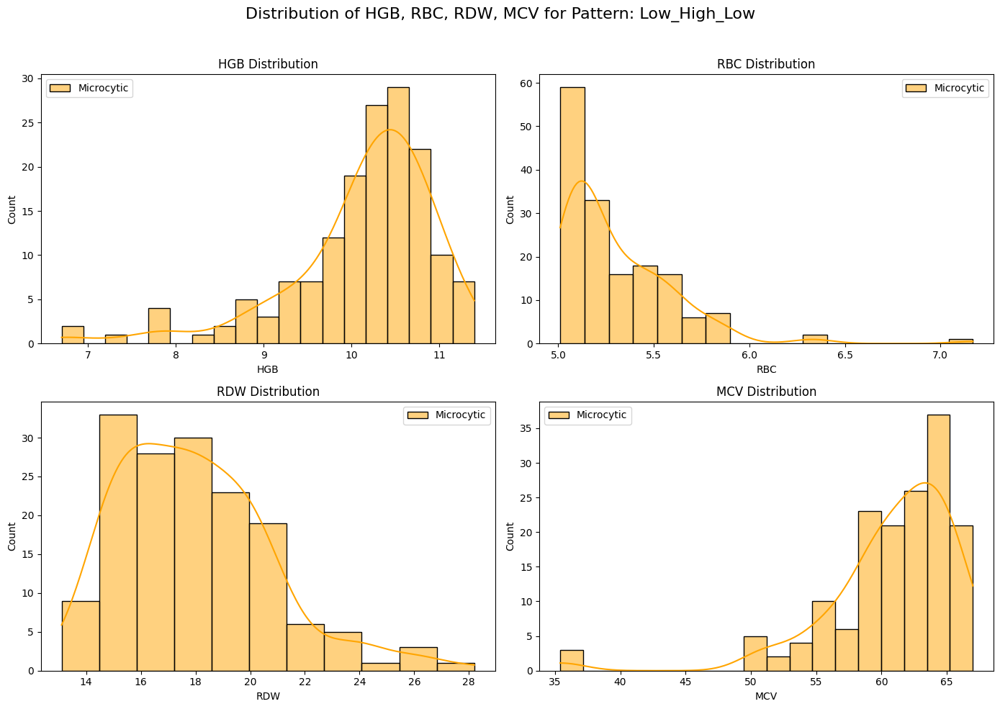


Pattern: Low_High_Normal

DataFrame for Microcytic (<80):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
56,5.31,11.9,36.3,68.5,22.4,32.8,13.0,397.0,Low,High,Normal,12.900188,Microcytic (<80)
72,5.66,11.0,34.2,60.3,19.4,32.2,14.5,412.0,Low,High,Normal,10.653710,Microcytic (<80)
515,5.60,11.8,37.2,66.4,21.0,31.6,14.7,351.0,Low,High,Normal,11.857143,Microcytic (<80)
1539,5.23,11.7,36.8,70.3,22.4,31.9,15.1,206.0,Low,High,Normal,13.441683,Microcytic (<80)
1803,5.16,11.6,35.8,69.4,22.5,32.3,13.1,369.0,Low,High,Normal,13.449612,Microcytic (<80)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
114661,5.60,11.9,37.8,67.6,21.4,31.6,16.8,303.0,Low,High,Normal,12.071429,Microcytic (<80)
114805,5.11,11.9,37.2,72.8,23.4,32.0,14.2,303.0,Low,High,Normal,14.246575,Microcytic (<80)
114978,5.03,11.8,35.8,71.2,23.4,32.8,14.6,354.0,Low,High,Normal,14.155070,Microcytic (<80)
115249,5.15,11.7,37.8,73.6,22.7,30.9,19.7,346.0,Low,High,Normal,14.291262,Microcytic (<80)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,5.359150,11.460277,35.986957,67.338538,21.444071,31.839526,15.809091,314.776680,12.633336
std,0.299521,0.333810,1.107950,3.736780,1.304332,0.774430,2.037859,88.565485,1.284272
min,5.010000,9.900000,34.000000,56.800000,17.000000,28.900000,12.100000,109.000000,8.772727
25%,5.120000,11.200000,35.200000,64.900000,20.600000,31.300000,14.500000,258.000000,11.821872
50%,5.290000,11.500000,36.000000,67.900000,21.700000,31.800000,15.400000,303.000000,12.879064
75%,5.520000,11.700000,36.800000,70.100000,22.400000,32.300000,16.600000,360.500000,13.600189
max,6.600000,11.900000,39.000000,75.600000,24.000000,34.600000,31.600000,816.000000,14.730539


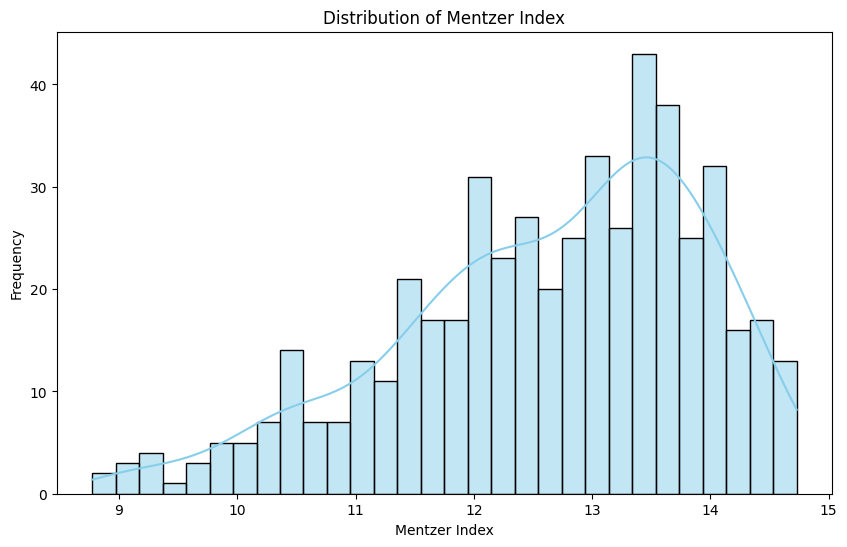

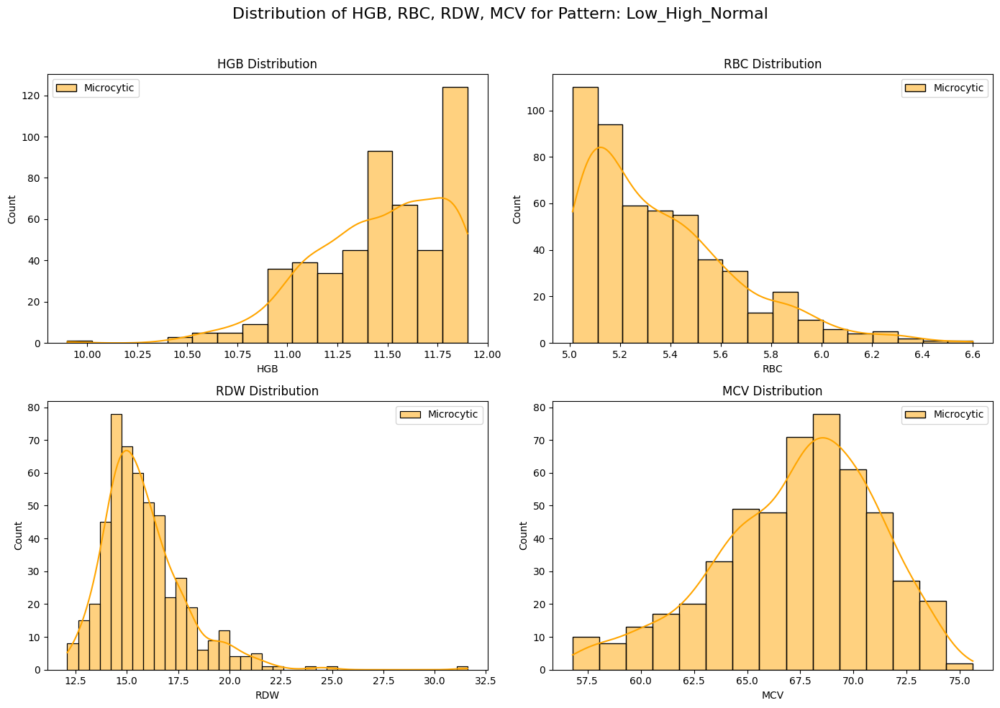

In [43]:
# Early or not microcytosis patterns [ clearly pattern ( only Microcytosis)]
early_micro_patterns = ["Low_High_Low", "Low_High_Normal"]

for pattern in early_micro_patterns :
    print(f"\nPattern: {pattern}")
    macrocytic_df, normocytic_df, microcytic_df =classify_mcv_status(pattern)
    
    
    if not macrocytic_df.empty:
        print("DataFrame for Macrocytic (>100):")
        macrocytic_df
        macrocytic_df.describe()
    
    
    if not normocytic_df.empty:
        
        print("\nDataFrame for Normocytic (80-100):")
        normocytic_df
        normocytic_df.describe()
    
    if not microcytic_df.empty:
        print("\nDataFrame for Microcytic (<80):")
        microcytic_df
        microcytic_df.describe()
        plot_mentzer_distribution(microcytic_df)
    plot_distribution_by_category(pattern)


Pattern: Normal_Low_Normal
DataFrame for Macrocytic (>100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
1562,3.76,13.9,40.6,108.1,37.0,34.2,14.1,240.0,Normal,Low,Normal,28.750000,Macrocytic (>100)
1983,3.53,12.7,36.7,104.0,36.0,34.6,12.6,266.0,Normal,Low,Normal,29.461756,Macrocytic (>100)
2027,3.59,12.7,36.7,102.1,35.3,34.5,12.5,232.0,Normal,Low,Normal,28.440111,Macrocytic (>100)
2204,3.63,12.3,36.9,101.6,33.8,33.3,15.5,346.0,Normal,Low,Normal,27.988981,Macrocytic (>100)
2294,3.67,13.0,38.4,104.7,35.5,33.9,14.0,98.0,Normal,Low,Normal,28.528610,Macrocytic (>100)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
112553,3.54,14.5,41.0,115.8,41.1,35.5,14.7,425.0,Normal,Low,Normal,32.711864,Macrocytic (>100)
113843,3.50,12.3,36.4,104.1,35.2,33.9,14.3,202.0,Normal,Low,Normal,29.742857,Macrocytic (>100)
113931,3.65,12.9,37.7,103.4,35.3,34.1,14.1,191.0,Normal,Low,Normal,28.328767,Macrocytic (>100)
114249,3.78,13.5,38.4,101.3,35.6,35.1,12.5,274.0,Normal,Low,Normal,26.798942,Macrocytic (>100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000
mean,3.590000,12.851190,37.510317,104.579762,35.812698,34.251984,13.624206,218.984127,29.208813
std,0.150259,0.622326,1.563036,4.172967,1.751424,1.010165,1.722666,81.661822,2.145377
min,3.030000,12.000000,34.300000,100.100000,32.500000,31.700000,11.200000,38.000000,26.517150
25%,3.490000,12.400000,36.400000,101.600000,34.700000,33.600000,12.600000,166.000000,27.586207
50%,3.610000,12.700000,37.400000,103.200000,35.300000,34.200000,13.200000,212.000000,28.700030
75%,3.720000,13.200000,38.300000,106.125000,36.700000,34.800000,14.300000,266.000000,30.179806
max,3.790000,15.100000,43.600000,119.200000,41.600000,39.500000,26.100000,542.000000,38.547855



DataFrame for Normocytic (80-100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
122,3.52,12.1,34.7,98.5,34.1,34.7,11.5,274.0,Normal,Low,Normal,27.982955,Normocytic (80-100)
349,3.63,12.5,36.0,99.1,34.5,34.8,12.0,312.0,Normal,Low,Normal,27.300275,Normocytic (80-100)
578,3.59,12.1,34.6,96.2,33.7,35.0,12.1,192.0,Normal,Low,Normal,26.796657,Normocytic (80-100)
680,3.76,12.4,36.1,95.7,32.7,34.2,12.1,181.0,Normal,Low,Normal,25.452128,Normocytic (80-100)
700,3.70,12.2,35.4,95.7,32.9,34.4,12.3,217.0,Normal,Low,Normal,25.864865,Normocytic (80-100)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
115153,3.73,12.4,34.8,93.2,33.0,35.5,14.4,171.0,Normal,Low,Normal,24.986595,Normocytic (80-100)
115203,3.78,12.2,35.7,94.6,32.1,34.0,14.6,190.0,Normal,Low,Normal,25.026455,Normocytic (80-100)
115327,3.79,12.4,37.1,98.0,32.6,33.3,14.7,195.0,Normal,Low,Normal,25.857520,Normocytic (80-100)
115418,3.79,12.4,37.2,98.1,32.8,33.4,15.9,218.0,Normal,Low,Normal,25.883905,Normocytic (80-100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000
mean,3.710036,12.350000,35.713177,96.257581,33.260289,34.562635,12.974188,237.832130,25.956403
std,0.065025,0.299985,0.901088,2.260220,0.903005,0.839440,1.229285,70.375348,0.865739
min,3.460000,12.000000,34.000000,90.500000,31.500000,32.000000,11.000000,18.000000,23.941799
25%,3.670000,12.100000,35.000000,94.625000,32.600000,34.000000,12.200000,191.000000,25.347594
50%,3.720000,12.300000,35.700000,96.400000,33.200000,34.500000,12.700000,227.000000,25.952381
75%,3.760000,12.500000,36.375000,98.100000,33.800000,35.000000,13.400000,280.000000,26.517266
max,3.790000,15.000000,37.800000,100.000000,39.900000,40.300000,21.100000,638.000000,28.728324


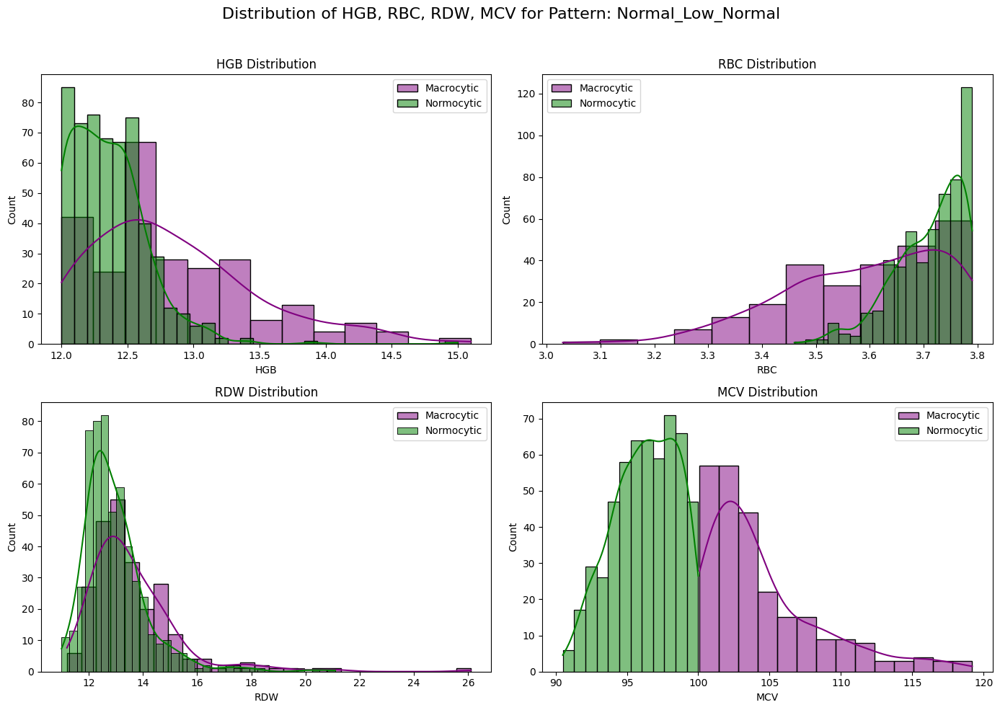


Pattern: Normal_Low_Low
DataFrame for Macrocytic (>100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
68732,3.01,14.0,31.1,103.2,46.4,44.9,13.3,178.0,Normal,Low,Low,34.285714,Macrocytic (>100)
69698,1.67,12.5,17.9,107.1,74.5,69.6,13.1,260.0,Normal,Low,Low,64.131737,Macrocytic (>100)
109307,3.26,13.2,32.7,100.2,40.6,40.5,15.2,220.0,Normal,Low,Low,30.736196,Macrocytic (>100)
114682,2.96,12.2,33.5,113.3,41.1,36.3,18.2,383.0,Normal,Low,Low,38.277027,Macrocytic (>100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,4.000000,4.000000,4.000000,4.00000,4.000000,4.000000,4.000000,4.000000,4.000000
mean,2.725000,12.975000,28.800000,105.95000,50.650000,47.825000,14.950000,260.250000,41.857669
std,0.715472,0.801561,7.334848,5.65597,16.115107,14.935277,2.364318,88.417099,15.165495
min,1.670000,12.200000,17.900000,100.20000,40.600000,36.300000,13.100000,178.000000,30.736196
25%,2.637500,12.425000,27.800000,102.45000,40.975000,39.450000,13.250000,209.500000,33.398335
50%,2.985000,12.850000,31.900000,105.15000,43.750000,42.700000,14.250000,240.000000,36.281371
75%,3.072500,13.400000,32.900000,108.65000,53.425000,51.075000,15.950000,290.750000,44.740704
max,3.260000,14.000000,33.500000,113.30000,74.500000,69.600000,18.200000,383.000000,64.131737



DataFrame for Normocytic (80-100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
1824,3.43,12.3,33.8,98.2,35.8,36.4,12.3,280.0,Normal,Low,Low,28.629738,Normocytic (80-100)
5726,3.40,12.0,33.6,98.9,35.2,35.6,12.5,216.0,Normal,Low,Low,29.088235,Normocytic (80-100)
6723,3.35,12.4,32.9,98.6,37.2,37.7,13.5,236.0,Normal,Low,Low,29.432836,Normocytic (80-100)
9829,3.63,12.0,33.3,91.8,32.9,35.8,12.2,246.0,Normal,Low,Low,25.289256,Normocytic (80-100)
11496,3.51,12.1,33.9,96.5,34.2,35.5,11.4,308.0,Normal,Low,Low,27.492877,Normocytic (80-100)
13081,2.86,12.3,27.8,96.9,42.8,44.2,11.8,333.0,Normal,Low,Low,33.881119,Normocytic (80-100)
14289,3.32,12.5,32.4,97.5,37.5,38.6,13.7,398.0,Normal,Low,Low,29.367470,Normocytic (80-100)
15172,3.62,12.0,33.8,93.4,32.9,35.3,12.6,211.0,Normal,Low,Low,25.801105,Normocytic (80-100)
20005,3.46,13.3,32.7,94.4,38.3,40.5,12.9,305.0,Normal,Low,Low,27.283237,Normocytic (80-100)
28627,3.76,12.1,33.5,89.2,32.1,35.9,12.3,335.0,Normal,Low,Low,23.723404,Normocytic (80-100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000
mean,3.563333,12.223810,33.295238,93.588095,34.321429,36.695238,12.733333,270.404762,26.359644
std,0.164579,0.354628,1.030025,3.504506,2.245704,2.000360,0.731743,75.924564,2.171778
min,2.860000,12.000000,27.800000,84.600000,31.600000,35.300000,11.400000,142.000000,22.321900
25%,3.480000,12.000000,33.300000,91.950000,32.825000,35.700000,12.225000,217.500000,25.163378
50%,3.605000,12.100000,33.600000,93.150000,33.900000,35.950000,12.600000,253.500000,25.844997
75%,3.647500,12.275000,33.800000,96.475000,35.000000,36.925000,13.175000,312.500000,27.612884
max,3.790000,13.500000,33.900000,98.900000,42.800000,44.200000,14.500000,488.000000,33.881119


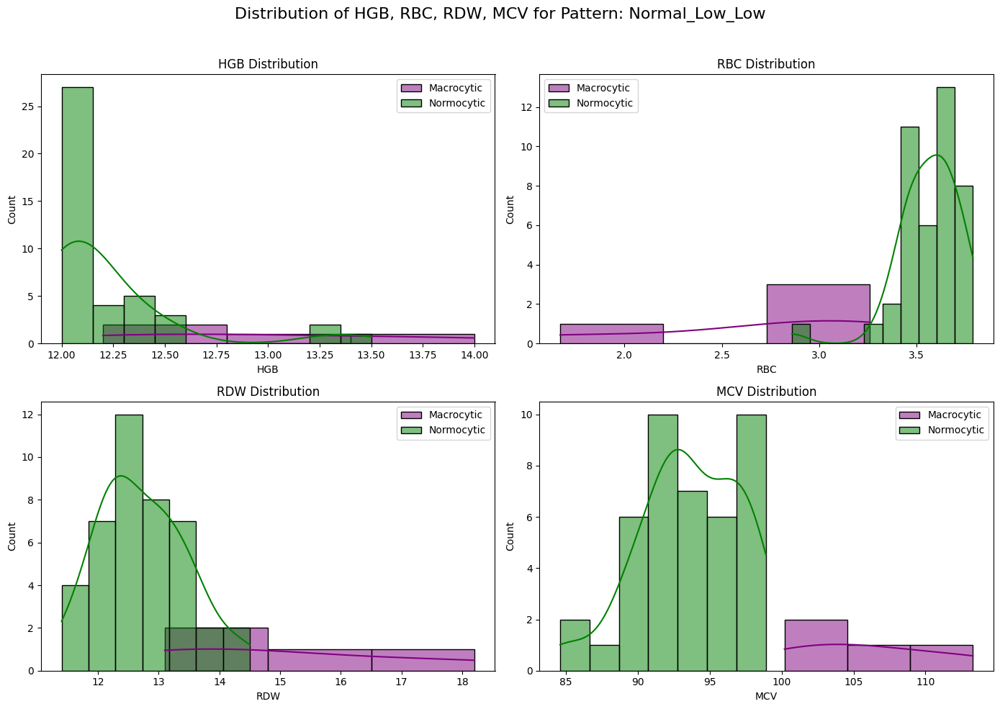

In [44]:
# Early macrocytosis patterns [ clearly pattern ( only Macrocytosis | Normocytosis)]
early_macro_patterns = ["Normal_Low_Normal", "Normal_Low_Low"]
    

for pattern in early_macro_patterns :
    print(f"\nPattern: {pattern}")
    macrocytic_df, normocytic_df, microcytic_df =classify_mcv_status(pattern)
    
    
    if not macrocytic_df.empty:
        print("DataFrame for Macrocytic (>100):")
        macrocytic_df
        macrocytic_df.describe()
    
    
    if not normocytic_df.empty:
        
        print("\nDataFrame for Normocytic (80-100):")
        normocytic_df
        normocytic_df.describe()
    
    if not microcytic_df.empty:
        print("\nDataFrame for Microcytic (<80):")
        microcytic_df
        microcytic_df.describe()
    plot_distribution_by_category(pattern)


Pattern: Low_Normal_Normal

DataFrame for Normocytic (80-100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
37,4.32,11.4,35.0,81.0,26.6,32.8,13.9,347.0,Low,Normal,Normal,18.750000,Normocytic (80-100)
38,4.15,11.8,34.7,83.4,28.4,34.0,12.4,317.0,Low,Normal,Normal,20.096386,Normocytic (80-100)
39,4.11,11.9,35.0,85.3,29.0,34.0,13.1,305.0,Low,Normal,Normal,20.754258,Normocytic (80-100)
85,3.84,11.6,35.6,92.8,30.5,32.8,12.9,322.0,Low,Normal,Normal,24.166667,Normocytic (80-100)
155,4.16,11.6,34.3,82.4,27.8,33.8,12.0,317.0,Low,Normal,Normal,19.807692,Normocytic (80-100)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
115347,4.17,11.6,34.1,81.8,27.8,33.9,13.9,301.0,Low,Normal,Normal,19.616307,Normocytic (80-100)
115352,4.49,11.4,36.3,80.9,25.5,31.5,16.4,258.0,Low,Normal,Normal,18.017817,Normocytic (80-100)
115378,3.89,11.9,35.6,91.6,30.5,33.3,14.2,297.0,Low,Normal,Normal,23.547558,Normocytic (80-100)
115395,4.05,11.6,35.1,86.7,28.6,33.0,15.1,190.0,Low,Normal,Normal,21.407407,Normocytic (80-100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,2720.000000,2720.000000,2720.000000,2720.000000,2720.000000,2720.000000,2720.000000,2720.000000,2720.000000
mean,4.143489,11.655294,35.238787,85.185956,28.169449,33.070882,13.852463,287.818382,20.630930
std,0.183808,0.238917,0.819363,3.433282,1.314425,0.807917,1.536222,80.616629,1.690078
min,3.800000,10.500000,34.000000,80.100000,21.300000,25.100000,10.900000,46.000000,16.722338
25%,4.000000,11.500000,34.600000,82.300000,27.200000,32.500000,12.800000,233.000000,19.248384
50%,4.150000,11.700000,35.200000,84.700000,28.100000,33.100000,13.600000,280.000000,20.415146
75%,4.280000,11.900000,35.800000,87.700000,29.100000,33.600000,14.600000,332.000000,21.878554
max,4.920000,11.900000,41.700000,96.900000,31.400000,35.100000,27.300000,731.000000,25.340314



DataFrame for Microcytic (<80):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
28,4.48,11.7,35.2,78.4,26.1,33.3,11.8,347.0,Low,Normal,Normal,17.500000,Microcytic (<80)
91,4.65,11.4,34.4,73.9,24.4,33.1,13.9,389.0,Low,Normal,Normal,15.892473,Microcytic (<80)
107,4.36,11.3,34.8,79.9,25.8,32.2,15.1,251.0,Low,Normal,Normal,18.325688,Microcytic (<80)
134,4.78,11.5,34.8,72.8,24.0,33.0,16.0,340.0,Low,Normal,Normal,15.230126,Microcytic (<80)
164,4.79,11.6,36.3,75.9,24.3,32.0,13.3,206.0,Low,Normal,Normal,15.845511,Microcytic (<80)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
115264,4.73,11.5,35.9,75.9,24.2,32.0,16.2,415.0,Low,Normal,Normal,16.046512,Microcytic (<80)
115282,4.51,11.6,35.6,79.0,25.7,32.5,15.8,149.0,Low,Normal,Normal,17.516630,Microcytic (<80)
115298,4.70,10.8,34.2,72.7,23.0,31.6,16.6,302.0,Low,Normal,Normal,15.468085,Microcytic (<80)
115348,4.79,11.6,36.0,75.1,24.2,32.2,18.0,192.0,Low,Normal,Normal,15.678497,Microcytic (<80)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,1663.000000,1663.000000,1663.000000,1663.000000,1663.000000,1663.000000,1663.000000,1663.000000,1663.000000
mean,4.618244,11.533434,35.181960,76.262237,25.005592,32.782922,14.740589,320.809982,16.556298
std,0.181885,0.311687,0.860652,2.621726,1.199137,0.921267,1.943831,81.928082,1.143930
min,4.230000,10.300000,34.000000,68.100000,21.200000,29.200000,11.300000,81.000000,13.647295
25%,4.480000,11.400000,34.500000,74.600000,24.200000,32.200000,13.500000,266.000000,15.727965
50%,4.600000,11.600000,35.100000,76.700000,25.100000,32.800000,14.400000,312.000000,16.645299
75%,4.750000,11.800000,35.700000,78.400000,25.900000,33.400000,15.600000,367.000000,17.458388
max,5.000000,11.900000,38.800000,80.000000,27.800000,35.000000,36.500000,761.000000,18.867925


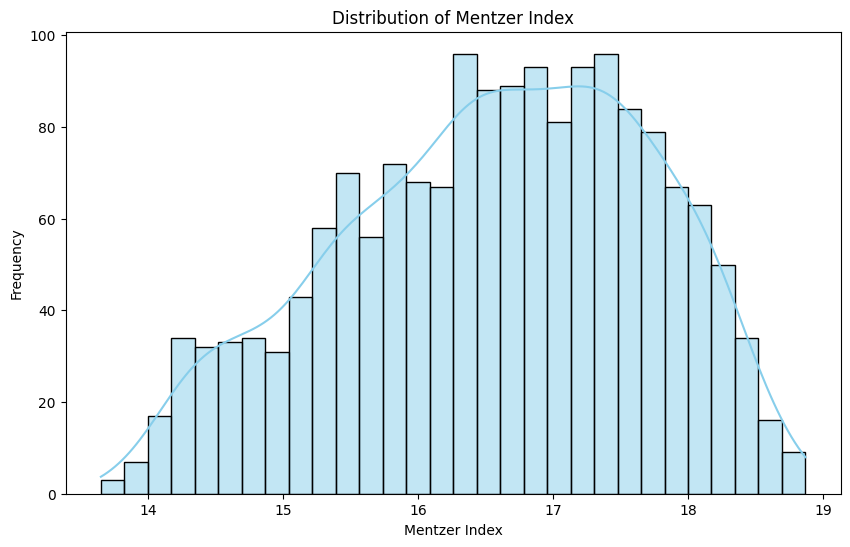

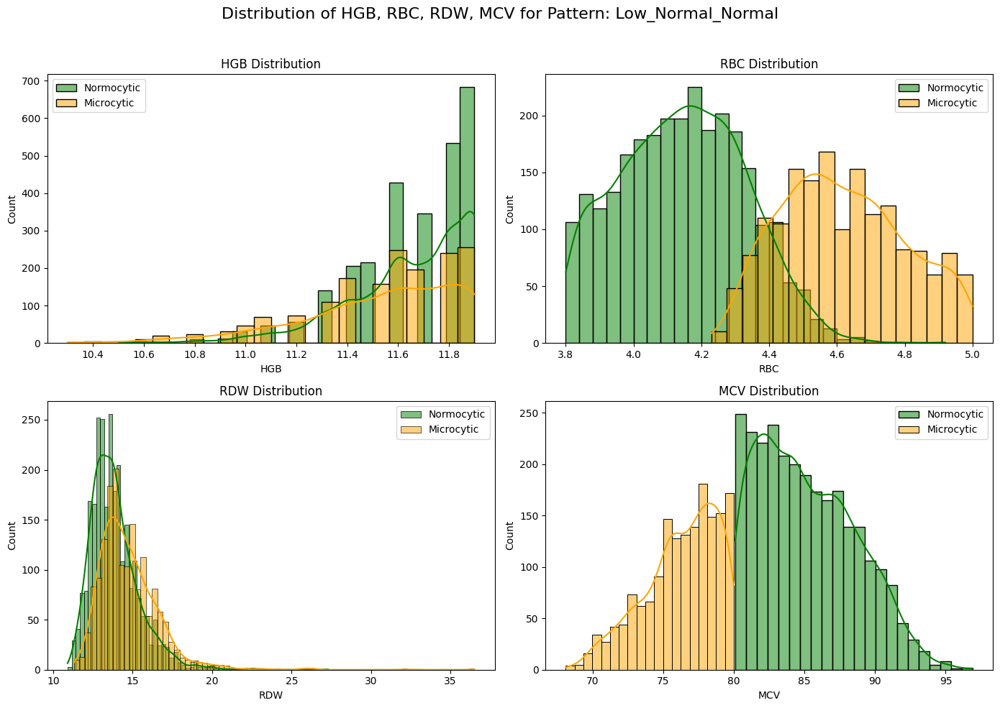


Pattern: Low_Normal_Low

DataFrame for Normocytic (80-100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
17,3.99,11.1,33.8,84.8,27.9,32.9,13.3,435.0,Low,Normal,Low,21.253133,Normocytic (80-100)
82,4.11,11.4,33.4,81.3,27.7,34.1,12.5,400.0,Low,Normal,Low,19.781022,Normocytic (80-100)
93,3.95,11.1,32.3,81.6,27.9,34.2,13.6,300.0,Low,Normal,Low,20.658228,Normocytic (80-100)
167,4.18,10.9,33.4,80.1,26.1,32.6,15.1,185.0,Low,Normal,Low,19.162679,Normocytic (80-100)
188,3.82,10.4,31.4,82.1,27.3,33.3,13.5,380.0,Low,Normal,Low,21.492147,Normocytic (80-100)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
114708,3.85,11.5,33.5,86.9,29.7,34.1,14.6,454.0,Low,Normal,Low,22.571429,Normocytic (80-100)
114783,4.01,10.9,33.6,83.9,27.1,32.3,16.3,494.0,Low,Normal,Low,20.922693,Normocytic (80-100)
114969,4.07,10.6,33.2,81.5,26.0,32.0,14.6,408.0,Low,Normal,Low,20.024570,Normocytic (80-100)
115230,3.92,11.1,32.5,82.8,28.2,34.1,12.9,287.0,Low,Normal,Low,21.122449,Normocytic (80-100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,1024.000000,1024.000000,1024.000000,1024.000000,1024.000000,1024.000000,1024.000000,1024.000000,1024.000000
mean,3.975439,11.238574,33.106055,83.326172,28.261133,33.916309,13.592187,297.547852,20.986386
std,0.109752,0.416435,0.699128,2.187148,1.152265,1.059149,1.467730,84.503747,1.033895
min,3.800000,9.800000,30.500000,80.100000,24.900000,30.600000,11.000000,36.000000,18.959811
25%,3.880000,11.000000,32.700000,81.500000,27.500000,33.200000,12.500000,238.750000,20.148883
50%,3.970000,11.300000,33.300000,83.000000,28.300000,34.000000,13.300000,291.000000,20.977154
75%,4.060000,11.600000,33.700000,84.800000,29.000000,34.700000,14.400000,341.000000,21.730526
max,4.230000,11.900000,33.900000,89.600000,31.300000,37.100000,23.000000,799.000000,23.500000



DataFrame for Microcytic (<80):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
3,4.77,9.3,29.4,61.5,19.4,31.6,15.3,471.0,Low,Normal,Low,12.893082,Microcytic (<80)
136,4.41,11.1,33.1,74.9,25.0,33.3,14.0,334.0,Low,Normal,Low,16.984127,Microcytic (<80)
228,4.39,10.6,32.4,73.8,24.1,32.6,13.6,422.0,Low,Normal,Low,16.810934,Microcytic (<80)
230,4.23,10.6,31.7,74.9,25.3,33.7,15.4,254.0,Low,Normal,Low,17.706856,Microcytic (<80)
261,4.11,10.9,32.4,78.9,26.5,33.6,12.5,272.0,Low,Normal,Low,19.197080,Microcytic (<80)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
115175,4.48,11.4,33.3,74.3,25.5,34.4,13.8,310.0,Low,Normal,Low,16.584821,Microcytic (<80)
115291,4.29,11.5,33.3,77.7,26.7,34.5,14.5,341.0,Low,Normal,Low,18.111888,Microcytic (<80)
115309,4.28,8.2,28.5,66.5,19.0,28.6,22.3,203.0,Low,Normal,Low,15.537383,Microcytic (<80)
115411,4.06,11.0,32.0,78.8,27.2,34.5,14.2,393.0,Low,Normal,Low,19.408867,Microcytic (<80)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,1793.000000,1793.000000,1793.000000,1793.000000,1793.000000,1793.000000,1793.000000,1792.000000,1793.000000
mean,4.353837,10.390519,31.725265,73.034244,23.921249,32.679587,15.952091,333.728237,16.871253
std,0.260442,1.031631,2.145940,5.510926,2.616907,1.579715,2.721422,96.449472,1.944053
min,3.800000,5.400000,21.100000,50.500000,13.200000,25.200000,11.000000,53.000000,10.303030
25%,4.180000,9.900000,30.800000,69.600000,22.200000,31.600000,13.800000,266.000000,15.454545
50%,4.320000,10.600000,32.400000,74.400000,24.400000,32.800000,15.500000,323.000000,17.165899
75%,4.530000,11.100000,33.300000,77.400000,25.900000,33.800000,17.600000,387.000000,18.452381
max,4.990000,11.900000,33.900000,80.000000,29.200000,37.000000,30.900000,818.000000,20.863874


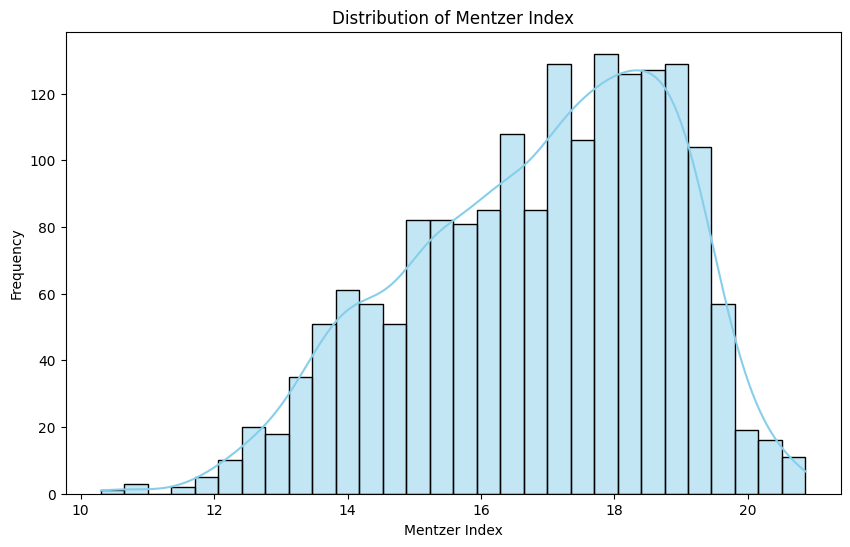

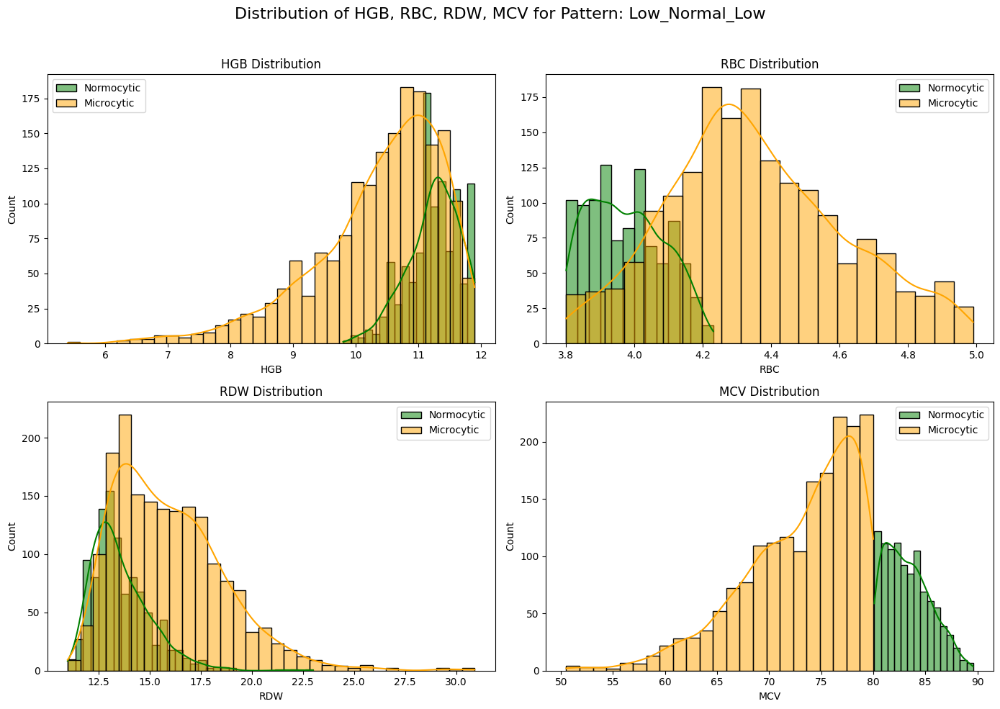

In [45]:
 # Moderate Anemia [ clearly pattern (Microcytosis  or normo)] :Low_Normal_Normal"(pre low hct) 
moderate_anemia_patterns = [ "Low_Normal_Normal", "Low_Normal_Low"]


for pattern in moderate_anemia_patterns :
    print(f"\nPattern: {pattern}")
    macrocytic_df, normocytic_df, microcytic_df =classify_mcv_status(pattern)
    
    
    if not macrocytic_df.empty:
        print("DataFrame for Macrocytic (>100):")
        macrocytic_df
        macrocytic_df.describe()
    
    
    if not normocytic_df.empty:
        
        print("\nDataFrame for Normocytic (80-100):")
        normocytic_df
        normocytic_df.describe()
    
    if not microcytic_df.empty:
        print("\nDataFrame for Microcytic (<80):")
        microcytic_df
        microcytic_df.describe()
        plot_mentzer_distribution(microcytic_df)
    plot_distribution_by_category(pattern)


Pattern: Low_Low_Normal
DataFrame for Macrocytic (>100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
1060,3.41,11.9,34.3,100.6,34.9,34.7,15.0,286.0,Low,Low,Normal,29.501466,Macrocytic (>100)
1549,3.32,11.9,34.8,104.6,35.7,34.1,19.6,304.0,Low,Low,Normal,31.506024,Macrocytic (>100)
1915,3.45,11.9,35.1,101.6,34.3,33.8,12.7,297.0,Low,Low,Normal,29.449275,Macrocytic (>100)
2781,3.43,11.3,35.5,103.4,32.8,31.7,13.1,359.0,Low,Low,Normal,30.145773,Macrocytic (>100)
5191,3.37,11.6,34.8,103.4,34.2,33.1,13.9,154.0,Low,Low,Normal,30.682493,Macrocytic (>100)
5595,3.36,11.4,34.5,102.6,33.7,32.9,17.0,340.0,Low,Low,Normal,30.535714,Macrocytic (>100)
10574,3.13,11.7,35.2,112.8,37.4,33.2,17.4,222.0,Low,Low,Normal,36.038339,Macrocytic (>100)
12719,3.44,11.6,34.4,100.1,33.8,33.8,11.4,235.0,Low,Low,Normal,29.098837,Macrocytic (>100)
18828,3.35,11.4,34.5,102.8,33.8,32.8,17.3,207.0,Low,Low,Normal,30.686567,Macrocytic (>100)
20897,3.33,11.4,34.4,103.4,34.5,33.3,11.9,212.0,Low,Low,Normal,31.051051,Macrocytic (>100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,54.000000,54.000000,54.000000,54.000000,54.000000,54.000000,54.000000,54.000000,54.000000
mean,3.373333,11.587037,34.811111,103.361111,34.400000,33.285185,14.896296,224.574074,30.714314
std,0.124688,0.224067,0.692730,3.307762,1.305431,0.762174,2.318259,136.597136,2.125063
min,3.000000,11.200000,34.000000,100.100000,32.300000,31.700000,11.400000,66.000000,27.465940
25%,3.320000,11.400000,34.325000,100.850000,33.725000,32.825000,13.125000,157.750000,29.266416
50%,3.380000,11.600000,34.650000,102.600000,34.000000,33.250000,14.300000,203.500000,30.477612
75%,3.450000,11.800000,35.075000,104.300000,34.975000,33.800000,16.150000,264.250000,31.415663
max,3.670000,11.900000,37.000000,115.600000,38.200000,34.800000,22.100000,1000.000000,38.533333



DataFrame for Normocytic (80-100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
126,3.67,11.6,34.4,93.9,31.6,33.7,11.9,177.0,Low,Low,Normal,25.585831,Normocytic (80-100)
920,3.63,11.7,34.3,94.6,32.2,34.0,11.7,208.0,Low,Low,Normal,26.060606,Normocytic (80-100)
1136,3.68,11.4,34.2,92.9,30.8,33.1,15.4,274.0,Low,Low,Normal,25.244565,Normocytic (80-100)
1267,3.66,11.9,34.9,95.4,32.3,33.9,12.2,165.0,Low,Low,Normal,26.065574,Normocytic (80-100)
1394,3.76,11.8,34.8,92.6,31.3,33.9,11.9,303.0,Low,Low,Normal,24.627660,Normocytic (80-100)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
114625,3.75,11.7,35.0,93.4,31.3,33.5,12.5,413.0,Low,Low,Normal,24.906667,Normocytic (80-100)
114846,3.74,11.2,34.4,92.0,29.8,32.4,16.8,305.0,Low,Low,Normal,24.598930,Normocytic (80-100)
114876,3.68,11.7,35.7,97.2,31.9,32.8,14.4,119.0,Low,Low,Normal,26.413043,Normocytic (80-100)
114902,3.56,11.5,34.2,96.2,32.4,33.6,14.5,163.0,Low,Low,Normal,27.022472,Normocytic (80-100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,424.000000,424.000000,424.000000,424.000000,424.000000,424.000000,424.000000,424.000000,424.000000
mean,3.680825,11.609906,34.739387,94.411792,31.537264,33.410142,13.610613,242.311321,25.675182
std,0.085745,0.247724,0.597537,2.356542,0.925973,0.728492,1.567581,81.454898,1.176448
min,3.430000,10.600000,34.000000,89.400000,29.000000,31.100000,11.200000,47.000000,23.693931
25%,3.630000,11.400000,34.200000,92.675000,31.000000,32.900000,12.500000,180.000000,24.773029
50%,3.700000,11.600000,34.700000,94.400000,31.500000,33.400000,13.300000,228.000000,25.519126
75%,3.750000,11.800000,35.100000,96.200000,32.200000,33.925000,14.200000,294.000000,26.469396
max,3.790000,11.900000,36.600000,99.800000,34.000000,35.100000,24.200000,629.000000,28.979592


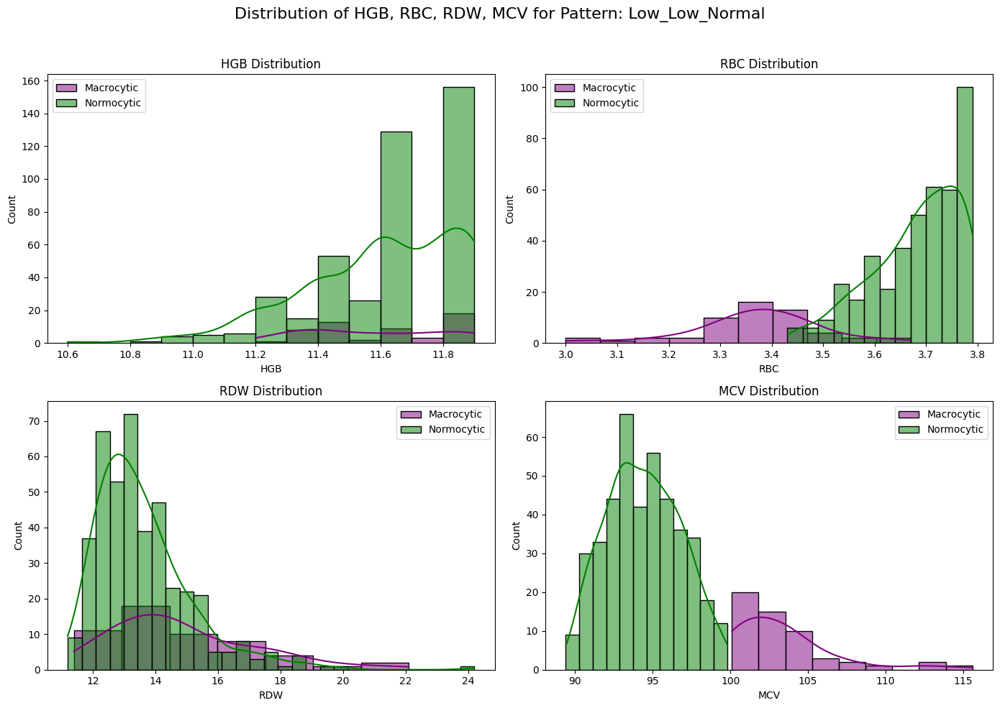


Pattern: Low_Low_Low
DataFrame for Macrocytic (>100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
1098,3.29,11.3,33.3,101.2,34.2,33.8,13.7,223.0,Low,Low,Low,30.759878,Macrocytic (>100)
1729,3.30,10.9,33.4,101.4,33.0,32.6,14.5,202.0,Low,Low,Low,30.727273,Macrocytic (>100)
1822,2.90,10.5,31.0,106.9,36.2,33.9,13.0,200.0,Low,Low,Low,36.862069,Macrocytic (>100)
4564,3.05,10.2,30.7,100.8,33.5,33.2,15.1,157.0,Low,Low,Low,33.049180,Macrocytic (>100)
8297,3.14,10.5,31.4,100.2,33.4,33.3,14.0,233.0,Low,Low,Low,31.910828,Macrocytic (>100)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
112126,3.17,10.8,32.8,103.5,34.2,33.0,13.5,340.0,Low,Low,Low,32.649842,Macrocytic (>100)
114203,3.22,11.2,33.3,103.3,34.6,33.6,15.2,294.0,Low,Low,Low,32.080745,Macrocytic (>100)
114689,3.03,10.5,32.6,107.6,34.5,32.1,15.2,163.0,Low,Low,Low,35.511551,Macrocytic (>100)
115086,2.76,10.2,28.3,102.6,37.0,36.1,14.9,211.0,Low,Low,Low,37.173913,Macrocytic (>100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,77.000000,77.000000,77.00000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000
mean,2.970649,10.502597,30.98961,104.441558,35.389610,33.896104,15.254545,211.480519,35.496411
std,0.262400,0.898533,2.53375,3.908067,1.767289,1.041310,3.055907,96.300873,4.079253
min,2.320000,8.200000,23.80000,100.100000,32.300000,32.100000,11.800000,41.000000,30.029851
25%,2.840000,10.100000,29.50000,101.200000,34.300000,33.000000,13.500000,152.000000,32.282958
50%,3.030000,10.700000,31.80000,103.500000,35.000000,33.800000,14.500000,200.000000,34.253247
75%,3.160000,11.200000,33.00000,106.900000,36.100000,34.500000,15.900000,251.000000,37.985612
max,3.350000,11.900000,33.80000,116.500000,41.000000,37.200000,30.500000,521.000000,47.025862



DataFrame for Normocytic (80-100):


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,HGB_Status,RBC_Status,HCT_Status,MentzerIndex,MCV_Category
15,3.57,10.9,33.3,93.0,30.4,32.7,14.1,219.0,Low,Low,Low,26.050420,Normocytic (80-100)
133,3.27,11.5,32.0,97.8,35.2,36.0,13.4,187.0,Low,Low,Low,29.908257,Normocytic (80-100)
159,3.51,11.1,32.6,92.8,31.6,34.2,11.8,229.0,Low,Low,Low,26.438746,Normocytic (80-100)
283,3.45,10.4,30.9,89.6,30.3,33.8,12.3,195.0,Low,Low,Low,25.971014,Normocytic (80-100)
326,3.78,10.6,30.9,81.8,28.0,34.2,13.1,280.0,Low,Low,Low,21.640212,Normocytic (80-100)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
115054,3.54,11.3,32.9,93.2,31.9,34.3,14.5,160.0,Low,Low,Low,26.327684,Normocytic (80-100)
115059,3.44,11.1,32.8,95.2,32.3,34.0,12.7,249.0,Low,Low,Low,27.674419,Normocytic (80-100)
115168,3.44,10.8,32.0,93.1,31.2,33.5,14.5,185.0,Low,Low,Low,27.063953,Normocytic (80-100)
115252,3.55,10.9,32.6,92.0,30.6,33.3,14.6,190.0,Low,Low,Low,25.915493,Normocytic (80-100)


,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000,1290.000000
mean,3.495752,10.704651,31.536202,90.330930,30.648295,33.925891,14.098450,261.864341,26.034025
std,0.251726,0.812830,2.161167,4.304869,1.835809,1.106331,2.188608,94.738779,2.926261
min,1.710000,5.900000,16.300000,80.200000,24.800000,29.100000,11.000000,13.000000,21.269841
25%,3.380000,10.300000,30.700000,87.500000,29.500000,33.300000,12.700000,204.000000,24.016228
50%,3.570000,10.900000,32.000000,90.400000,30.800000,33.900000,13.500000,248.000000,25.325906
75%,3.680000,11.300000,33.100000,93.200000,31.900000,34.700000,14.800000,307.000000,27.402581
max,3.790000,11.900000,33.900000,100.000000,37.900000,40.900000,37.500000,1000.000000,55.555556



DataFrame for Microcytic (<80):
         RBC  HGB   HCT   MCV   MCH  MCHC   RDW    PLT HGB_Status RBC_Status  \
2809    3.79  7.6  25.4  66.8  20.2  30.2  15.9  272.0        Low        Low   
4531    3.49  8.9  27.1  77.9  25.8  33.2  15.9  208.0        Low        Low   
4583    3.67  8.8  27.5  75.1  24.0  32.1  15.1  639.0        Low        Low   
5881    3.76  9.1  28.3  75.3  24.2  32.3  17.6  325.0        Low        Low   
6632    3.70  7.4  25.2  67.9  20.0  29.4  19.7  459.0        Low        Low   
...      ...  ...   ...   ...   ...   ...   ...    ...        ...        ...   
110457  2.74  7.2  19.9  72.6  26.2  36.0  27.0  427.0        Low        Low   
110791  3.58  8.4  27.3  76.2  23.4  30.7  16.5  188.0        Low        Low   
111722  3.58  8.0  25.9  72.5  22.5  31.0  15.9  244.0        Low        Low   
113934  2.93  6.8  22.8  77.6  23.0  29.7  18.9  295.0        Low        Low   
114529  3.56  9.7  28.1  78.8  27.2  34.6  13.7  150.0        Low        Low   

      

,RBC,HGB,HCT,MCV,MCH,MCHC,RDW,PLT,MentzerIndex
count,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000
mean,3.568061,8.239796,25.937755,72.719388,23.126531,31.702041,18.193878,331.622449,20.480045
std,0.227549,1.223965,2.903411,6.830988,3.149196,1.866193,3.502188,143.969464,2.471447
min,2.740000,5.800000,19.700000,55.400000,16.400000,27.800000,13.000000,57.000000,14.892473
25%,3.490000,7.300000,23.450000,67.600000,20.525000,30.600000,15.900000,222.000000,18.836245
50%,3.645000,8.400000,26.000000,75.700000,24.050000,31.550000,17.600000,305.000000,20.806338
75%,3.737500,9.075000,28.475000,78.000000,25.375000,32.900000,19.800000,426.250000,21.750784
max,3.790000,10.400000,30.300000,80.000000,28.100000,36.200000,31.800000,757.000000,26.496350


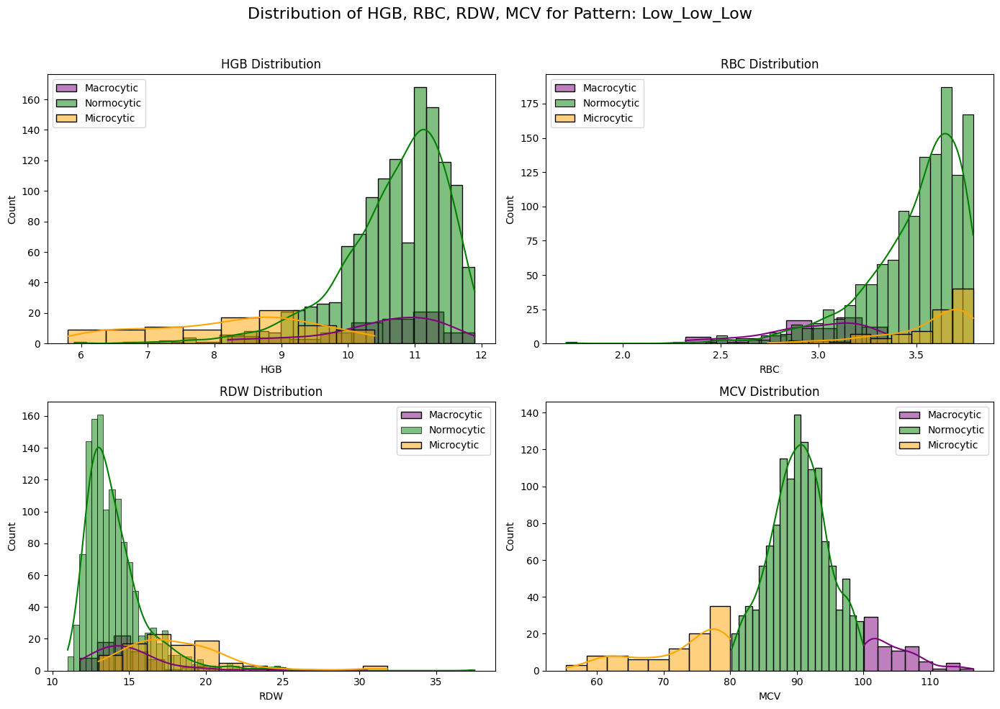

In [46]:
 # Moderate Anemia [ clearly pattern (Microcytosis  or normo)] :Low_Normal_Normal"(pre low hct) 
anemia = [ "Low_Low_Normal", "Low_Low_Low"]


for pattern in anemia :
    print(f"\nPattern: {pattern}")
    macrocytic_df, normocytic_df, microcytic_df =classify_mcv_status(pattern)
    
    
    if not macrocytic_df.empty:
        print("DataFrame for Macrocytic (>100):")
        macrocytic_df
        macrocytic_df.describe()
    
    
    if not normocytic_df.empty:
        
        print("\nDataFrame for Normocytic (80-100):")
        normocytic_df
        normocytic_df.describe()
    
    if not microcytic_df.empty:
        print("\nDataFrame for Microcytic (<80):")
        print(microcytic_df)
        microcytic_df.describe()
    plot_distribution_by_category(pattern)

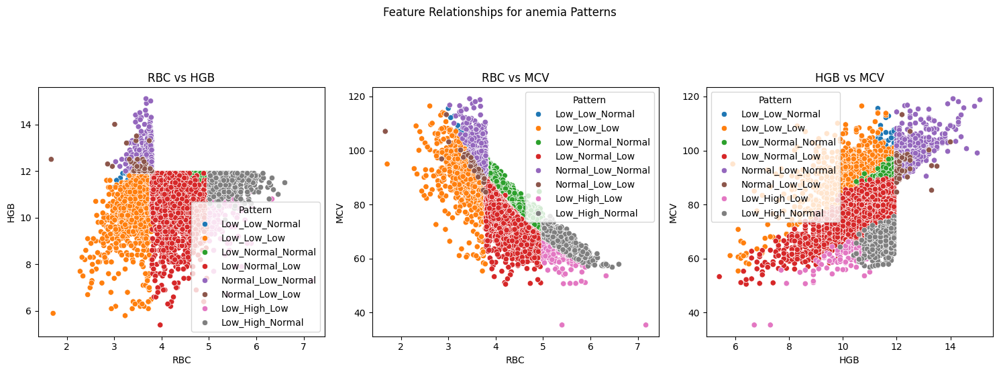

In [47]:
All_anemia =anemia+moderate_anemia_patterns+early_macro_patterns+early_micro_patterns
plot_group_relationships(All_anemia, "anemia Patterns")

No data available for pattern: High_High_Normal


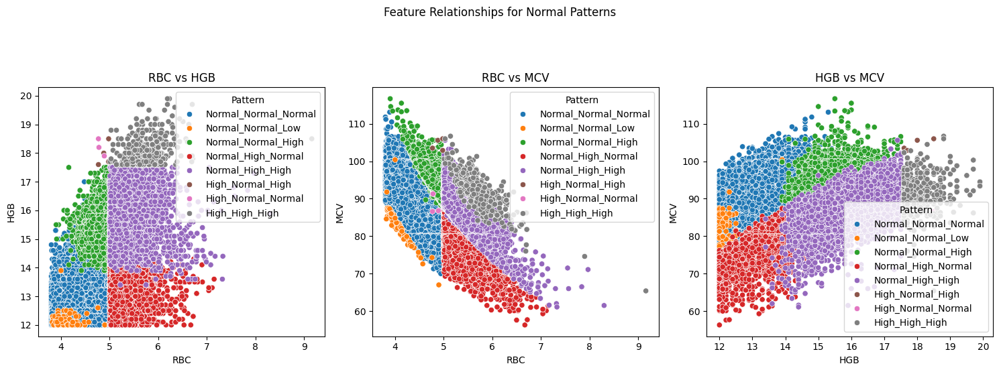

In [48]:
plot_group_relationships(normal_patterns, "Normal Patterns")

No data available for pattern: High_High_Normal
No data available for pattern: Low_Normal_High
No data available for pattern: Low_High_High
No data available for pattern: High_Low_Normal
No data available for pattern: High_Low_Low
No data available for pattern: High_Low_High
No data available for pattern: High_High_Low
No data available for pattern: Normal_Low_High
No data available for pattern: High_Low_Low
No data available for pattern: High_Low_High
No data available for pattern: Low_Low_High
No data available for pattern: Low_High_High
No data available for pattern: High_Normal_Low


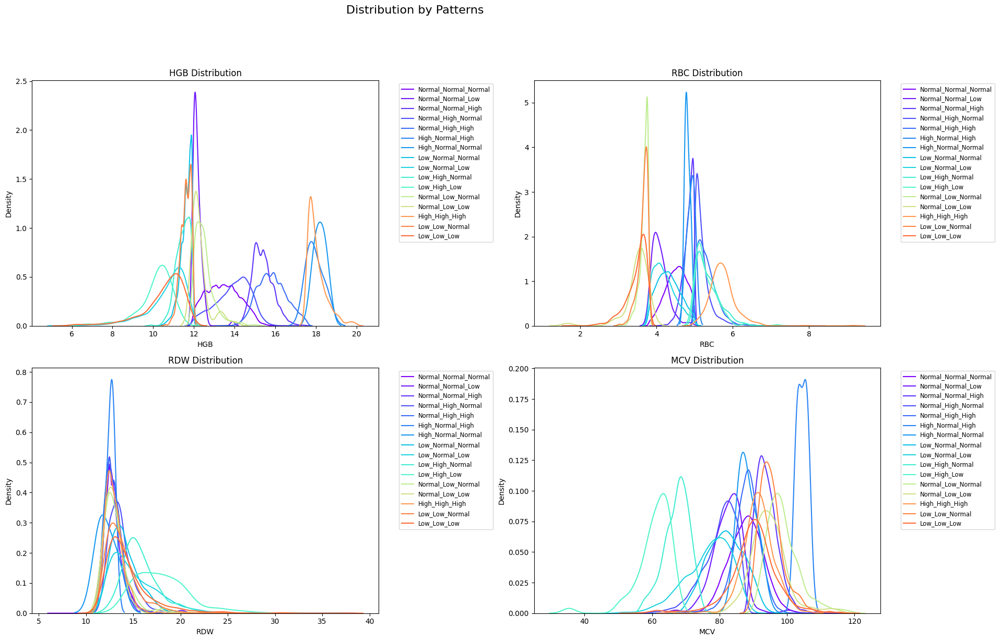

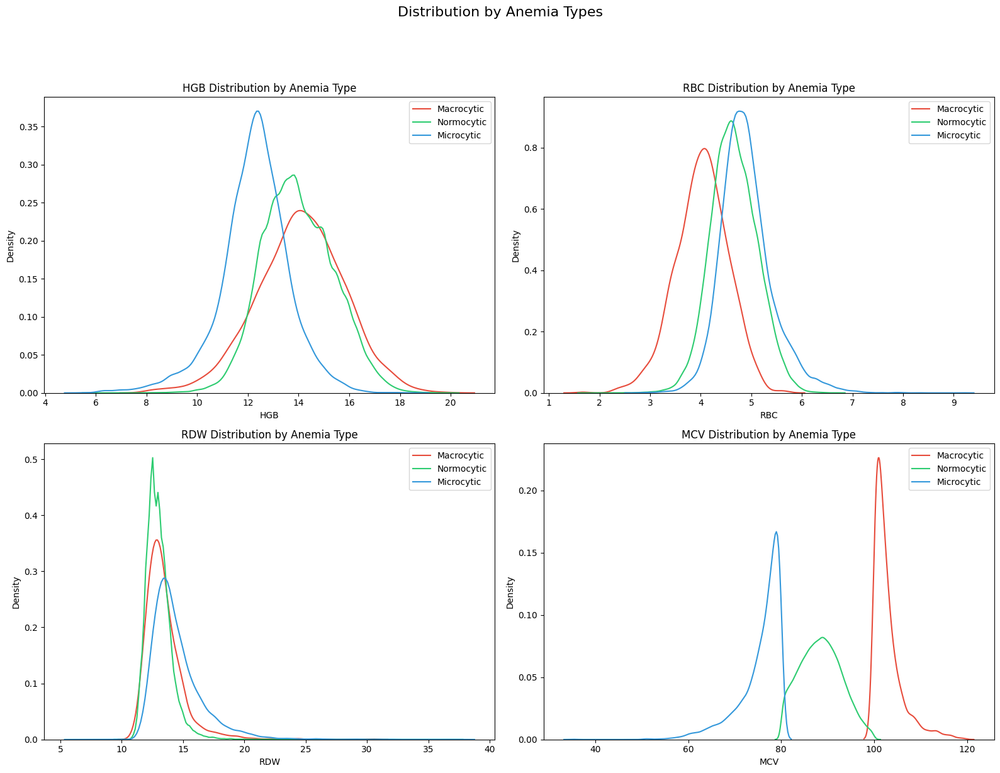

In [49]:
patterns = [
    "Normal_Normal_Normal", "Normal_Normal_Low", "Normal_Normal_High",
    "Normal_High_Normal", "Normal_High_High", "High_Normal_High",
    "High_Normal_Normal", "High_High_Normal", "Low_Normal_Normal",
    "Low_Normal_Low", "Low_Normal_High", "Low_High_Normal",
    "Low_High_Low", "Low_High_High", "High_Low_Normal",
    "High_Low_Low", "High_Low_High", "High_High_Low",
    "Normal_Low_Normal", "Normal_Low_Low", "Normal_Low_High",
    "High_Low_Low", "High_Low_High", "High_High_High",
    "Low_Low_Normal", "Low_Low_Low", "Low_Low_High",
    "Low_High_High", "High_Normal_Low"
]

# patterns = [
#             "Normal_Normal_Normal", "Normal_Normal_Low", "Normal_Normal_High",
#             "Normal_High_Normal", "Normal_High_High", "High_Normal_High",
#             "High_Normal_Normal" , "High_High_Normal" ,"Low_High_Low", "Low_High_Normal",
#             "Normal_Low_Normal", "Normal_Low_Low" , "Low_Normal_Normal", "Low_Normal_Low",
#             "Low_Low_Normal", "Low_Low_Low"
#         ]

anemia = [ "Low_Low_Normal", "Low_Low_Low"]

plot_distribution_by_patterns(patterns, df_rbc)

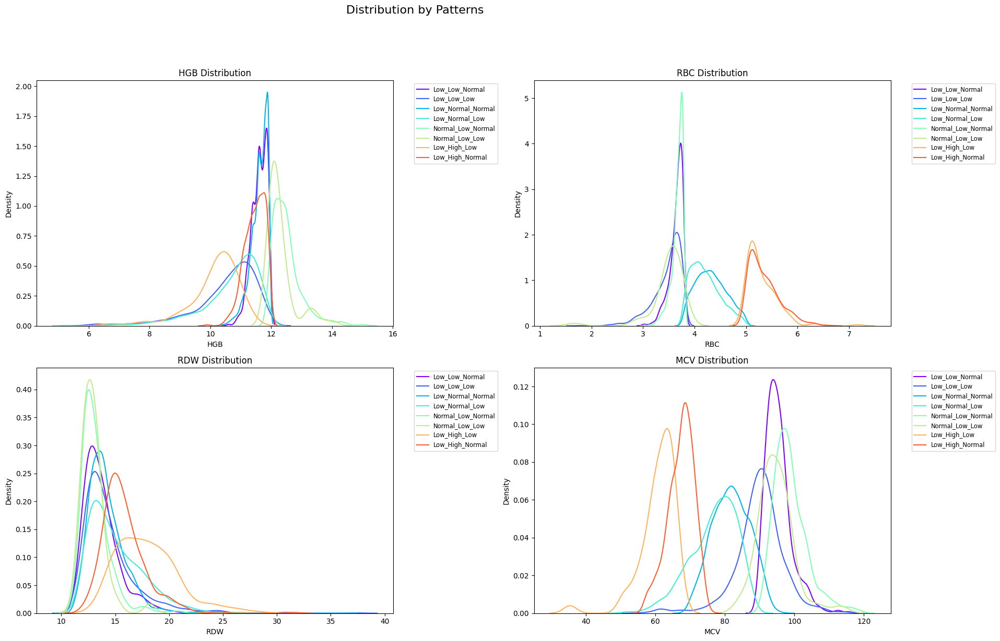

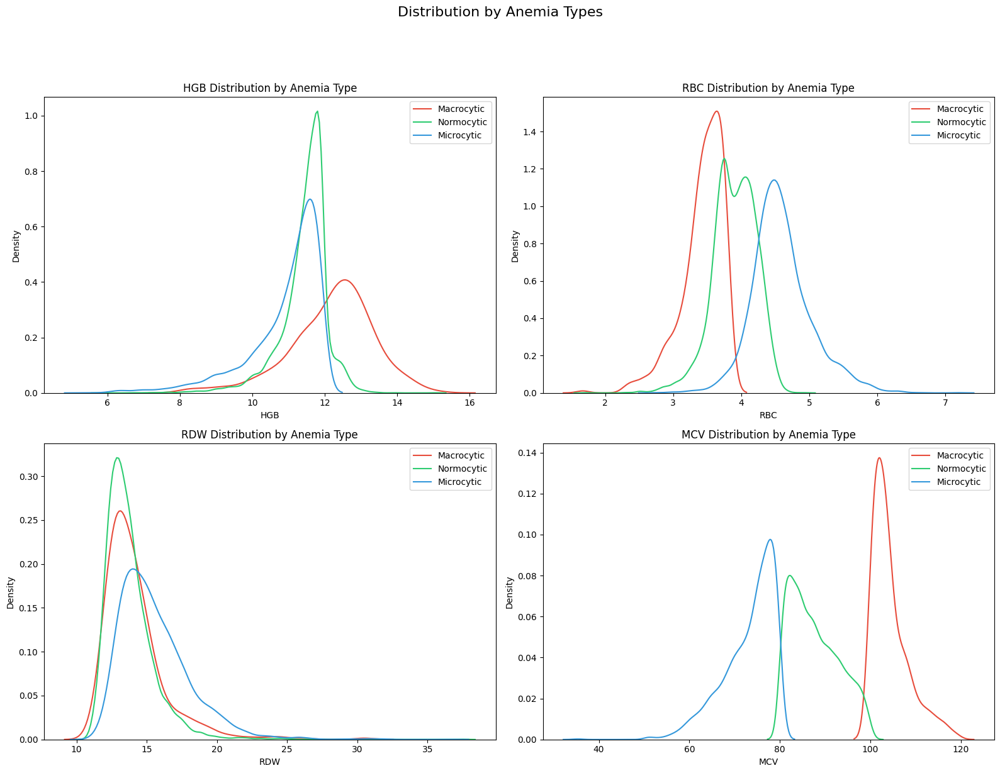

In [50]:
plot_distribution_by_patterns(All_anemia, df_rbc)

No data available for pattern: High_High_Normal


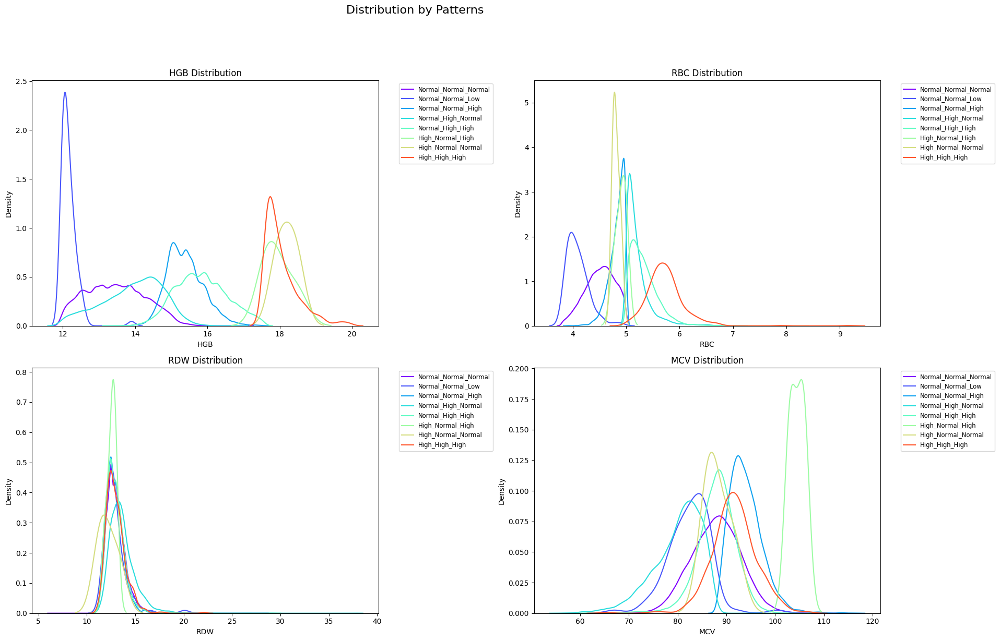

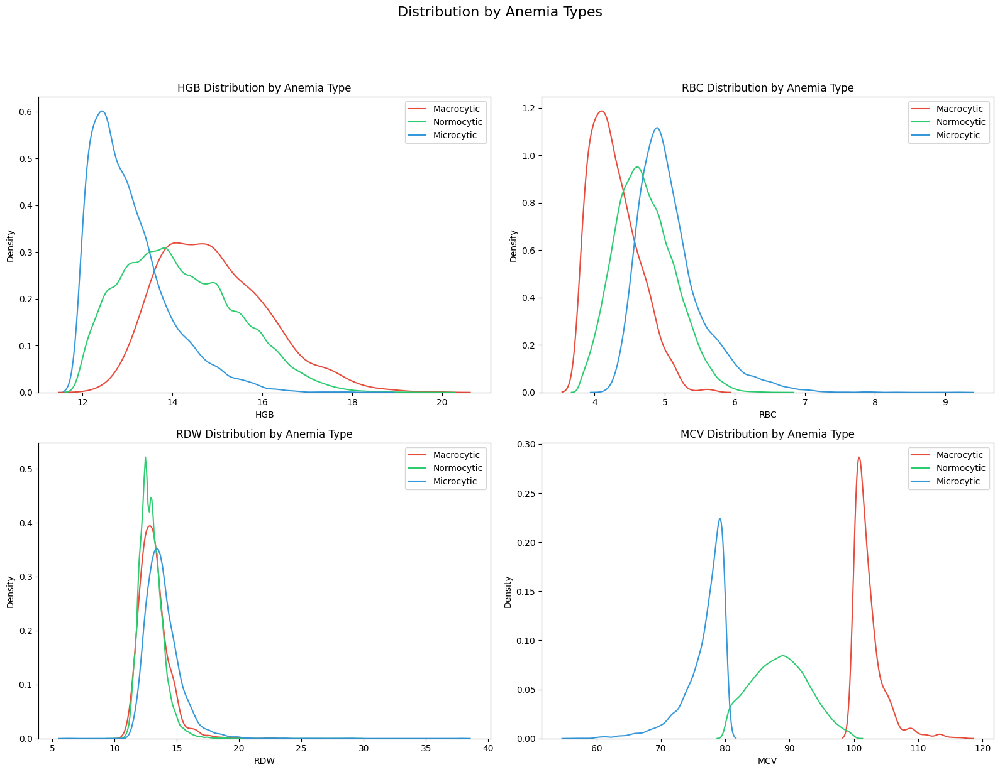

In [51]:
plot_distribution_by_patterns(normal_patterns, df_rbc)

# 3.3.2 Blood Pattern Analysis Report

# 🩸 Comprehensive Blood Pattern Analysis
## A Novel Approach to Blood Disorder Classification

## 📊 Executive Summary
### This comprehensive analysis explores various hematological patterns identified through the systematic evaluation of RBC indices, providing crucial insights into disease progression and diagnostic classifications. The study reveals distinct


## 🔬 Pattern Classification Framework
### Pattern Notation Explained
`X_Y_Z` Representation:
-  X: Hemoglobin (HGB) Status
-  Y: Red Blood Cells (RBC) Status
-  Z: Hematocrit (HCT) Status

## 1. 🟢 Normal State Patterns

### 1.1 Normal_Normal_Normal Pattern
**Key Characteristics:**
- 💡 Predominant normocytic population
- Minimal macrocytic/microcytic presence
- Uniform HGB distribution

**Clinical Significance:**
- ✅ Baseline healthy population reference
- Standard for pattern deviation analysis

## 2. 🟠 Transitional Patterns

### 2.1 Normal_Normal_Low Pattern
**Transition Features:**
- Limited data distribution
- Emerging microcytic tendency
- Key Markers:
  * Decreasing HGB
  * Elevated RDW and RBC

**Clinical Implications:**
- 🚨 Early blood disorder indicator
- Initial compensatory phase detection

### 2.2 Normal_High_Normal Pattern
**Detailed Characteristics:**
- Balanced normocytic/microcytic distribution
- Specific Parameters:
  * Normocytic MCV mean = 83.4
  * Stable HGB
  * Unique RBC decay patterns

**Clinical Importance:**
- Early warning mechanism
- Compensatory system activation signal




## 3. 🔴 Critical Patterns

### 3.1 Low_High Patterns (Low_High_Low & Low_High_Normal)
<img src="../images/mermaid-diagram-3.png" width="400" height="400" style="vertical-align:middle;margin:0px 50px">

#### A. Thalassemia Variant
**Diagnostic Criteria:**
- Exclusively microcytic population
- 🔬 Critical Parameters:
  * MCV < 65 fL
  * High RDW
  * Mentzer Index < 12.5
  * Elevated RBC

**Clinical Implications:**
- Strong indication of beta thalassemia trait
- Requires:
  * Hemoglobin electrophoresis
  * Family screening
  * Genetic counseling

#### B. Other Variants
**Characteristics:**
- Mixed cell populations
- Less severe parameter deviations
- May indicate combined anemia states

### 3.2 Low_Normal Patterns
**Progressive Stages:**
<img src="../images/mermaid-diagram-4.png" width="800" height="400" style="vertical-align:middle;margin:0px 50px">


**Key Features:**
- Bimodal distribution between normocytic and microcytic cells
- Progressive RDW elevation
- HGB decline patterns

**Clinical Significance:**
- Demonstrates clear disease progression pathway
- Critical monitoring points for intervention

## 4. 📉  Anemic Patterns

### 4.1 Normal_Low Patterns
**Characteristics:**
- HGB < 12.5 g/dL
- Increased MCV tendency
- Absence of microcytic cells

**Clinical Significance:**
- 🚨 Clear progression toward macrocytic anemia
- Requires B12/folate evaluation

### 4.2 Low_Low_Low Pattern
**Features:**
- Predominant normocytic anemia
- Distinctive RDW patterns:
  * Normal in normocytic cases
  * Elevated in microcytic cases

**Differential Diagnosis:**
- Iron deficiency (when Mentzer index > 13)
- Chronic disease anemia
- Excludes thalassemia based on indices

## 5. 🔄 Pattern Progression Models

### 5.1 Microcytic Progression
```
Normal → Normal_High_Normal → Low_Normal → Low_High
```

### 5.2 Macrocytic Progression
```
Normal → Normal_Low_Normal → Low_Low_Normal → Low_Low_Low
```
## 6. 📋 Comprehensive Pattern Analysis

| Pattern | HGB | RBC | HCT | Clinical Significance | Intervention |
|:-------:|:---:|:---:|:---:|:---------------------|:-------------|
| Normal_Normal_Normal | 🟢 | 🟢 | 🟢 | Baseline Health | Monitoring |
| Normal_High_Normal | 🟢 | 🔵 | 🟢 | Early Compensation | Assessment |
| Low_Normal_Normal | 🔴 | 🟢 | 🟢 | Initial Anemia | Evaluation |
| Low_High_Low | 🔴 | 🔵 | 🔴 | Potential Thalassemia | Screening |
| Low_Low_Low | 🔴 | 🔴 | 🔴 | Advanced Anemia | Intervention |



## 7. Clinical Applications

### 7.1 Diagnostic Approach
1. **Pattern Identification**
   - Initial pattern classification
   - Parameter trend analysis

2. **Risk Assessment**
   - Pattern progression evaluation
   - Compensatory mechanism identification

3. **Intervention Planning**
   - Pattern-specific treatment approaches
   - Monitoring strategy development

### 7.2 Monitoring Recommendations
- Regular pattern transition assessment
- Critical parameter tracking
- Early intervention timing

## 8. Research Implications

### 8.1 Novel Findings
- Pattern mirror phenomena in anemia development
- Compensatory mechanism identification
- Early warning pattern recognition

### 8.2 Future Directions
- Pattern-based screening protocols
- Automated pattern recognition systems
- Predictive model development

# 9. Conclusions
<span style="font-size:18px; color: #FF5733;">
This comprehensive analysis provides a novel framework for understanding and classifying hematological disorders through pattern recognition. The identified patterns offer crucial insights into disease progression and aid in early intervention strategies.
</span>


## Key Recommendations
1. Implement pattern-based monitoring systems
2. Establish early intervention protocols
3. Develop pattern-specific treatment guidelines
4. Initiate pattern-based screening programs

---
**Note ⚠️ :** This analysis represents a significant advance in hematological pattern recognition and disease classification, offering new perspectives for clinical practice and research directions.

-----------

The study of Red Blood Cells (RBC) has been completed, while White Blood Cells (WBC) and Platelets (PLT) are still **in progress**,
with their interrelationship awaiting further analysis.
